In [1]:
!pip install librosa soundfile ruptures

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 34.7 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import librosa
import soundfile as sf
import numpy as np
import ruptures as rpt
import os

# Load audio
audio_file = "/content/drive/MyDrive/colab_datas/isp_comm/bird_sound_shorts_1.m4a"

y, sr = librosa.load(audio_file, sr=16000)

# MFCC features
mfcc = librosa.feature.mfcc(
    y=y,
    sr=sr,
    n_mfcc=20,
    hop_length=160,
    n_fft=400
).T

# Change point detection
algo = rpt.Pelt(model="rbf").fit(mfcc)
breaks = algo.predict(pen=8)

hop = 160

os.makedirs("segments", exist_ok=True)

start = 0

for i, end_frame in enumerate(breaks):
    end = end_frame * hop

    if end - start < sr * 0.15:
        continue

    segment = y[start:end]

    sf.write(
        f"segments/segment_{i:04d}.wav",
        segment,
        sr
    )

    start = end

print("Done")

/tmp/ipykernel_1193/3650775173.py:10: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file, sr=16000)
/usr/local/lib/python3.12/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Done


In [4]:
import librosa
import numpy as np
import ruptures as rpt
from IPython.display import Audio, display, Markdown

#audio_file = "/content/input.wav"
audio_file = "/content/drive/MyDrive/colab_datas/isp_comm/bird_sound_shorts_1.m4a"

# Load audio
y, sr = librosa.load(audio_file, sr=16000)

# Extract MFCC features
mfcc = librosa.feature.mfcc(
    y=y,
    sr=sr,
    n_mfcc=20,
    hop_length=160,
    n_fft=400
).T

# Detect change points
algo = rpt.Pelt(model="rbf").fit(mfcc)
breaks = algo.predict(pen=8)

hop = 160
start = 0

print(f"Detected {len(breaks)} candidate segments\n")

for i, end_frame in enumerate(breaks):
    end = end_frame * hop

    # Skip segments shorter than 150 ms
    if end - start < int(sr * 0.15):
        continue

    segment = y[start:end]

    duration = len(segment) / sr

    display(Markdown(
        f"### Segment {i+1}\n"
        f"- Start: **{start/sr:.2f} s**\n"
        f"- End: **{end/sr:.2f} s**\n"
        f"- Duration: **{duration:.2f} s**"
    ))

    display(Audio(segment, rate=sr))

    start = end

/tmp/ipykernel_1193/3315664811.py:10: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file, sr=16000)
/usr/local/lib/python3.12/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Detected 11 candidate segments



### Segment 1
- Start: **0.00 s**
- End: **3.25 s**
- Duration: **3.25 s**

### Segment 2
- Start: **3.25 s**
- End: **4.35 s**
- Duration: **1.10 s**

### Segment 3
- Start: **4.35 s**
- End: **5.95 s**
- Duration: **1.60 s**

### Segment 4
- Start: **5.95 s**
- End: **8.65 s**
- Duration: **2.70 s**

### Segment 5
- Start: **8.65 s**
- End: **9.45 s**
- Duration: **0.80 s**

### Segment 6
- Start: **9.45 s**
- End: **10.20 s**
- Duration: **0.75 s**

### Segment 7
- Start: **10.20 s**
- End: **11.20 s**
- Duration: **1.00 s**

### Segment 8
- Start: **11.20 s**
- End: **12.50 s**
- Duration: **1.30 s**

### Segment 9
- Start: **12.50 s**
- End: **13.45 s**
- Duration: **0.95 s**

### Segment 10
- Start: **13.45 s**
- End: **14.30 s**
- Duration: **0.85 s**

### Segment 11
- Start: **14.30 s**
- End: **15.77 s**
- Duration: **1.47 s**

DISPLAY

/tmp/ipykernel_1193/497986913.py:9: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file, sr=None, mono=True)
/usr/local/lib/python3.12/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Sample Rate: 44100
Duration: 1.00 seconds
Samples: 44000


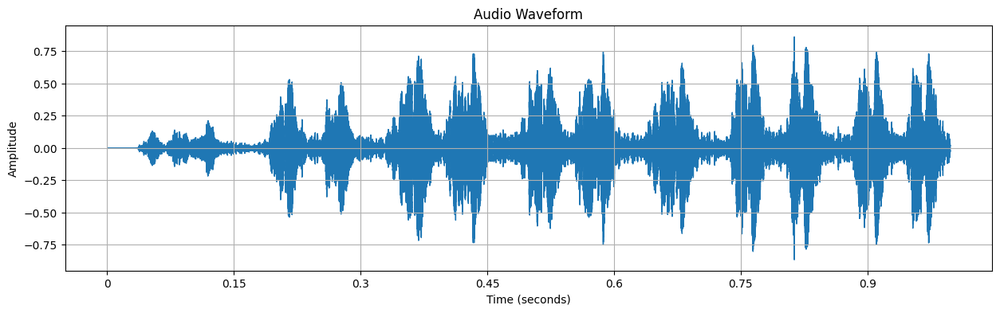

In [5]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Path to your audio
#audio_file = "/content/input.wav"

# Load audio
y, sr = librosa.load(audio_file, sr=None, mono=True)

def show_audio(y, sr):
  print(f"Sample Rate: {sr}")
  print(f"Duration: {len(y)/sr:.2f} seconds")
  print(f"Samples: {len(y)}")

  # Plot waveform
  plt.figure(figsize=(15,4))
  librosa.display.waveshow(y, sr=sr)
  plt.title("Audio Waveform")
  plt.xlabel("Time (seconds)")
  plt.ylabel("Amplitude")
  plt.grid(True)
  plt.show()


show_audio(y[:44000], sr)

/tmp/ipykernel_1193/2797671309.py:59: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file, sr=None)
/usr/local/lib/python3.12/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


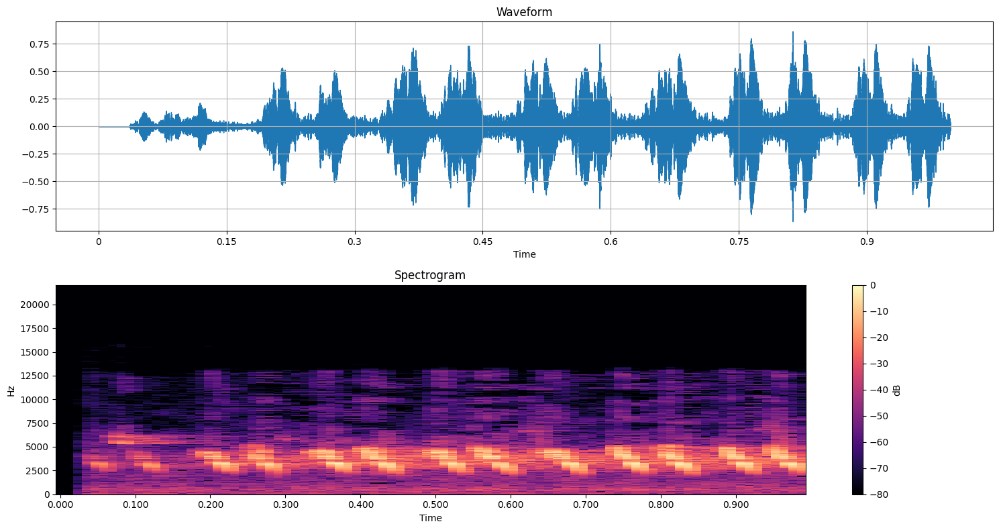

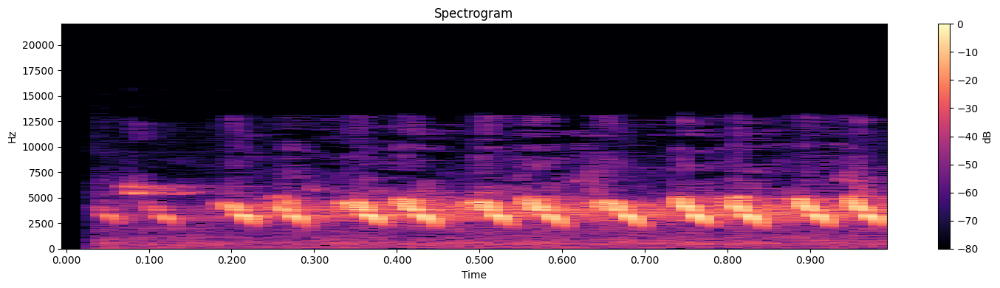

In [6]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

#audio_file = "/content/input.wav"

def show_audio_wave_and_spec(y, sr):
  plt.figure(figsize=(15,8))

  # Waveform
  plt.subplot(2,1,1)
  librosa.display.waveshow(y, sr=sr)
  plt.title("Waveform")
  plt.grid(True)

  # Spectrogram
  D = librosa.amplitude_to_db(
      np.abs(librosa.stft(y)),
      ref=np.max
  )

  plt.subplot(2,1,2)
  librosa.display.specshow(
      D,
      sr=sr,
      x_axis='time',
      y_axis='hz',
      cmap='magma'
  )
  plt.colorbar(label='dB')
  plt.title("Spectrogram")

  plt.tight_layout()
  plt.show()

def show_audio_spectro(y, sr):
  plt.figure(figsize=(15,4))

  # Spectrogram
  D = librosa.amplitude_to_db(
      np.abs(librosa.stft(y)),
      ref=np.max
  )

  librosa.display.specshow(
      D,
      sr=sr,
      x_axis='time',
      y_axis='hz',
      cmap='magma'
  )
  plt.colorbar(label='dB')
  plt.title("Spectrogram")

  plt.tight_layout()
  plt.show()

y, sr = librosa.load(audio_file, sr=None)
show_audio_wave_and_spec(y[0:44000],sr)
show_audio_spectro(y[0:44000],sr)



### BAND PASS FILTERS

| Source          |              Suggested Band |
| --------------- | --------------------------: |
| Human speech    |                 300–4000 Hz |
| Children        |                 250–6000 Hz |
| Birds           |               1000–10000 Hz |
| Dogs            |                 200–8000 Hz |
| Unknown species | 50 Hz to 0.45 × sample_rate |




In [7]:
# band pass filter

import numpy as np
from scipy.signal import butter, filtfilt

def bandpass_filter(signal,
                    sample_rate,
                    lowcut=300,
                    highcut=4000,
                    order=4):
    """
    Butterworth zero-phase band-pass filter.

    Parameters
    ----------
    signal : np.ndarray
        1D audio signal.
    sample_rate : int
        Sample rate in Hz.
    lowcut : float
        Low cutoff frequency (Hz).
    highcut : float
        High cutoff frequency (Hz).
    order : int
        Filter order.

    Returns
    -------
    np.ndarray
        Filtered signal.
    """

    signal = np.asarray(signal, dtype=np.float32)

    nyquist = sample_rate * 0.5

    low = lowcut / nyquist
    high = highcut / nyquist

    if low <= 0:
        low = 1e-6
    if high >= 1:
        high = 0.999999

    b, a = butter(order, [low, high], btype="band")

    return filtfilt(b, a, signal)

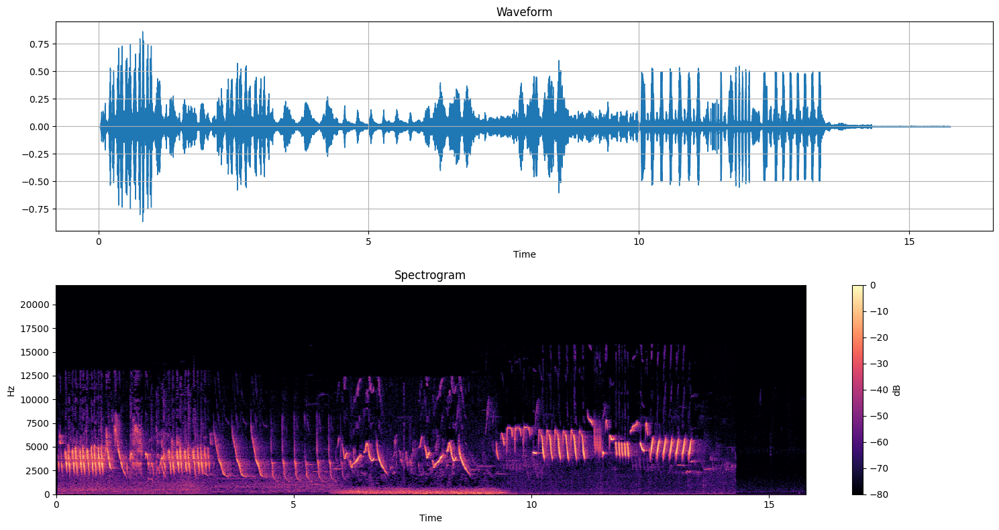

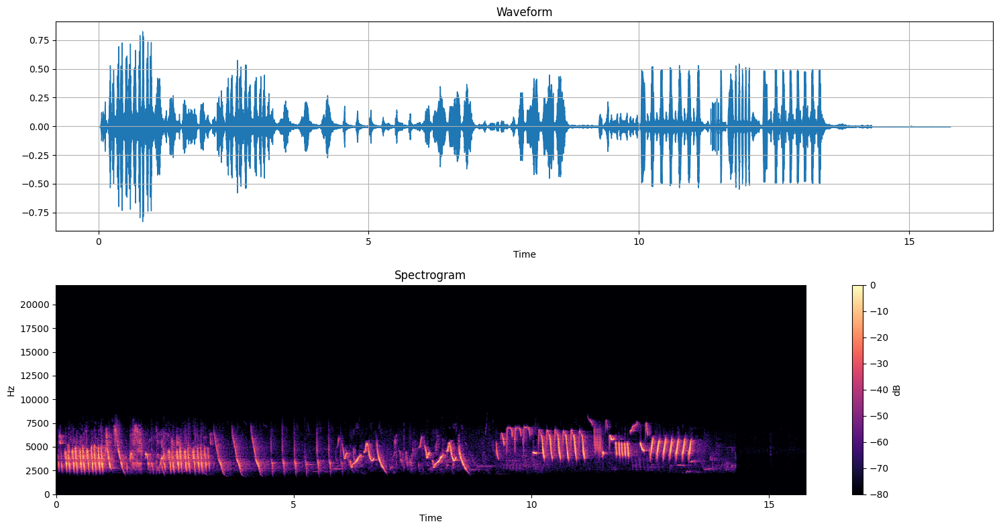

In [8]:
#band pass tests
filtered = bandpass_filter(
    y,
    sample_rate=sr,
    lowcut=2500,
    highcut=7000
)

show_audio_wave_and_spec(y,sr)
show_audio_wave_and_spec(filtered,sr)


ENERGY ACCUMULATION


Sample Rate: 44100
Duration: 1.41 seconds
Samples: 62000


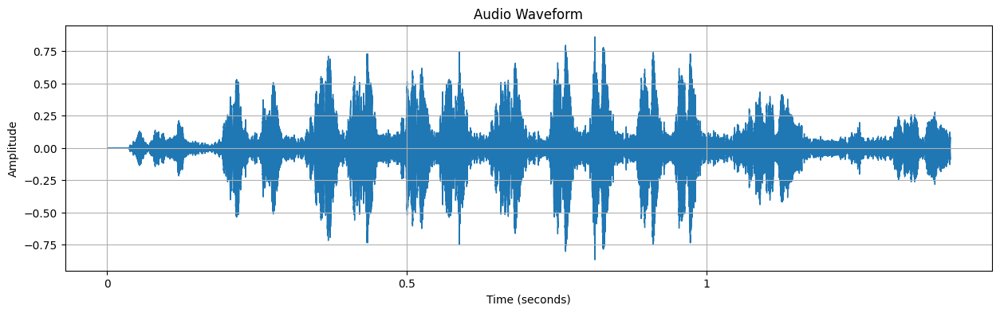

Sample Rate: 44100
Duration: 1.41 seconds
Samples: 62000


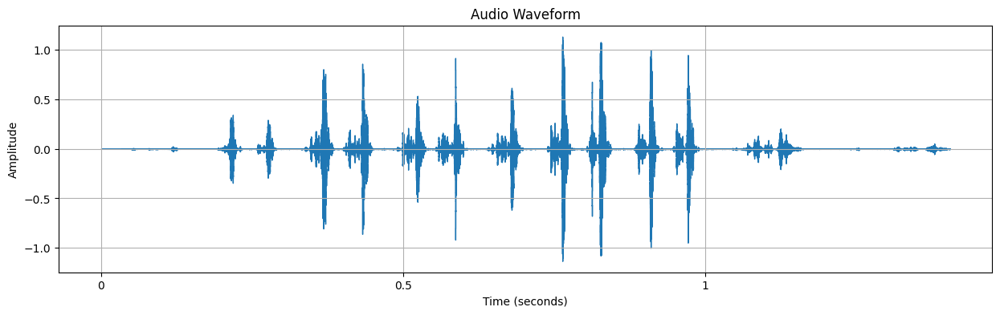

Sample Rate: 44100
Duration: 1.41 seconds
Samples: 62000


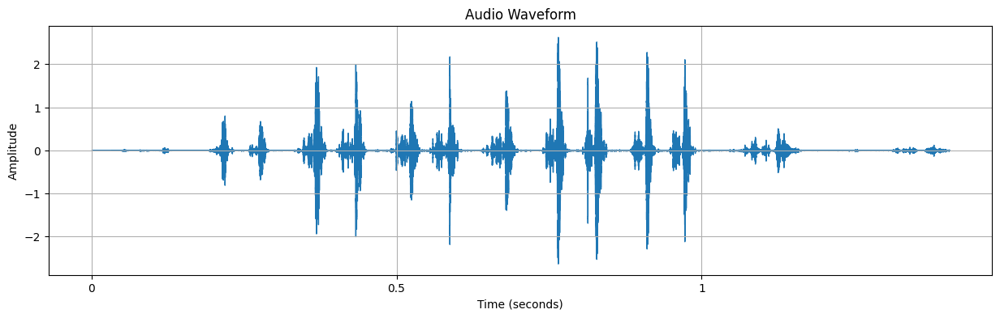

Sample Rate: 44100
Duration: 1.41 seconds
Samples: 62000


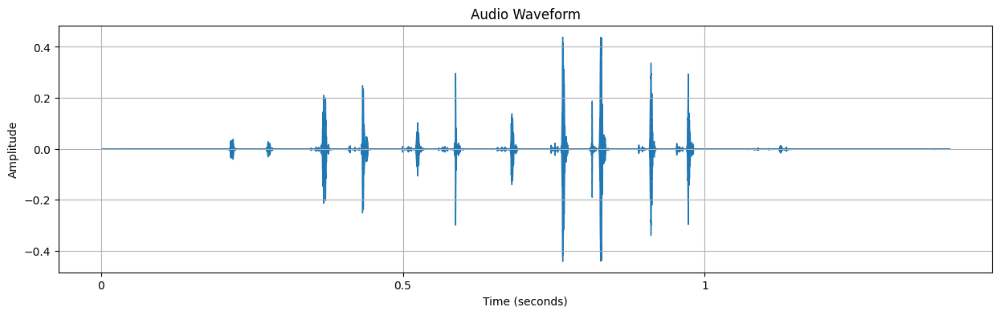

In [9]:
import numpy as np
import math

def accumulate_energy(signal, radius=5, decay=0.8, normalize=False):
    """
    Accumulate energy from nearby samples.

    Parameters
    ----------
    signal : np.ndarray
        1D input array.
    radius : int
        Number of neighbors on each side.
    decay : float
        Weight decay per distance.
        1.0 = equal weights
        0.8 = exponential decay
        0.0 = only current sample
    normalize : bool
        Divide by total weights.

    Returns
    -------
    np.ndarray
        Energy accumulated at each position.
    """
    signal = np.asarray(signal, dtype=np.float32)

    distances = np.arange(-radius, radius + 1)
    weights = decay ** np.abs(distances)

    #weights = np.log10(weights)

    if normalize:
        weights /= weights.sum()

    return np.convolve(signal, weights, mode="same")

def local_energy(signal, radius=5):
    signal = np.asarray(signal, dtype=np.float32)
    energy = signal ** 3
    kernel = np.ones(2 * radius + 1)
    return np.convolve(energy, kernel, mode="same")

import numpy as np

def gaussian_local_energy(signal, sigma=20, radius=None, normalize=True):
    """
    Gaussian-weighted local energy envelope.

    Parameters
    ----------
    signal : np.ndarray
        1D audio waveform.
    sigma : float
        Standard deviation of Gaussian (samples).
    radius : int or None
        Kernel radius. Default = 3*sigma.
    normalize : bool
        Normalize kernel to sum to 1.

    Returns
    -------
    np.ndarray
        Smoothed local energy envelope.
    """

    signal = np.asarray(signal, dtype=np.float32)

    # Instantaneous energy
    energy = signal ** 2

    if radius is None:
        radius = int(np.ceil(3 * sigma))

    x = np.arange(-radius, radius + 1)

    kernel = np.exp(-(x ** 2) / (2 * sigma ** 2))

    if normalize:
        kernel /= kernel.sum()

    envelope = np.convolve(energy, kernel, mode="same")

    return envelope

show_audio(y[0:62000],sr)

#energy = accumulate_energy(y[0:22000],radius=20, decay=0.5,  normalize=False);
energy = local_energy(y[0:62000],radius=5);
#print(energy)
show_audio(energy,sr)

acc_energy = accumulate_energy(energy,radius=50, decay=0.59,  normalize=False);
show_audio(acc_energy,sr)


gl_energy = gaussian_local_energy(energy,  sigma=5, radius=50)
show_audio(gl_energy,sr)

Gaussian RMS


| Audio Type       |  sigma_ms |
| ---------------- | --------: |
| Fast speech      |     10–15 |
| Normal speech    |    **20** |
| Slow speech      |        30 |
| Bird calls       |      5–10 |
| Whale sounds     |    50–200 |
| Unknown language | **20–30** |




In [10]:
import numpy as np

def gaussian_rms_envelope(audio,
                          sigma_ms=20,
                          sample_rate=16000,
                          truncate=3.0):
    """
    Compute a Gaussian-smoothed RMS energy envelope.

    Parameters
    ----------
    audio : np.ndarray
        1D mono audio signal.

    sigma_ms : float
        Gaussian sigma in milliseconds.
        Typical:
            10 ms = follows syllables closely
            20 ms = speech (recommended)
            40 ms = smoother envelope

    sample_rate : int
        Audio sample rate.

    truncate : float
        Kernel radius = truncate * sigma.

    Returns
    -------
    envelope : np.ndarray
        RMS energy envelope.
    """

    audio = np.asarray(audio, dtype=np.float32)

    # Convert milliseconds to samples
    sigma = sigma_ms * sample_rate / 1000.0

    radius = int(np.ceil(truncate * sigma))

    # Gaussian kernel
    x = np.arange(-radius, radius + 1)

    kernel = np.exp(-(x ** 2) / (2 * sigma ** 2))
    kernel /= kernel.sum()

    # Instantaneous power
    power = audio * audio

    # Smooth power
    smooth_power = np.convolve(power, kernel, mode="same")

    # RMS
    envelope = np.sqrt(smooth_power + 1e-12)

    return envelope


import matplotlib.pyplot as plt

def show_envelope_on_bpf_filtered(bpf_audio, envelope_aud ):
  plt.figure(figsize=(18,5))

  plt.plot(bpf_audio,
          alpha=0.35,
          label="Filtered audio")

  plt.plot(envelope_aud,
          linewidth=2,
          label="Gaussian RMS")

  plt.legend()

  plt.tight_layout()
  plt.show()

Adaptive threshold

In [11]:
import numpy as np

def adaptive_threshold(envelope,
                       sensitivity=3.0,
                       smooth=0):
    """
    Compute an adaptive threshold for an energy envelope.

    Parameters
    ----------
    envelope : np.ndarray
        Gaussian RMS or energy envelope.
    sensitivity : float
        Higher values -> fewer detected words.
        Lower values -> more sensitive.
        Typical: 2.0 to 4.0
    smooth : int
        Optional moving-average smoothing of threshold.
        0 = constant threshold.

    Returns
    -------
    threshold : np.ndarray
        Threshold array (same length as envelope).
    """

    envelope = np.asarray(envelope, dtype=np.float32)

    # Robust estimate of background energy
    median = np.median(envelope)

    mad = np.median(np.abs(envelope - median))

    # Convert MAD to standard deviation estimate
    sigma = 1.4826 * mad

    th = median + sensitivity * sigma

    threshold = np.full_like(envelope, th)

    if smooth > 1:
        kernel = np.ones(smooth, dtype=np.float32)
        kernel /= kernel.sum()
        threshold = np.convolve(threshold, kernel, mode="same")

    return threshold

# threshold = adaptive_threshold(
#     envelope,
#     sensitivity=2.8
# )

# speech_mask = envelope > threshold

import numpy as np
from scipy.ndimage import median_filter

def adaptive_threshold_local(envelope,
                             window=4000,
                             sensitivity=2.5):
    """
    Local adaptive threshold using rolling median + MAD.

    window : window size in samples
    """

    envelope = np.asarray(envelope, dtype=np.float32)

    med = median_filter(envelope, size=window, mode="reflect")

    deviation = np.abs(envelope - med)

    mad = median_filter(deviation, size=window, mode="reflect")

    sigma = 1.4826 * mad

    threshold = med + sensitivity * sigma

    return threshold

# threshold = adaptive_threshold_local(
#     envelope,
#     window=int(0.5 * sr),   # 500 ms window
#     sensitivity=2.5
# )

# speech_mask = envelope > threshold

Detect energy peaks

In [12]:
import numpy as np
from scipy.signal import find_peaks


def detect_energy_peaks(
    envelope,
    sample_rate,
    min_peak_distance_ms=80,
    threshold_factor=2.5,
    prominence_factor=1.0,
):
    """
    Detect peaks in an energy envelope.

    Parameters
    ----------
    envelope : np.ndarray
        Gaussian RMS envelope.

    sample_rate : int
        Sample rate in Hz.

    min_peak_distance_ms : float
        Minimum time between peaks.

    threshold_factor : float
        Threshold = median + threshold_factor * MAD

    prominence_factor : float
        Peak prominence multiplier.

    Returns
    -------
    peaks : np.ndarray
        Indices of detected peaks.

    properties : dict
        Properties returned by scipy.find_peaks().
    """

    envelope = np.asarray(envelope, dtype=np.float32)

    # ---------- Robust statistics ----------
    median = np.median(envelope)

    mad = np.median(np.abs(envelope - median))

    # Convert MAD to robust std estimate
    robust_std = 1.4826 * mad

    # ---------- Adaptive threshold ----------
    height = median + threshold_factor * robust_std

    prominence = prominence_factor * robust_std

    distance = int(sample_rate * min_peak_distance_ms / 1000)

    peaks, properties = find_peaks(
        envelope,
        height=height,
        distance=distance,
        prominence=prominence,
    )

    return peaks, properties


import matplotlib.pyplot as plt

def show_audio_energy_peaks(env, peaks):
  plt.figure(figsize=(18,4))

  plt.plot(env)

  plt.scatter(
      peaks,
      env[peaks],
      color="red",
      s=35,
      label="Peaks"
  )

  plt.legend()
  plt.show()

# env = gaussian_rms_envelope(audio, sigma=60)

# peaks, props = detect_energy_peaks(
#     env,
#     sample_rate=sr,
#     min_peak_distance_ms=80
# )

# print("Detected peaks:", len(peaks))

In [17]:
# difference from x previous and x next
def sum_of_differences(arr,x_diff):
    n = len(arr)
    new_arr = [0] * n  # Initialize a new array of the same size as input
    for i in range(n):
        total_diff = 0
        # Consider elements in the range [i-5, i+5]
        for j in range(max(0, i - x_diff), min(n, i + x_diff+4-3)):
            if i != j:  # Exclude the current element
                total_diff += arr[i] - arr[j]
        if(total_diff<0):
          total_diff = 0
        new_arr[i] = total_diff
    return new_arr

def sum_of_differences_np(arr, x_diff):
    arr = np.asarray(arr)
    n = arr.size

    # Prefix sum with leading zero
    prefix = np.concatenate(([0], np.cumsum(arr)))

    idx = np.arange(n)

    # Left window [i-x, i)
    l0 = np.maximum(idx - x_diff, 0)
    left_sum = prefix[idx] - prefix[l0]

    # Right window (i, i+x]
    r1 = np.minimum(idx + x_diff + 1, n)
    right_sum = prefix[r1] - prefix[idx + 1]

    return 2 * x_diff * arr - left_sum - right_sum




# proximity zero out
def find_max_and_zero_out(arr_orig, proximity):
    arr = arr_orig.copy()
    n = len(arr)
    result = [0] * n  # Initialize the result array with zeros

    while any(arr):  # Continue until all elements in arr are 0
        # Find the index of the maximum value in the array
        max_index = arr.index(max(arr))
        # Store the maximum value in the result array at the same index
        result[max_index] = arr[max_index]
        # Zero out the elements within the proximity
        for i in range(max(0, max_index - proximity), min(n, max_index + proximity + 1)):
            arr[i] = 0

    return result

import numpy as np

def find_max_and_zero_out_Onlogn(arr, proximity):
    arr = np.asarray(arr)
    n = len(arr)

    result = np.zeros_like(arr)

    # Process indices from largest value to smallest
    order = np.argsort(arr)[::-1]

    blocked = np.zeros(n, dtype=bool)

    for idx in order:
        if arr[idx] <= 0:
            break                  # remaining values are zero or negative

        if blocked[idx]:
            continue

        result[idx] = arr[idx]

        left = max(0, idx - proximity)
        right = min(n, idx + proximity + 1)
        blocked[left:right] = True

    return result

```
Audio
↓
Bandpass
↓
Gaussian RMS
↓
Adaptive threshold
↓
Merge nearby peaks (<200 ms apart)
↓
Find minima between merged peaks
↓
Discard shallow minima
↓
Word candidates

```



/tmp/ipykernel_1193/2752267292.py:8: UserWarning:

PySoundFile failed. Trying audioread instead.

/usr/local/lib/python3.12/dist-packages/librosa/core/audio.py:184: FutureWarning:

librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.



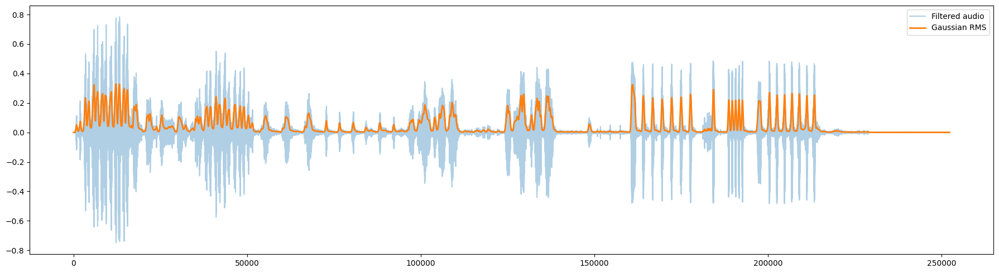

[0. 0. 0. ... 1. 1. 1.]
Sample Rate: 16000
Duration: 15.77 seconds
Samples: 252262


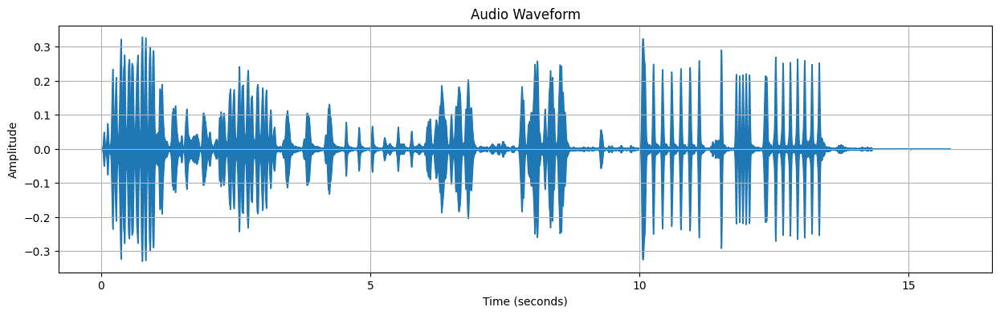

4.6. Finding peaks
Sample Rate: 16000
Duration: 15.77 seconds
Samples: 252262


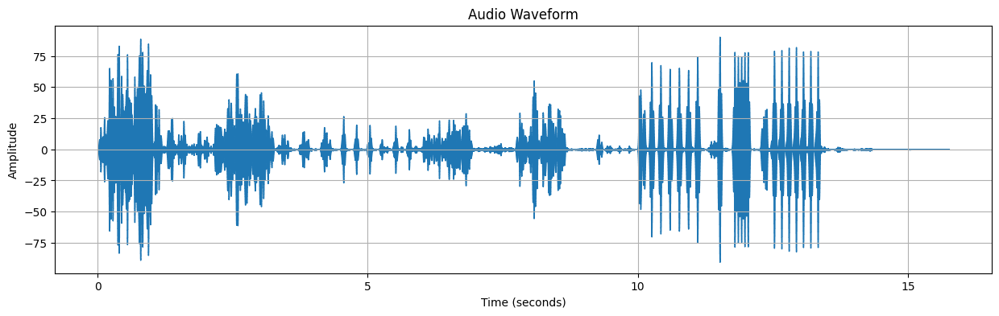

Sample Rate: 16000
Duration: 15.77 seconds
Samples: 252262


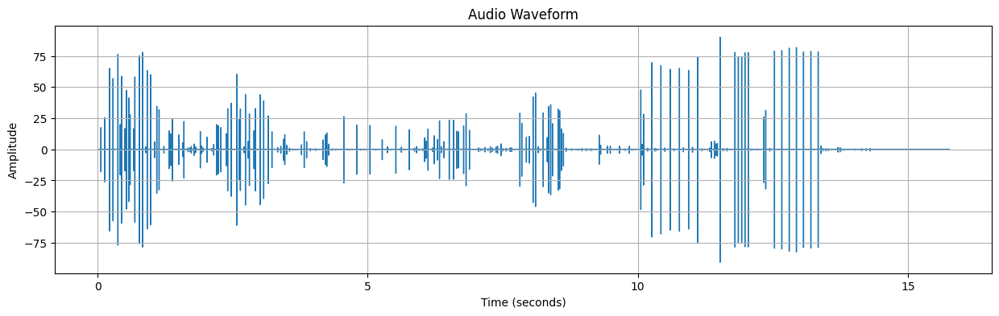

4.6. Finding peaks done
4.7. Finding trough
4.7. Finding trough done


In [65]:
import librosa
import numpy as np
import ruptures as rpt
from IPython.display import Audio, display, Markdown

#1. Audio
audio_file = "/content/drive/MyDrive/colab_datas/isp_comm/bird_sound_shorts_1.m4a"
y, sr = librosa.load(audio_file, sr=16000)
audio = y#[0:44000]

#2. Bandpass
bpf_audio = bandpass_filter(
    audio,
    sample_rate=sr,
    lowcut=2500,
    highcut=5000
)


#3. Gaussian RMS

envelope_aud = gaussian_rms_envelope(
    bpf_audio,
    sigma_ms=7,
    sample_rate=sr
)

show_envelope_on_bpf_filtered(bpf_audio, envelope_aud)

#4. Adaptive threshold

# threshold = adaptive_threshold(
#     envelope_aud,
#     sensitivity=2.8
# )

threshold = adaptive_threshold_local(
    envelope_aud,
    window=int(0.04 * sr),   # 500 ms window
    sensitivity=2.5
)

#show_audio(threshold, sr)
speech_mask = np.where(envelope_aud > threshold, 0.0, 1.0)
print(speech_mask)
#show_audio(speech_mask, sr)

show_audio(envelope_aud,sr)

#4.5.
#env = gaussian_rms_envelope(audio, sigma=60)
# peaks, props = detect_energy_peaks(
#     envelope_aud,
#     sample_rate=sr,
#     min_peak_distance_ms=30
# )

# print("Detected peaks:", len(peaks))
# show_audio_energy_peaks(audio, peaks)


#4.6 find peaks
print("4.6. Finding peaks")
sd = sum_of_differences_np(envelope_aud,400) # 400 for birds #4000 for human
mo0 = find_max_and_zero_out_Onlogn(sd.tolist(),400) # 400 for birds #4000 for human
sd = np.array(sd)
#sd = sd * sd
show_audio(sd,sr)

show_audio(np.array(mo0),sr)
print("4.6. Finding peaks done")

#4.7. find trough
print("4.7. Finding trough")
rev_envelope_aud = np.subtract(1,envelope_aud)
rev_sd = sum_of_differences_np(rev_envelope_aud.tolist(),400) # 400 for birds #400 for human
rev_mo0 = find_max_and_zero_out_Onlogn(rev_sd,400)
rev_sd = np.array(rev_sd)
print("4.7. Finding trough done")



#5. Merge nearby peaks (<200 ms apart)
#6. Find minima between merged peaks
#7. Discard shallow minima
#8. Word candidates

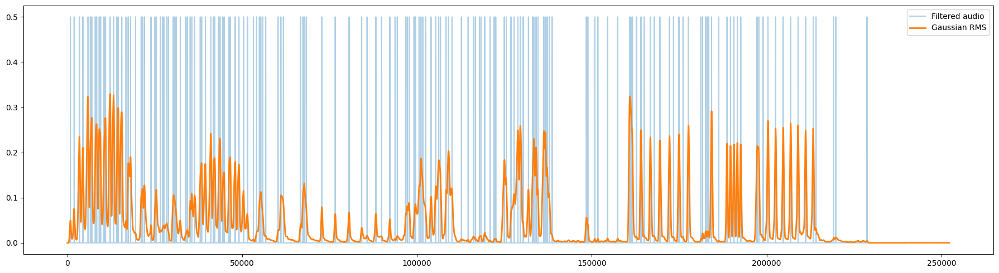

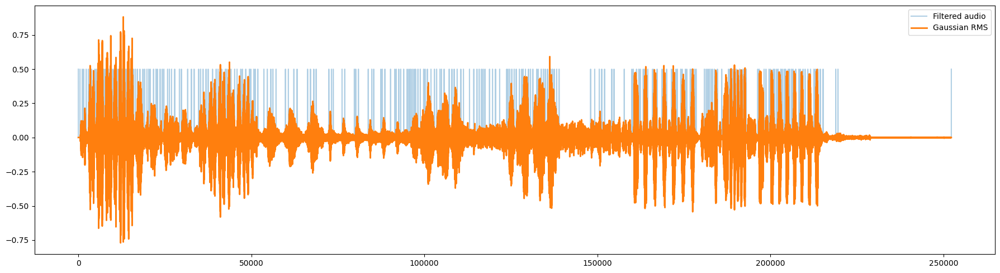

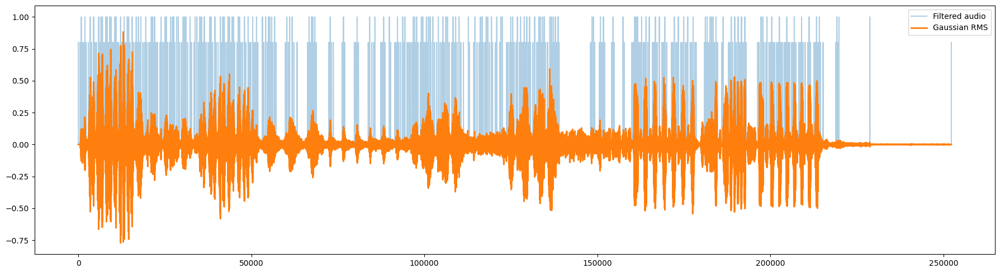

Sample Rate: 16000
Duration: 15.77 seconds
Samples: 252262


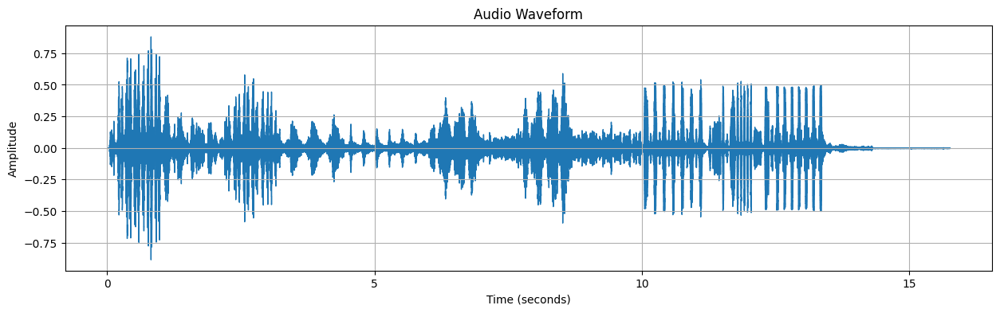

In [66]:
peak_mask = np.where(np.array(mo0) > 1, 0.5, 0.0)
show_envelope_on_bpf_filtered(peak_mask,envelope_aud)

trough_mask = np.where(np.array(rev_mo0) > 1, 0.5, 0.0)
show_envelope_on_bpf_filtered(trough_mask,audio)

both_mask = np.where( peak_mask > 0.3, 1.0, 0.0) + np.where( trough_mask > 0.3, 0.8, 0.0)
show_envelope_on_bpf_filtered(both_mask,audio)

show_audio(audio,sr)






#8. Word candidates

In [67]:
# mask to word
# both_mask
def find_intervals(arr):
    stack = []
    intervals = []

    seen_one = False

    for i, v in enumerate(arr):

        if v == 0.8:
            if stack:
                if seen_one:
                    intervals.append((stack[-1], i))
                stack.pop()

            stack.append(i)
            seen_one = False

        elif v == 1.0:
            if stack:
                seen_one = True

    return intervals

def find_intervals_lm(arr):
    last08 = -1
    seen_one = False
    intervals = []

    for i, v in enumerate(arr):
        if v == 0.8:
            if last08 != -1 and seen_one:
                intervals.append((last08, i))
            last08 = i
            seen_one = False

        elif v == 1.0 and last08 != -1:
            seen_one = True

    return intervals

intervals = find_intervals(both_mask)
intervalsX = find_intervals_lm(both_mask)
print(intervals)
print(intervalsX)


[(478, 1137), (1538, 2279), (2915, 3841), (3841, 4795), (5223, 6271), (6271, 7317), (7718, 8731), (8731, 9769), (10170, 11242), (11644, 12627), (12627, 13618), (14019, 14947), (14947, 15919), (16451, 17052), (17052, 17811), (17811, 18666), (19166, 19846), (20762, 21750), (21750, 22446), (23633, 24270), (24724, 25811), (26324, 26953), (26953, 27853), (27853, 29217), (29778, 31609), (31609, 32679), (33475, 34782), (34782, 35359), (35359, 36048), (36048, 36915), (37518, 38791), (38791, 39841), (40378, 41443), (41443, 42510), (42963, 44114), (44114, 45195), (45865, 46951), (47417, 48394), (48394, 49432), (49833, 50724), (51125, 51875), (51875, 53630), (53630, 54602), (54602, 55643), (55643, 56227), (56227, 57143), (59855, 60704), (60704, 62293), (66259, 67079), (67079, 68054), (68054, 68736), (72401, 73153), (76216, 76998), (80165, 80940), (83777, 84799), (85374, 87446), (87847, 88598), (88598, 90234), (91855, 92588), (93157, 94025), (94025, 95033), (96459, 96998), (96998, 97443), (97443, 

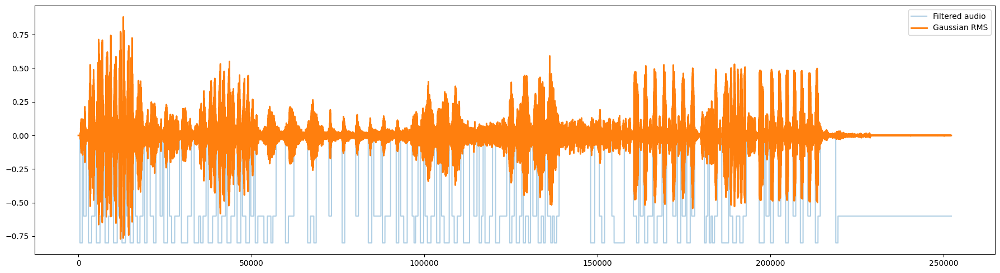

In [68]:
def create_interval_mask(intervals, size, values=(-0.8, -0.6)):
    mask = [0] * size

    toggle = 0

    for start, end in intervals:
        for i in range(start, end + 1):
            mask[i] = values[toggle]

        toggle = 1 - toggle   # alternate for next interval

    return mask

selected_word_mask = create_interval_mask(intervals, len(both_mask))
show_envelope_on_bpf_filtered(selected_word_mask,audio)

In [86]:
import librosa
import numpy as np
from IPython.display import Audio, display, Markdown

def show_audio_player(segment, sr):
  display(Audio(segment, rate=sr))
  #show_audio(segment, sr)


(st, en) = intervals[0]
print(str(st)+"-"+str(en))
segment = audio[st:en]
show_audio_player(segment, sr)

478-1137


Detected 11 candidate segments

478-1137


### Segment 35
- Start: **0.03 s**
- End: **0.07 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 659


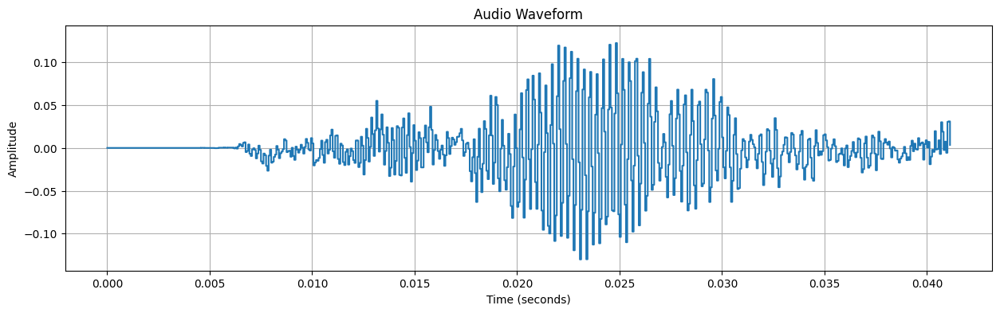

1538-2279


### Segment 35
- Start: **0.10 s**
- End: **0.14 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 741


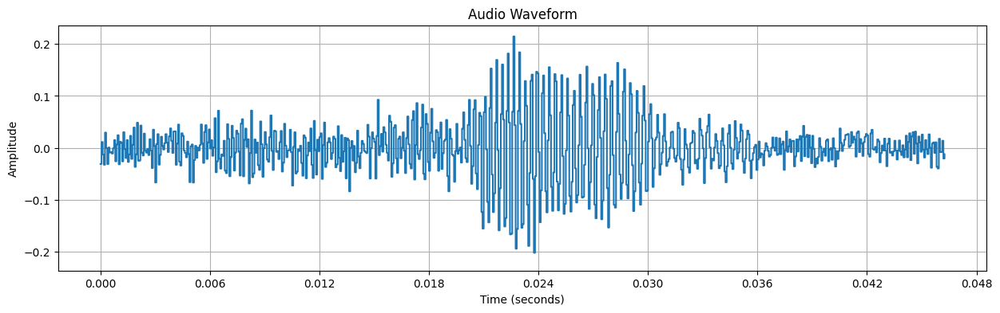

2915-3841


### Segment 35
- Start: **0.18 s**
- End: **0.24 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 926


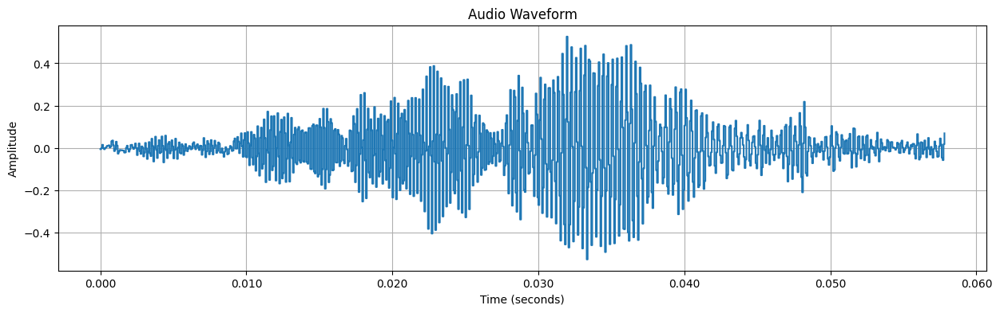

3841-4795


### Segment 35
- Start: **0.24 s**
- End: **0.30 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 954


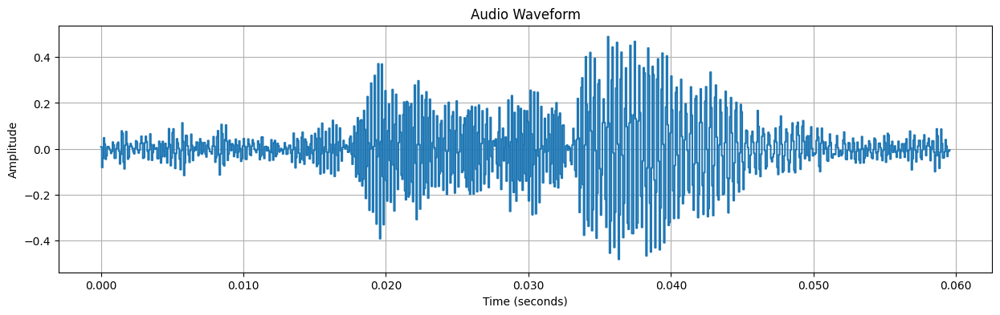

5223-6271


### Segment 35
- Start: **0.33 s**
- End: **0.39 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1048


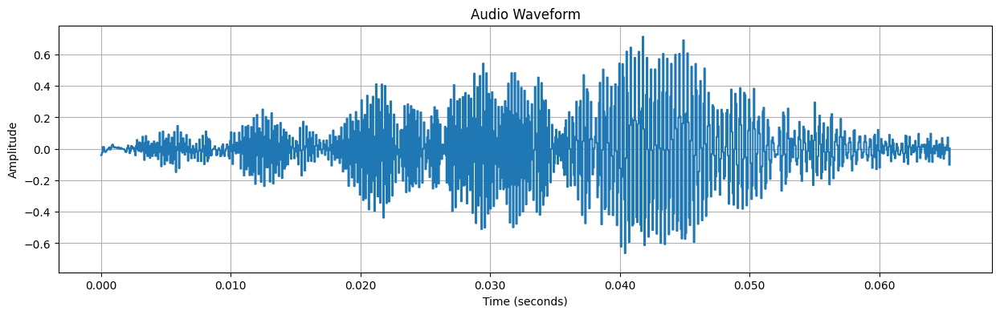

6271-7317


### Segment 35
- Start: **0.39 s**
- End: **0.46 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1046


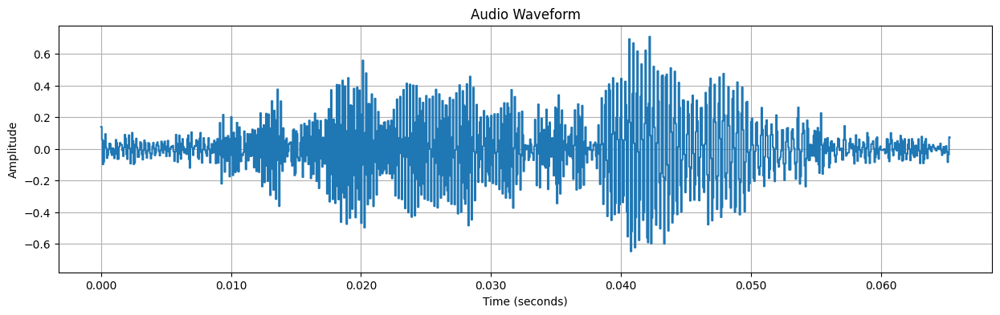

7718-8731


### Segment 35
- Start: **0.48 s**
- End: **0.55 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 1013


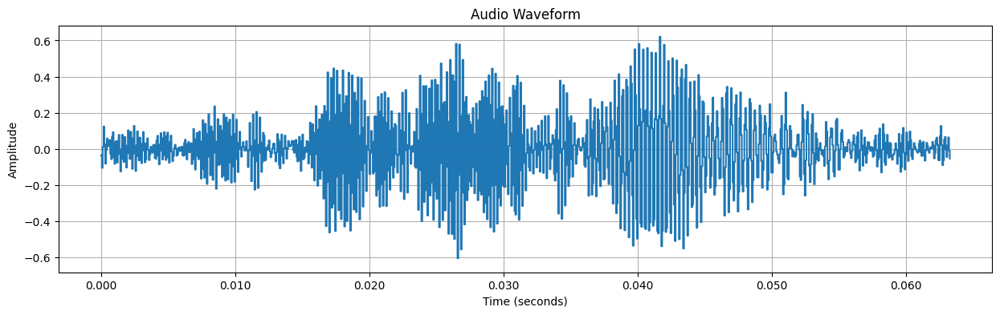

8731-9769


### Segment 35
- Start: **0.55 s**
- End: **0.61 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 1038


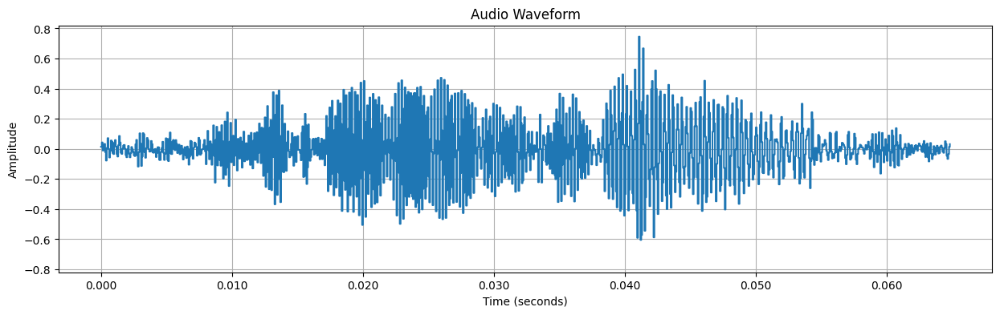

10170-11242


### Segment 35
- Start: **0.64 s**
- End: **0.70 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1072


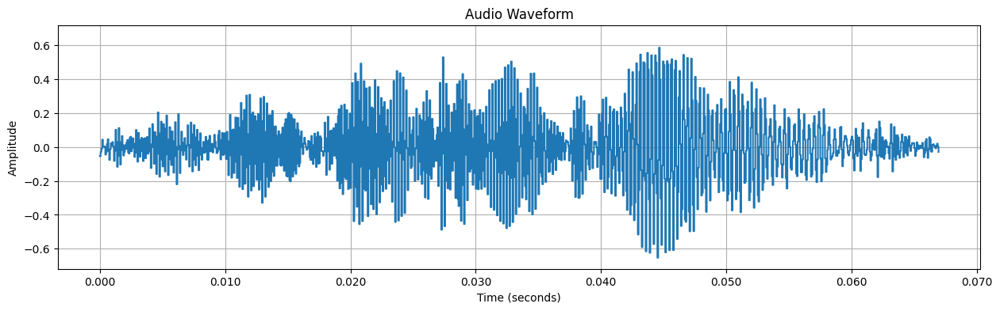

11644-12627


### Segment 35
- Start: **0.73 s**
- End: **0.79 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 983


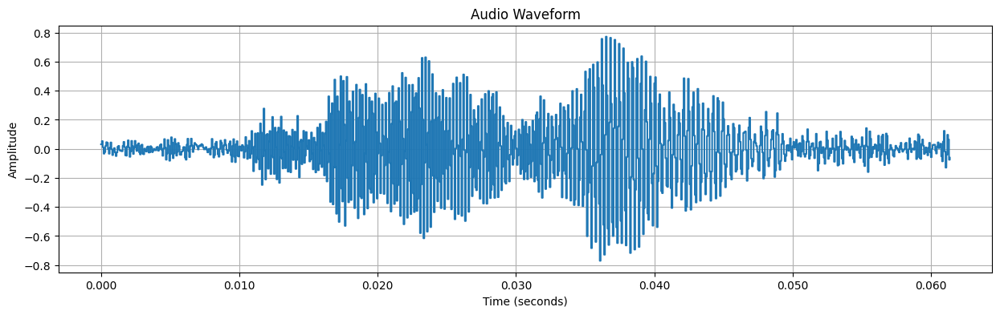

12627-13618


### Segment 35
- Start: **0.79 s**
- End: **0.85 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 991


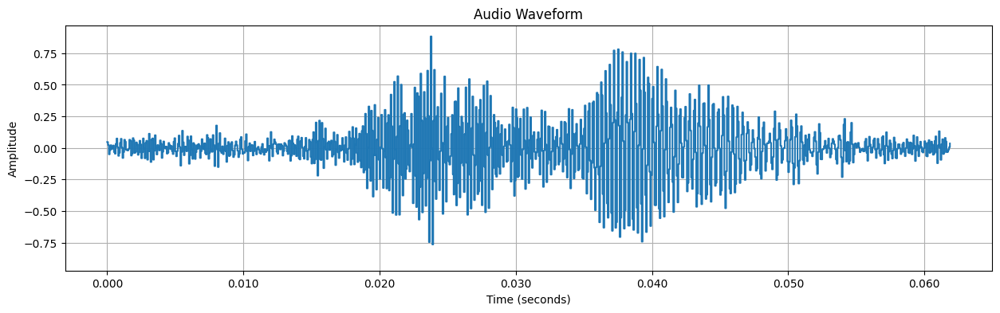

14019-14947


### Segment 35
- Start: **0.88 s**
- End: **0.93 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 928


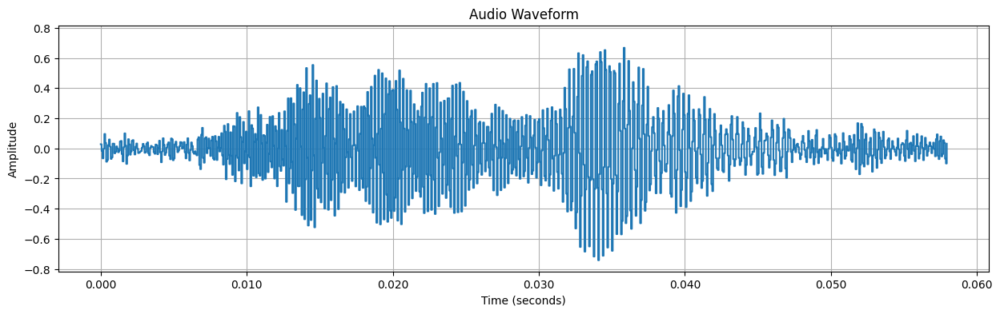

14947-15919


### Segment 35
- Start: **0.93 s**
- End: **0.99 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 972


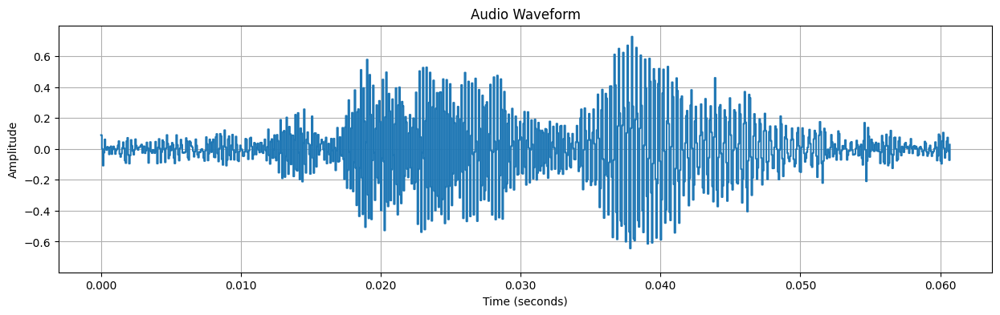

16451-17052


### Segment 35
- Start: **1.03 s**
- End: **1.07 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 601


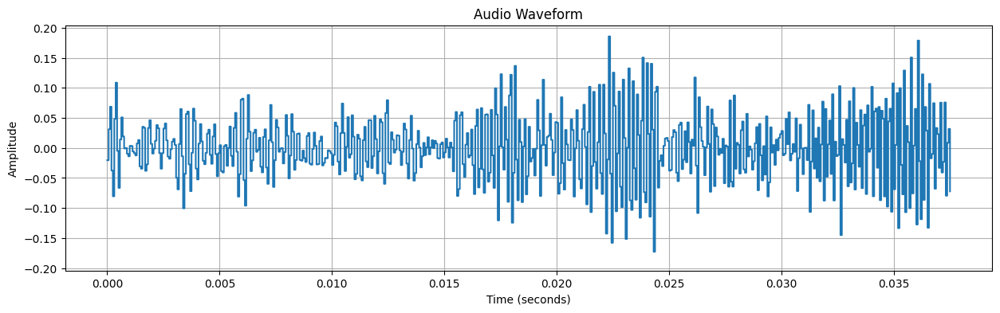

17052-17811


### Segment 35
- Start: **1.07 s**
- End: **1.11 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 759


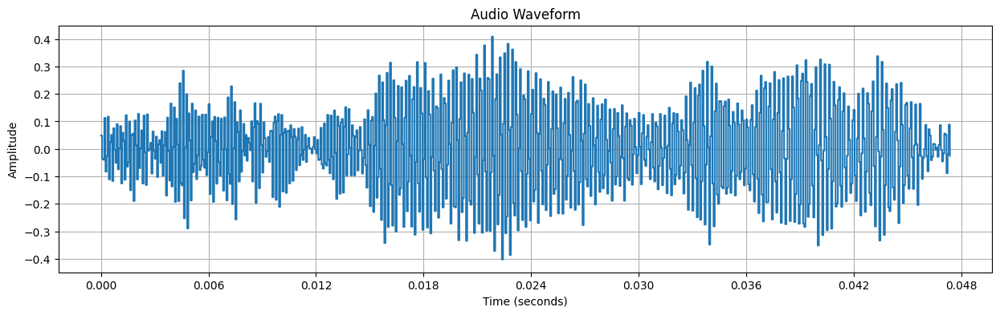

17811-18666


### Segment 35
- Start: **1.11 s**
- End: **1.17 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 855


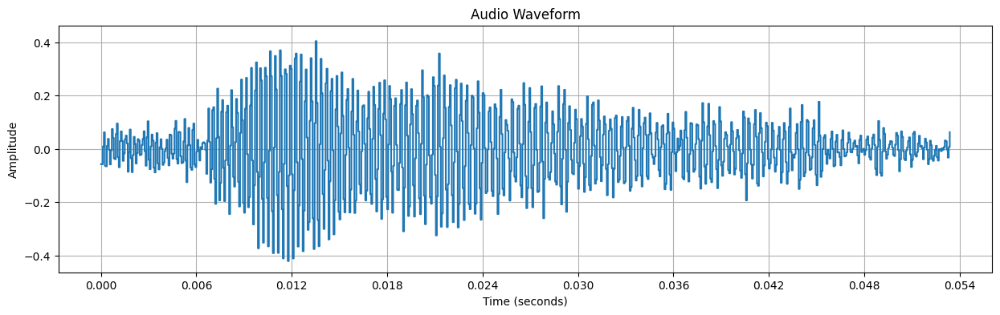

19166-19846


### Segment 35
- Start: **1.20 s**
- End: **1.24 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 680


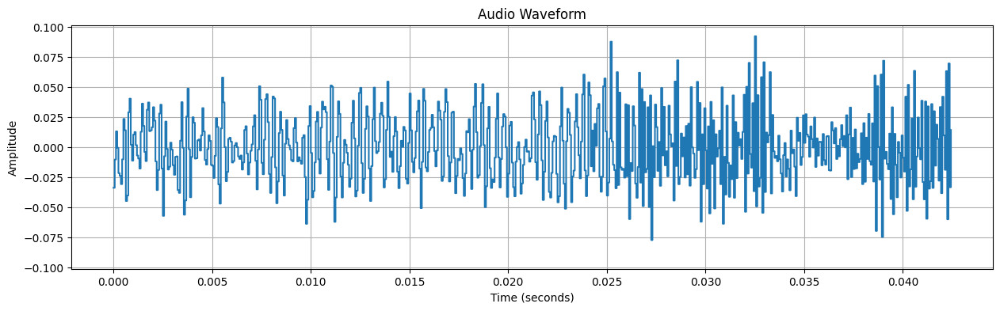

20762-21750


### Segment 35
- Start: **1.30 s**
- End: **1.36 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 988


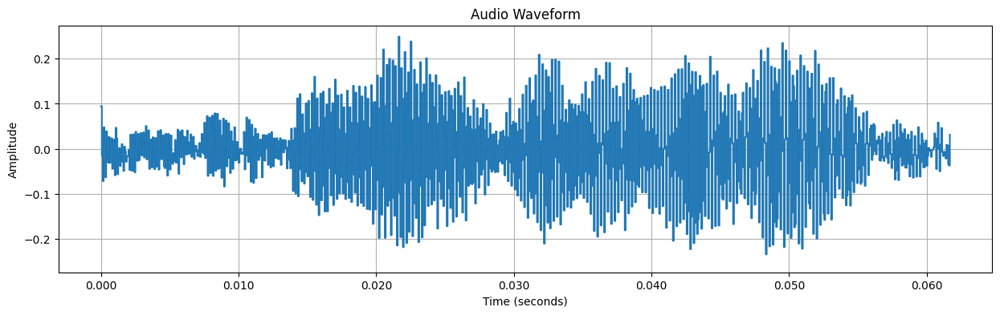

21750-22446


### Segment 35
- Start: **1.36 s**
- End: **1.40 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 696


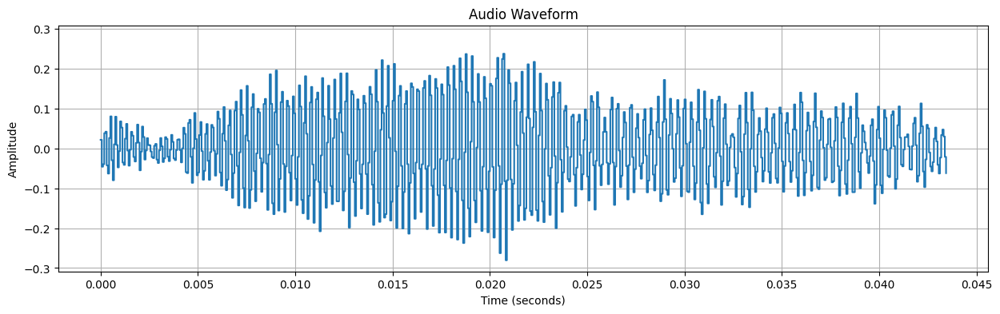

23633-24270


### Segment 35
- Start: **1.48 s**
- End: **1.52 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 637


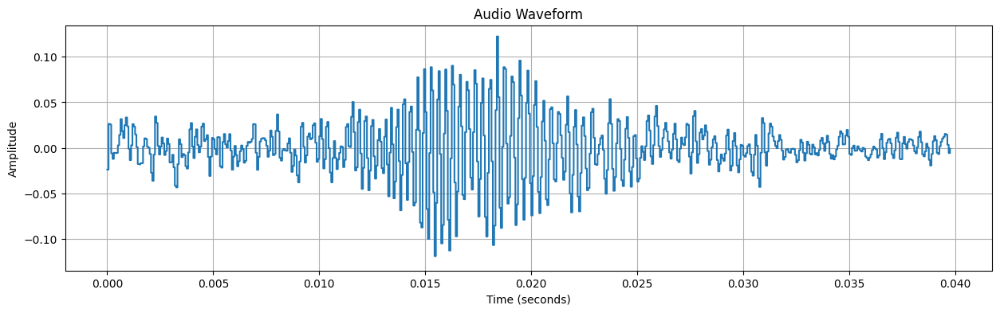

24724-25811


### Segment 35
- Start: **1.55 s**
- End: **1.61 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1087


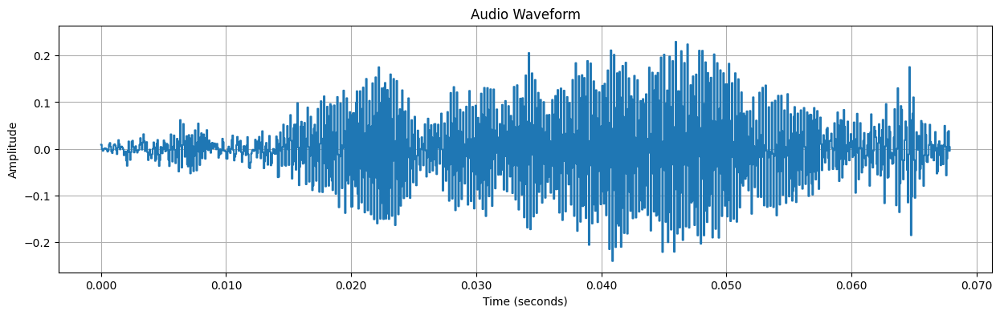

26324-26953


### Segment 35
- Start: **1.65 s**
- End: **1.68 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 629


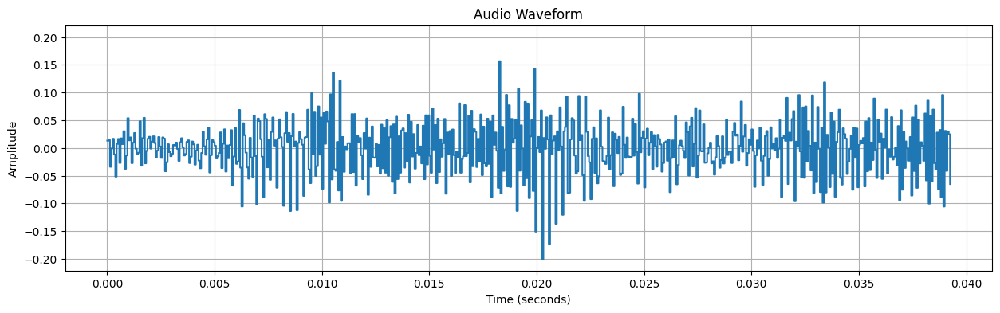

26953-27853


### Segment 35
- Start: **1.68 s**
- End: **1.74 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 900


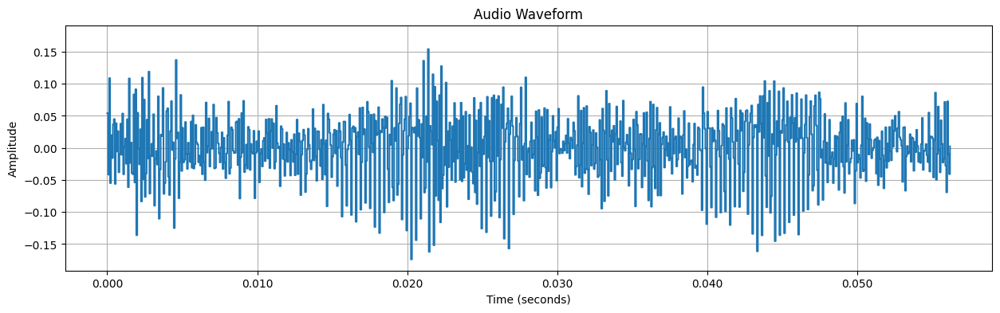

27853-29217


### Segment 35
- Start: **1.74 s**
- End: **1.83 s**
- Duration: **0.09 s**

Sample Rate: 16000
Duration: 0.09 seconds
Samples: 1364


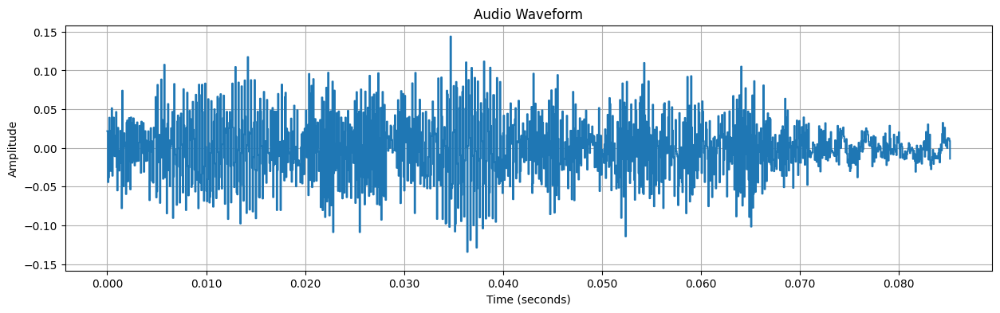

29778-31609


### Segment 35
- Start: **1.86 s**
- End: **1.98 s**
- Duration: **0.11 s**

Sample Rate: 16000
Duration: 0.11 seconds
Samples: 1831


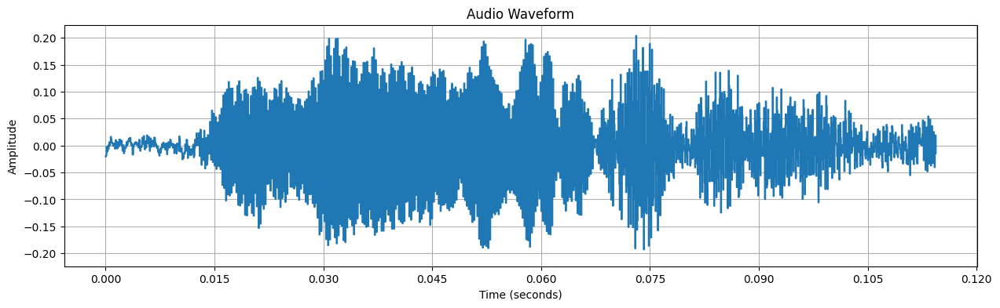

31609-32679


### Segment 35
- Start: **1.98 s**
- End: **2.04 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1070


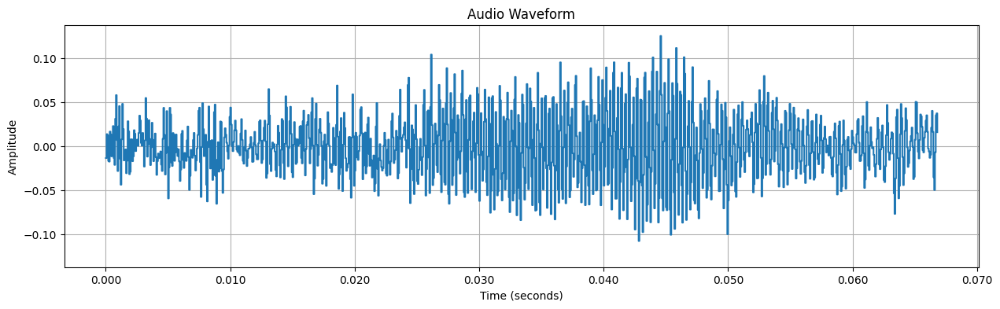

33475-34782


### Segment 35
- Start: **2.09 s**
- End: **2.17 s**
- Duration: **0.08 s**

Sample Rate: 16000
Duration: 0.08 seconds
Samples: 1307


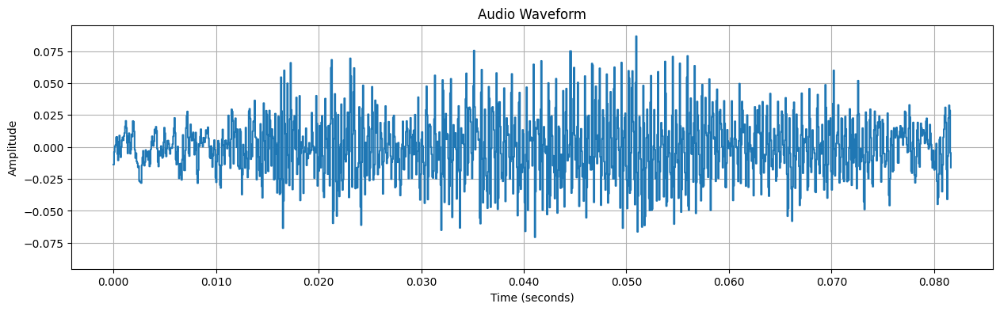

34782-35359


### Segment 35
- Start: **2.17 s**
- End: **2.21 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 577


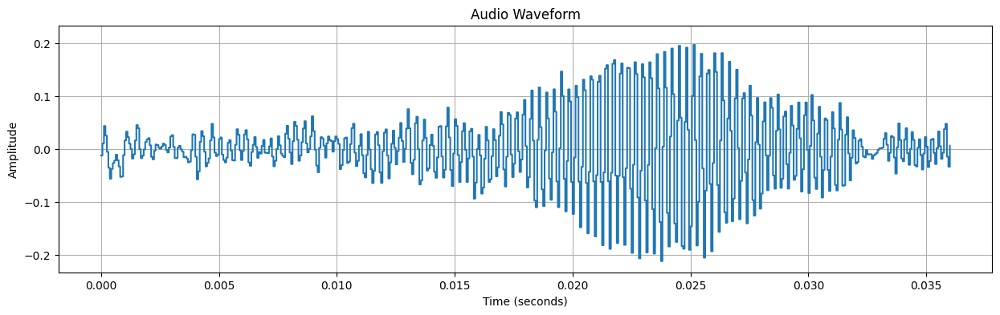

35359-36048


### Segment 35
- Start: **2.21 s**
- End: **2.25 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 689


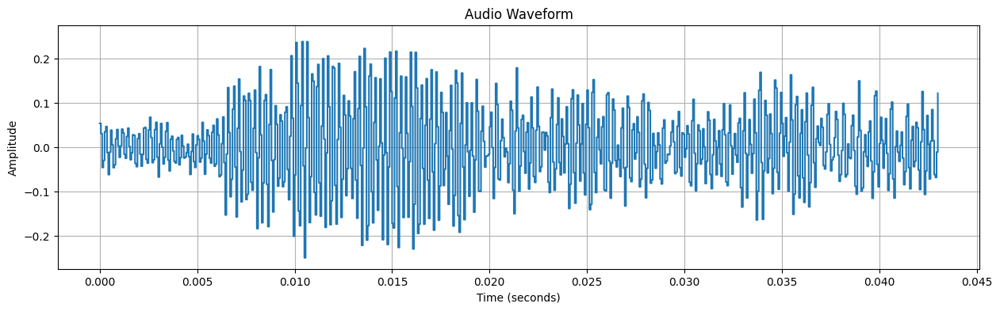

36048-36915


### Segment 35
- Start: **2.25 s**
- End: **2.31 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 867


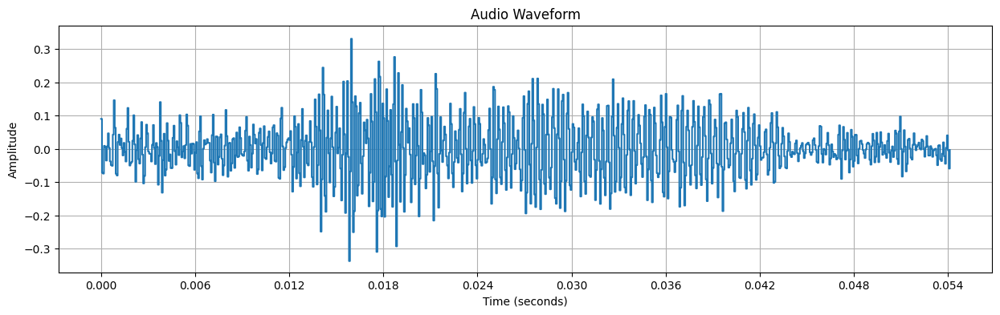

37518-38791


### Segment 35
- Start: **2.34 s**
- End: **2.42 s**
- Duration: **0.08 s**

Sample Rate: 16000
Duration: 0.08 seconds
Samples: 1273


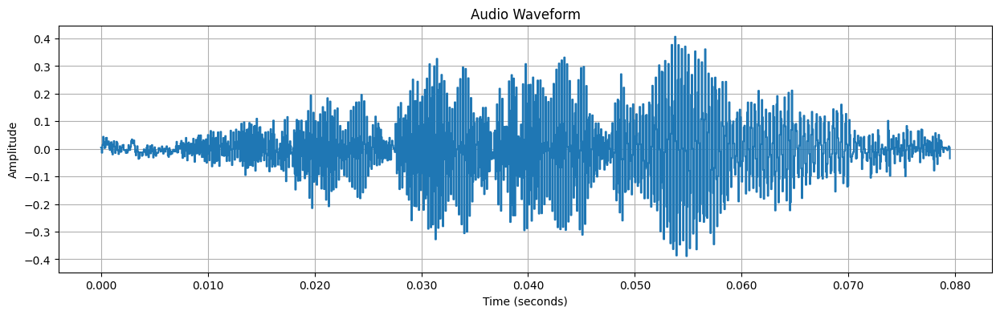

38791-39841


### Segment 35
- Start: **2.42 s**
- End: **2.49 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1050


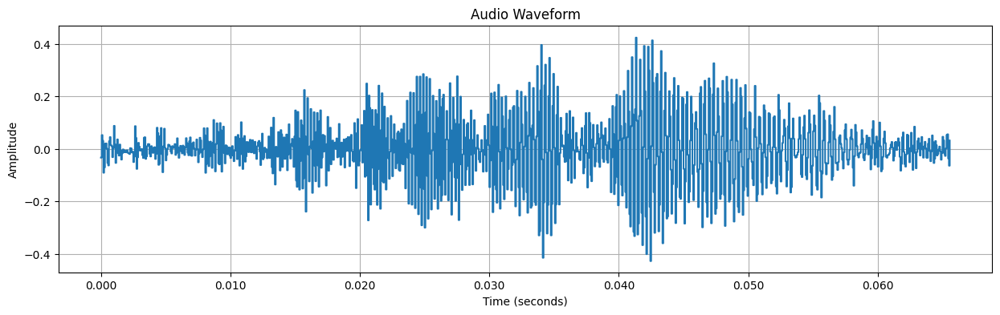

40378-41443


### Segment 35
- Start: **2.52 s**
- End: **2.59 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1065


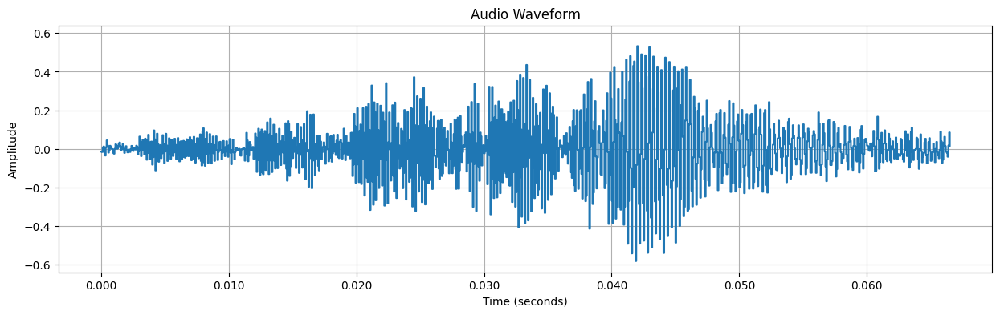

41443-42510


### Segment 35
- Start: **2.59 s**
- End: **2.66 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1067


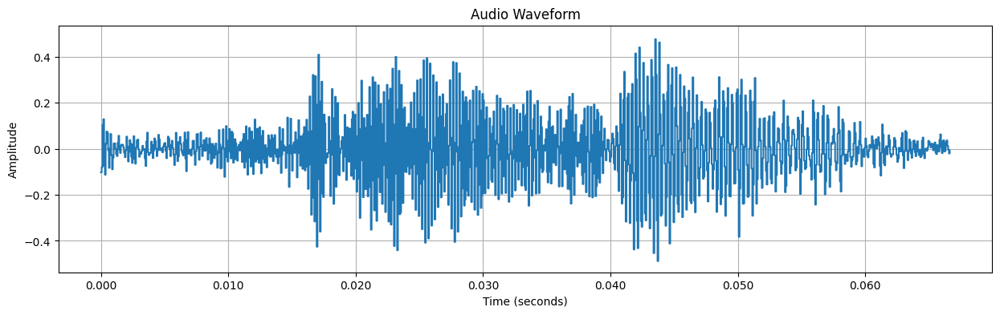

42963-44114


### Segment 35
- Start: **2.69 s**
- End: **2.76 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1151


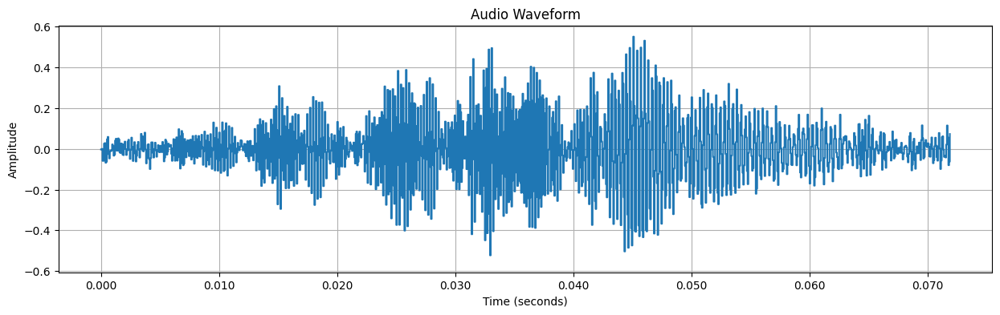

44114-45195


### Segment 35
- Start: **2.76 s**
- End: **2.82 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1081


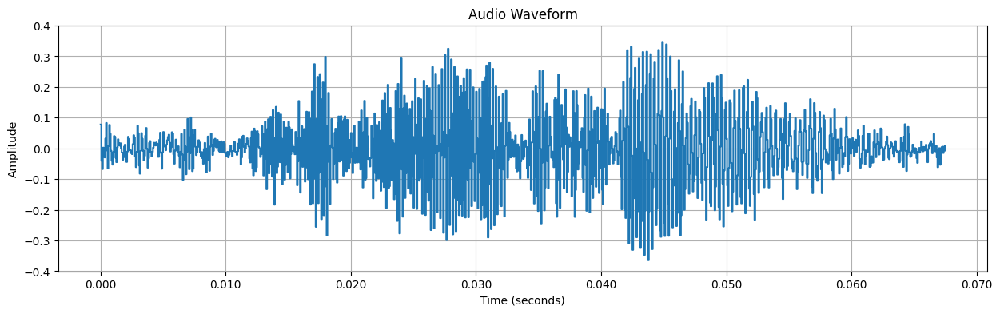

45865-46951


### Segment 35
- Start: **2.87 s**
- End: **2.93 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1086


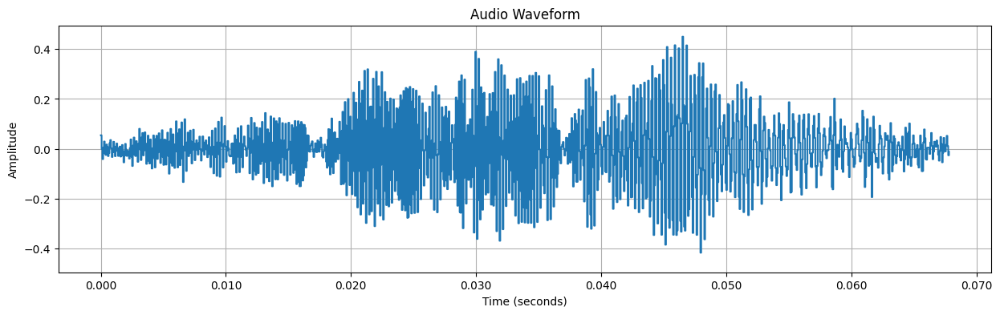

47417-48394


### Segment 35
- Start: **2.96 s**
- End: **3.02 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 977


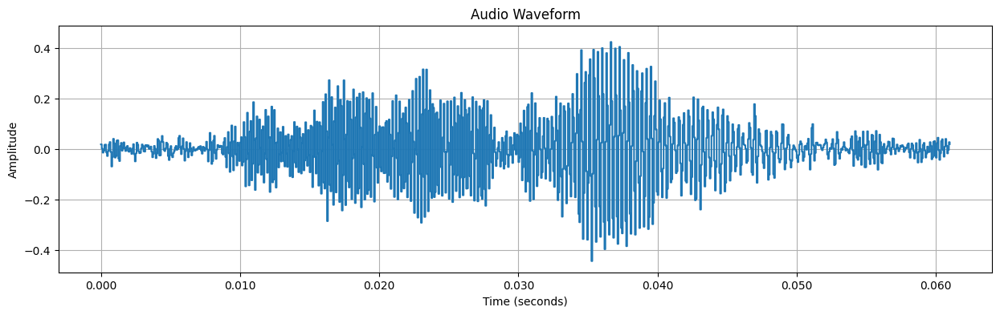

48394-49432


### Segment 35
- Start: **3.02 s**
- End: **3.09 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 1038


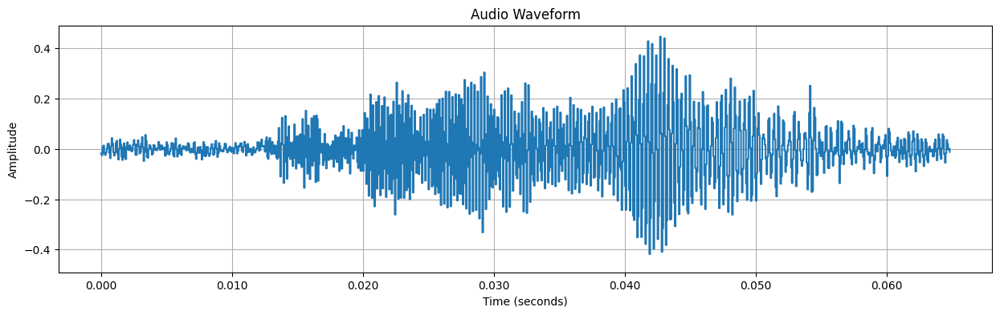

49833-50724


### Segment 35
- Start: **3.11 s**
- End: **3.17 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 891


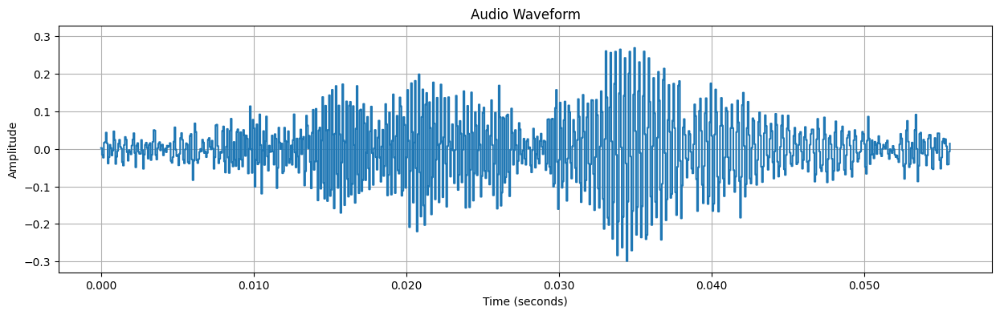

51125-51875


### Segment 35
- Start: **3.20 s**
- End: **3.24 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 750


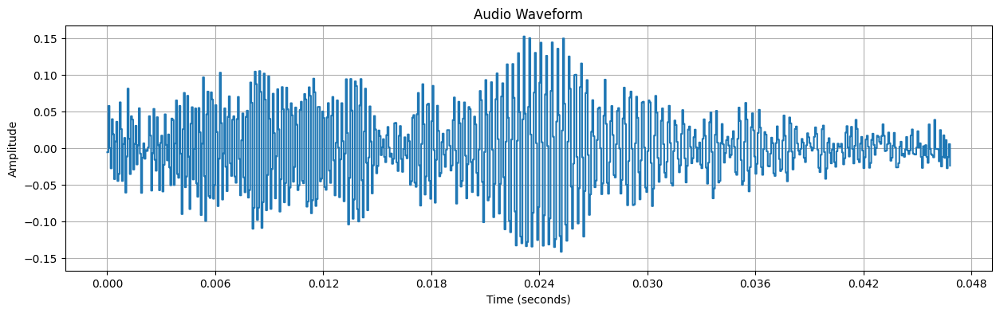

51875-53630


### Segment 35
- Start: **3.24 s**
- End: **3.35 s**
- Duration: **0.11 s**

Sample Rate: 16000
Duration: 0.11 seconds
Samples: 1755


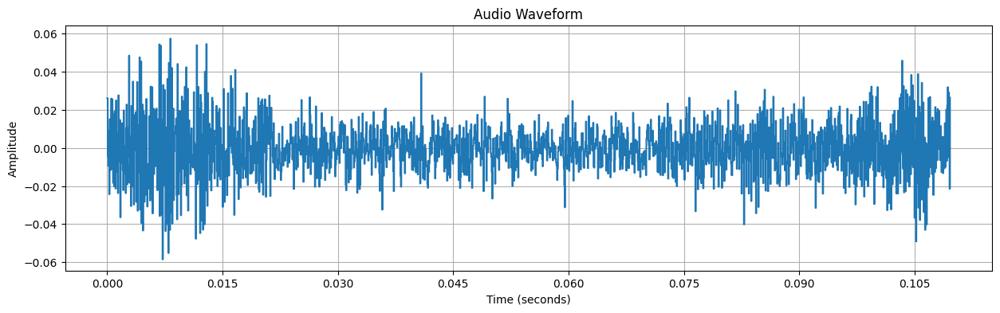

53630-54602


### Segment 35
- Start: **3.35 s**
- End: **3.41 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 972


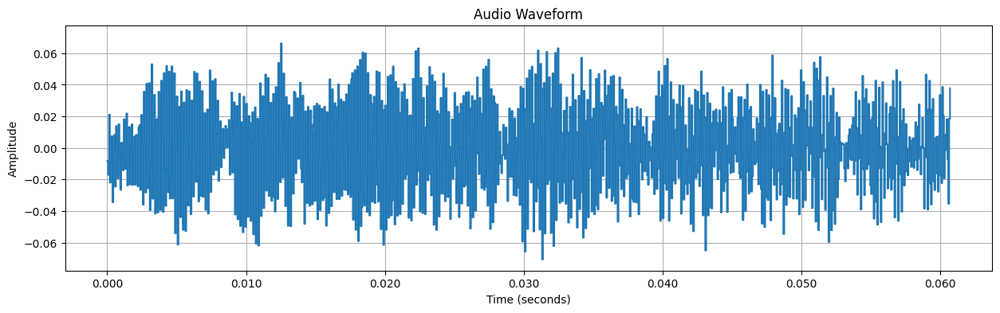

54602-55643


### Segment 35
- Start: **3.41 s**
- End: **3.48 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1041


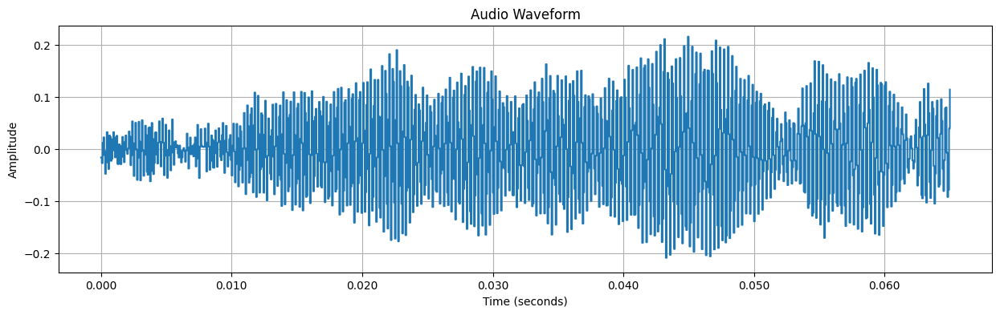

55643-56227


### Segment 35
- Start: **3.48 s**
- End: **3.51 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 584


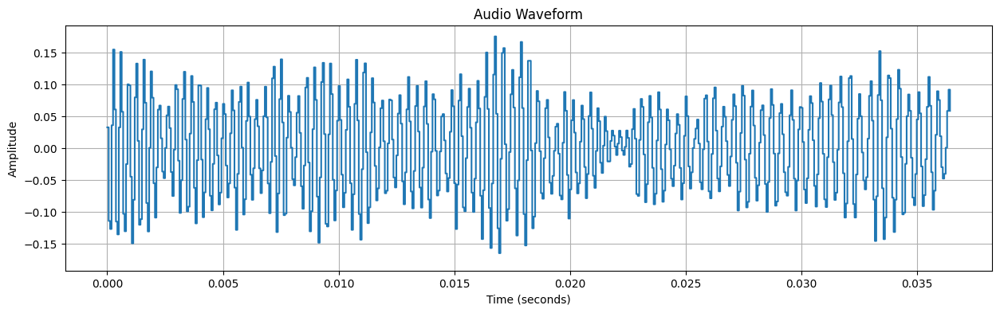

56227-57143


### Segment 35
- Start: **3.51 s**
- End: **3.57 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 916


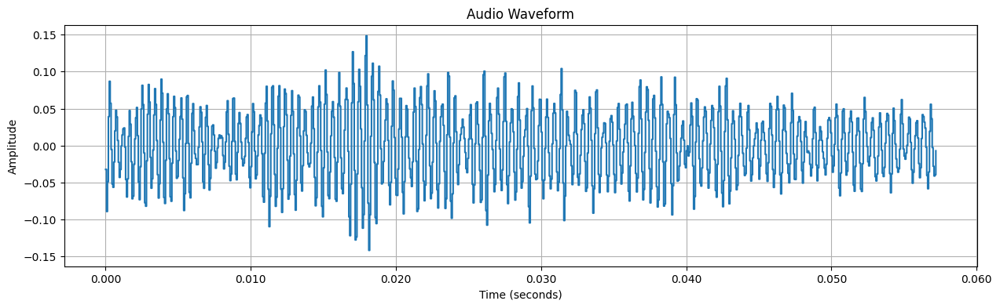

59855-60704


### Segment 35
- Start: **3.74 s**
- End: **3.79 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 849


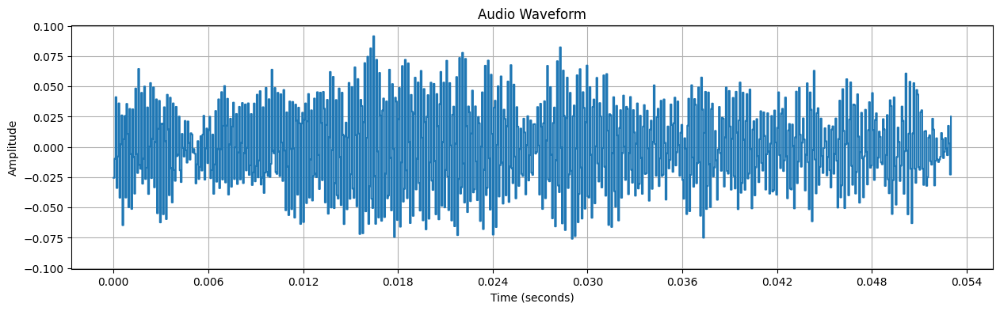

60704-62293


### Segment 35
- Start: **3.79 s**
- End: **3.89 s**
- Duration: **0.10 s**

Sample Rate: 16000
Duration: 0.10 seconds
Samples: 1589


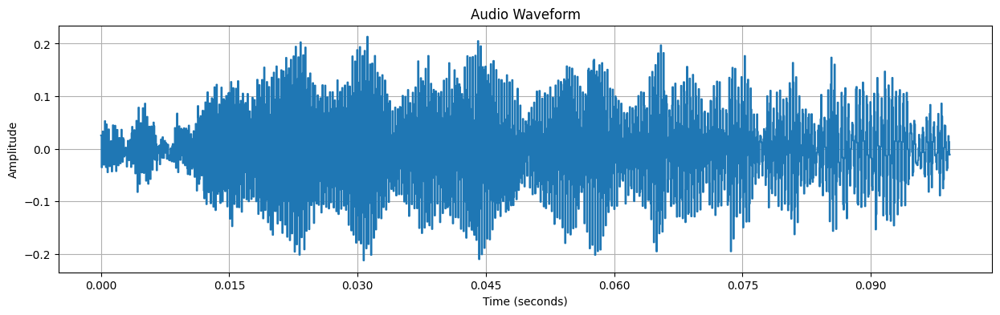

66259-67079


### Segment 35
- Start: **4.14 s**
- End: **4.19 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 820


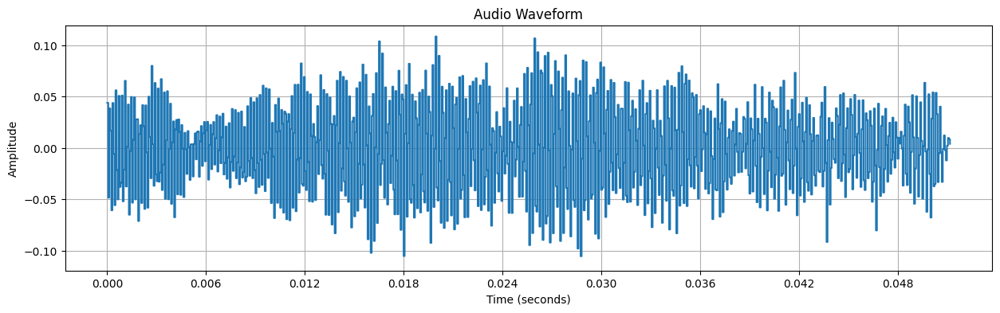

67079-68054


### Segment 35
- Start: **4.19 s**
- End: **4.25 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 975


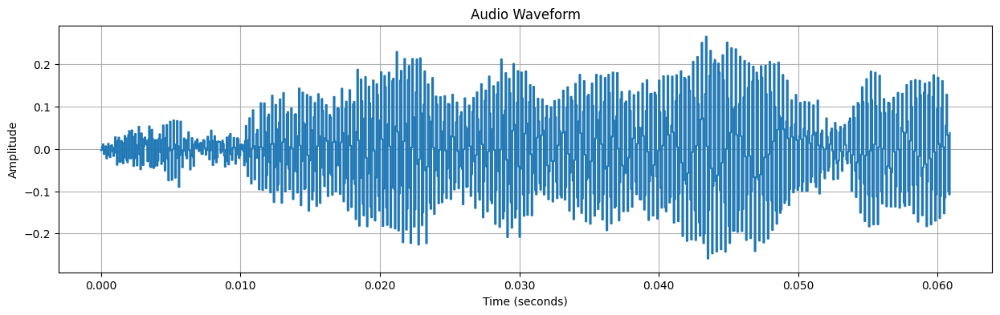

68054-68736


### Segment 35
- Start: **4.25 s**
- End: **4.30 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 682


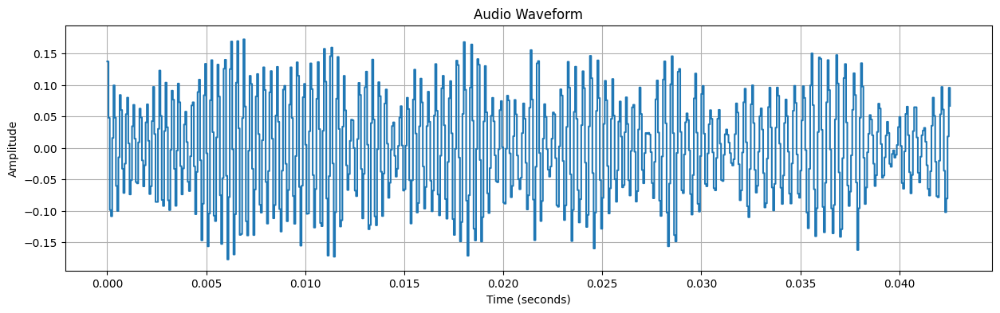

72401-73153


### Segment 35
- Start: **4.53 s**
- End: **4.57 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 752


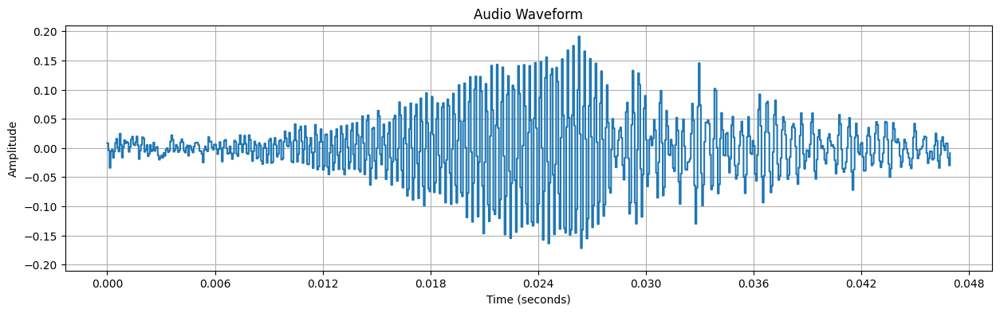

76216-76998


### Segment 35
- Start: **4.76 s**
- End: **4.81 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 782


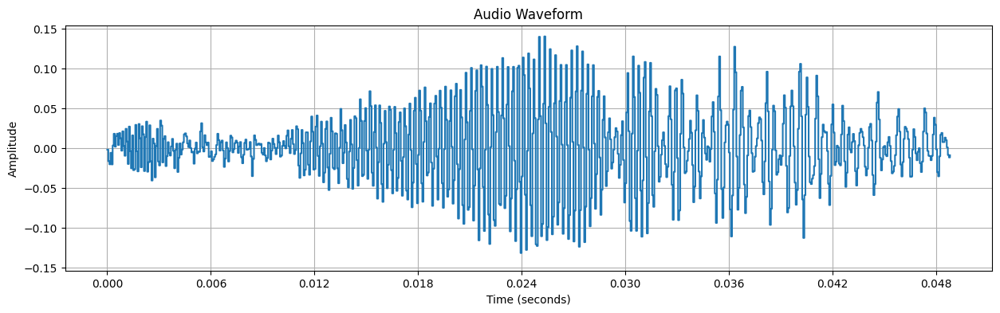

80165-80940


### Segment 35
- Start: **5.01 s**
- End: **5.06 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 775


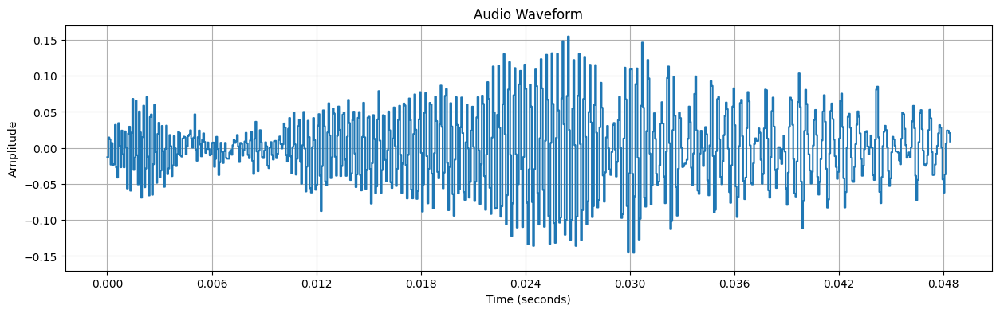

83777-84799


### Segment 35
- Start: **5.24 s**
- End: **5.30 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 1022


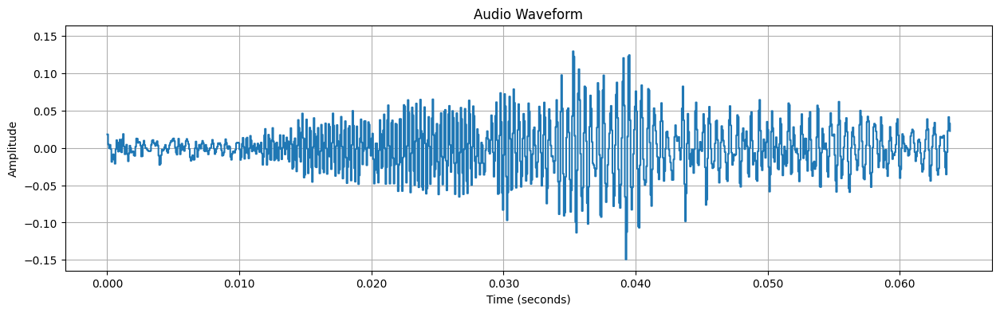

85374-87446


### Segment 35
- Start: **5.34 s**
- End: **5.47 s**
- Duration: **0.13 s**

Sample Rate: 16000
Duration: 0.13 seconds
Samples: 2072


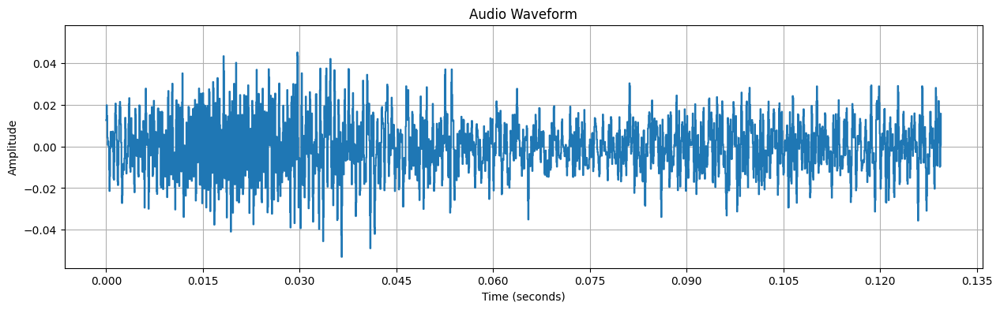

87847-88598


### Segment 35
- Start: **5.49 s**
- End: **5.54 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 751


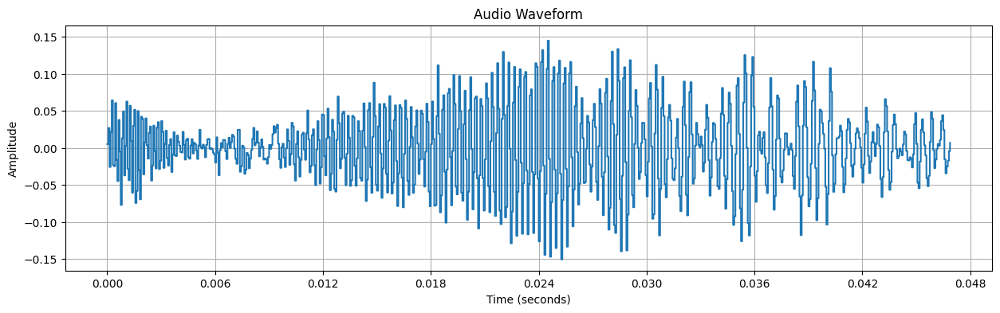

88598-90234


### Segment 35
- Start: **5.54 s**
- End: **5.64 s**
- Duration: **0.10 s**

Sample Rate: 16000
Duration: 0.10 seconds
Samples: 1636


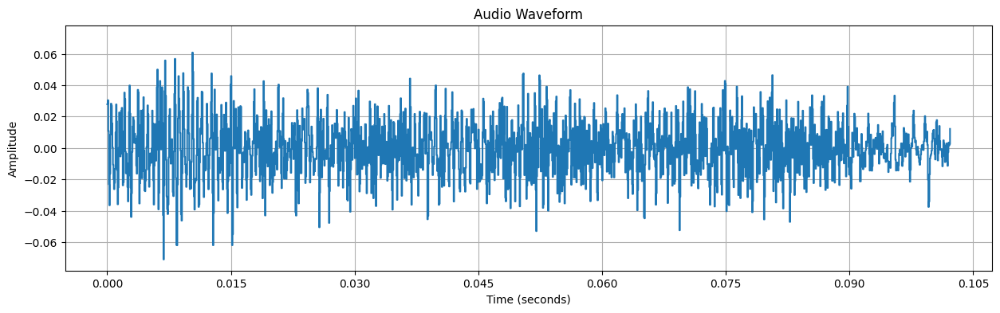

91855-92588


### Segment 35
- Start: **5.74 s**
- End: **5.79 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 733


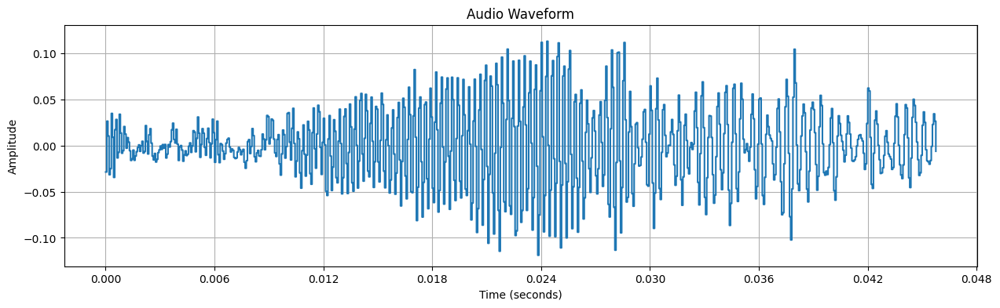

93157-94025


### Segment 35
- Start: **5.82 s**
- End: **5.88 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 868


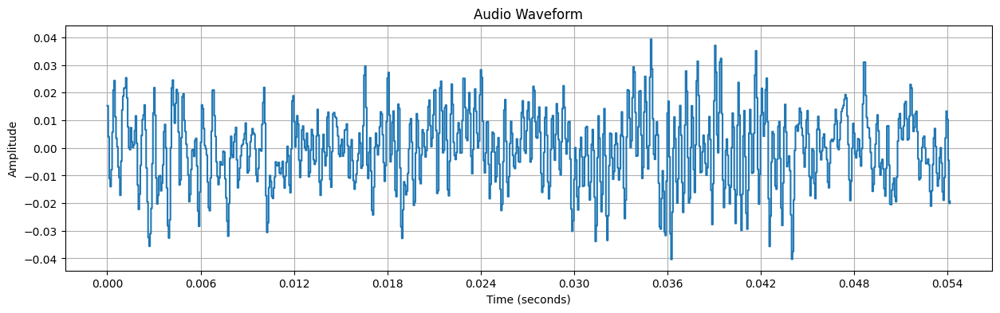

94025-95033


### Segment 35
- Start: **5.88 s**
- End: **5.94 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 1008


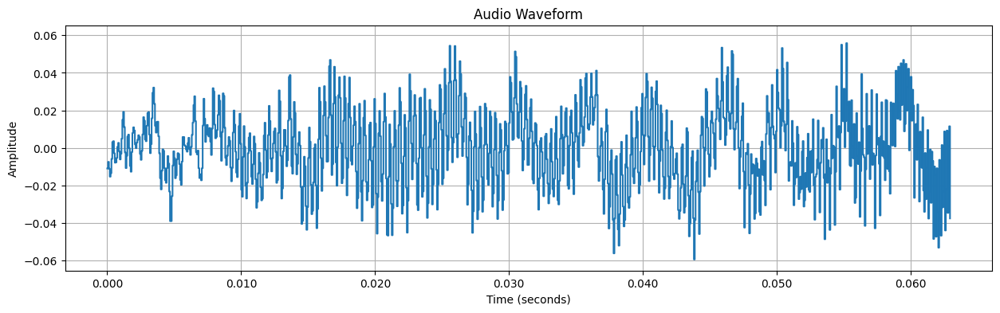

96459-96998


### Segment 35
- Start: **6.03 s**
- End: **6.06 s**
- Duration: **0.03 s**

Sample Rate: 16000
Duration: 0.03 seconds
Samples: 539


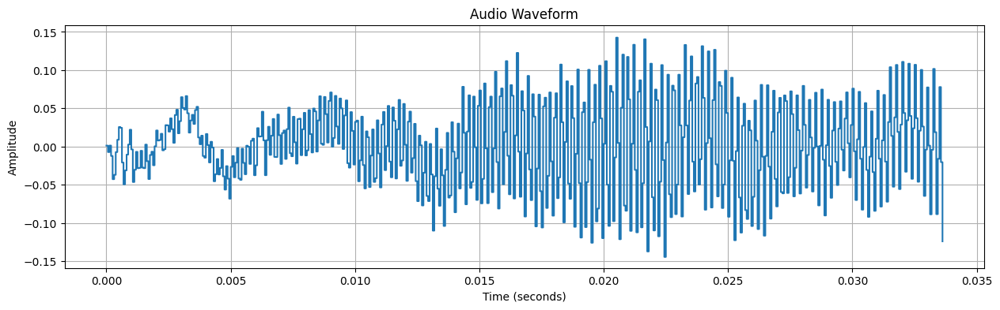

96998-97443


### Segment 35
- Start: **6.06 s**
- End: **6.09 s**
- Duration: **0.03 s**

Sample Rate: 16000
Duration: 0.03 seconds
Samples: 445


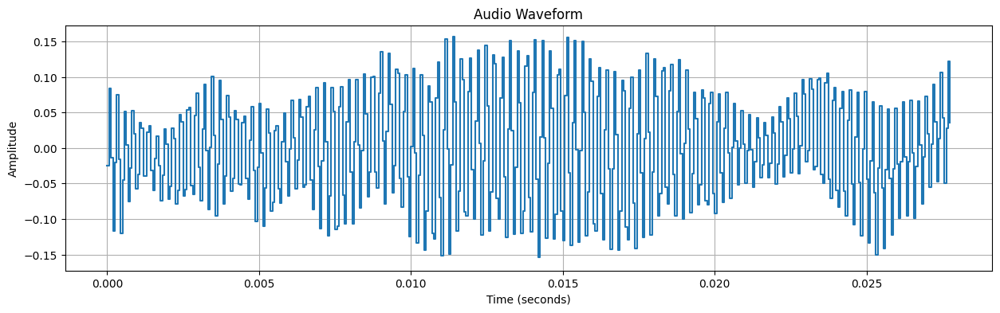

97443-98149


### Segment 35
- Start: **6.09 s**
- End: **6.13 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 706


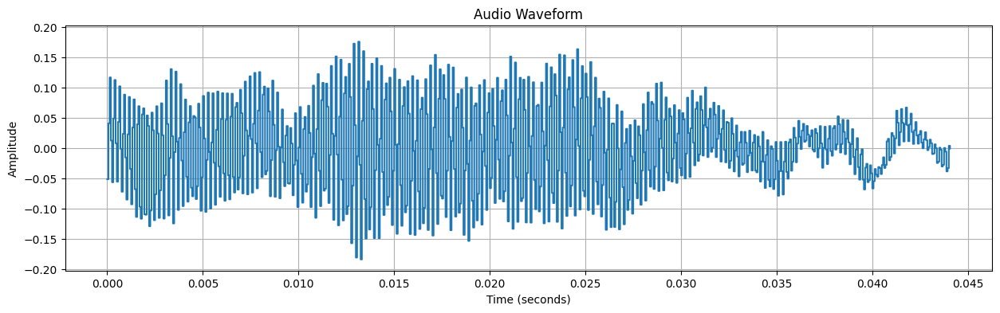

98817-99793


### Segment 35
- Start: **6.18 s**
- End: **6.24 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 976


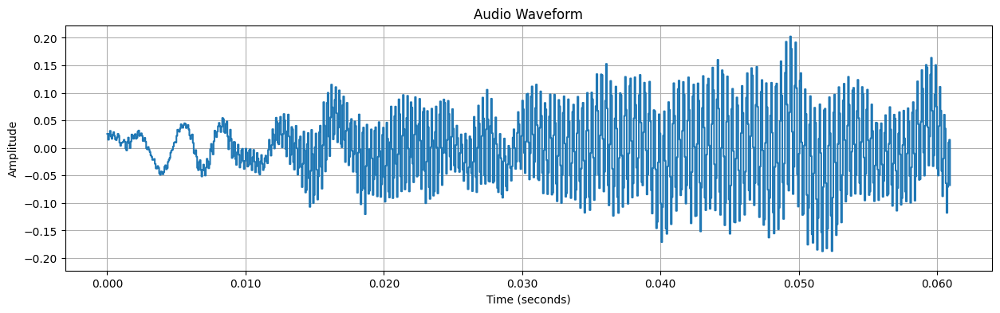

100194-100866


### Segment 35
- Start: **6.26 s**
- End: **6.30 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 672


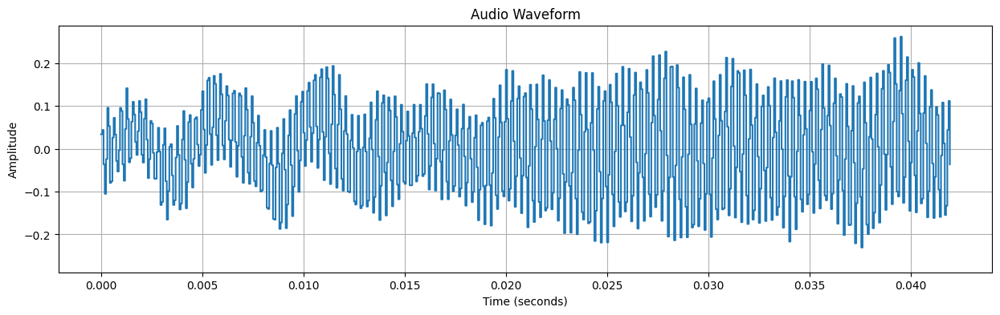

100866-101907


### Segment 35
- Start: **6.30 s**
- End: **6.37 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1041


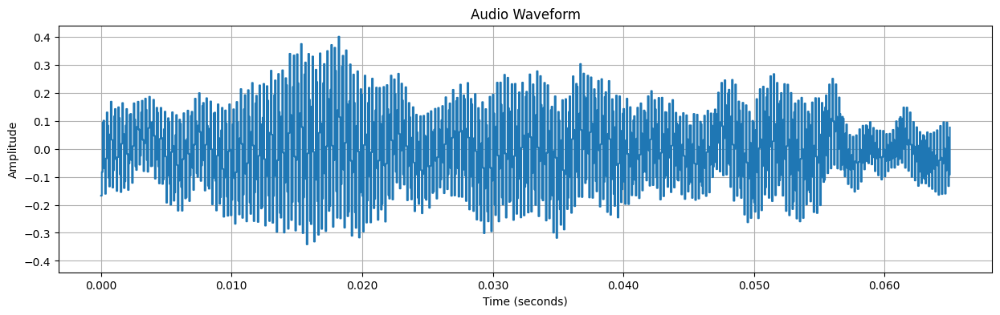

101907-102910


### Segment 35
- Start: **6.37 s**
- End: **6.43 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 1003


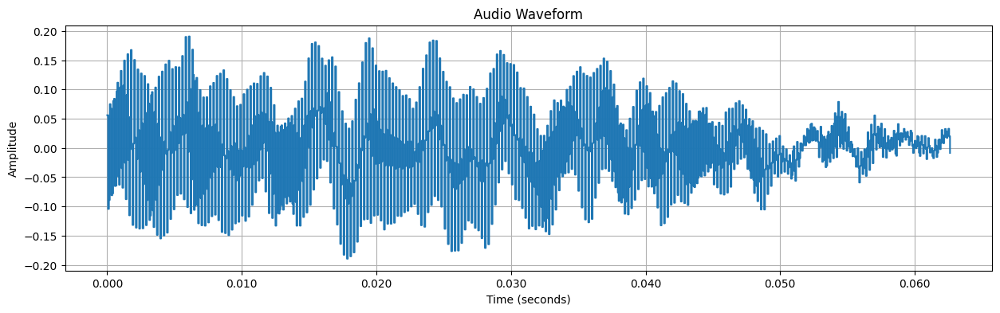

103534-104501


### Segment 35
- Start: **6.47 s**
- End: **6.53 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 967


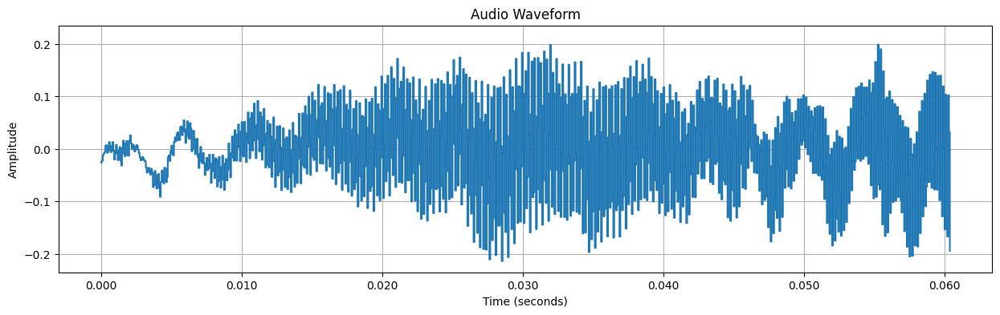

104947-105709


### Segment 35
- Start: **6.56 s**
- End: **6.61 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 762


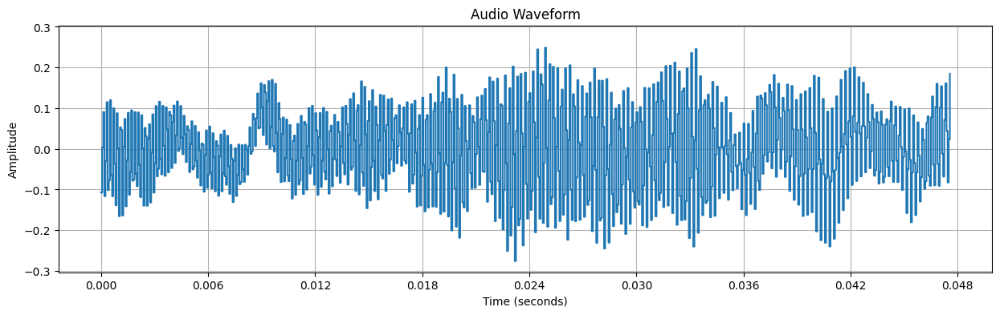

105709-107174


### Segment 35
- Start: **6.61 s**
- End: **6.70 s**
- Duration: **0.09 s**

Sample Rate: 16000
Duration: 0.09 seconds
Samples: 1465


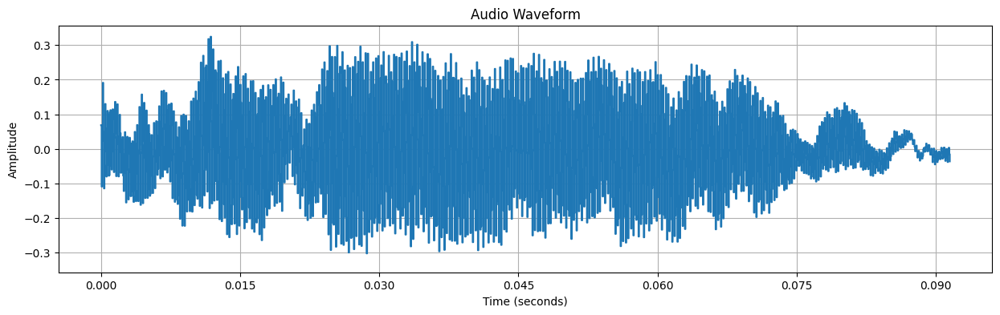

107957-108607


### Segment 35
- Start: **6.75 s**
- End: **6.79 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 650


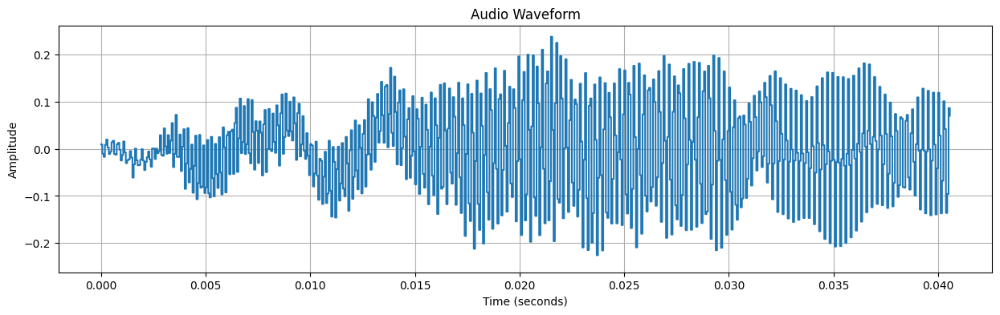

108607-109479


### Segment 35
- Start: **6.79 s**
- End: **6.84 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 872


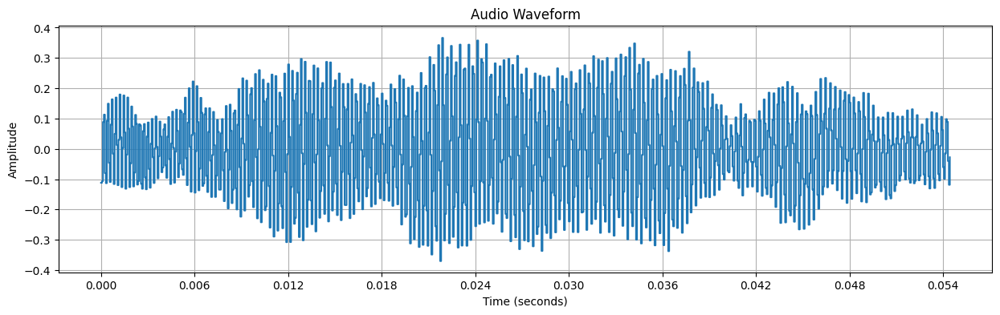

109479-110533


### Segment 35
- Start: **6.84 s**
- End: **6.91 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1054


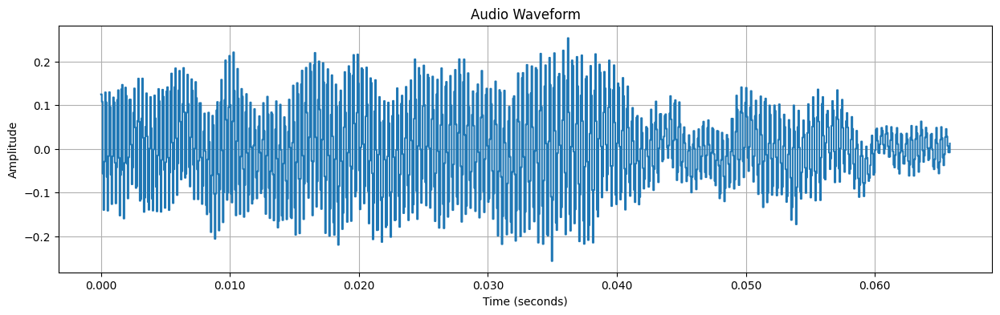

111283-113043


### Segment 35
- Start: **6.96 s**
- End: **7.07 s**
- Duration: **0.11 s**

Sample Rate: 16000
Duration: 0.11 seconds
Samples: 1760


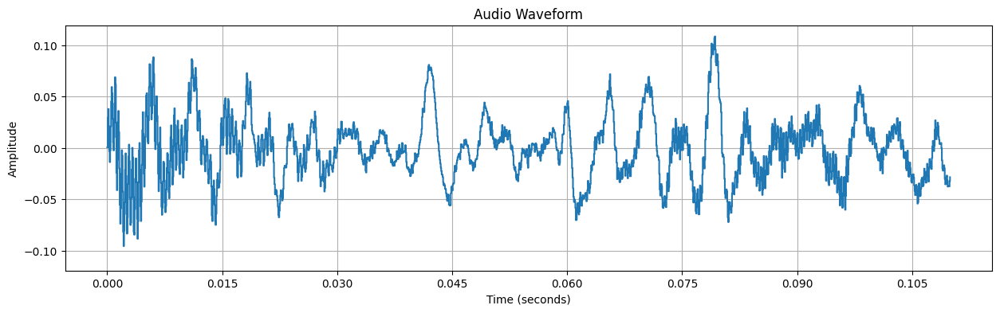

114286-115194


### Segment 35
- Start: **7.14 s**
- End: **7.20 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 908


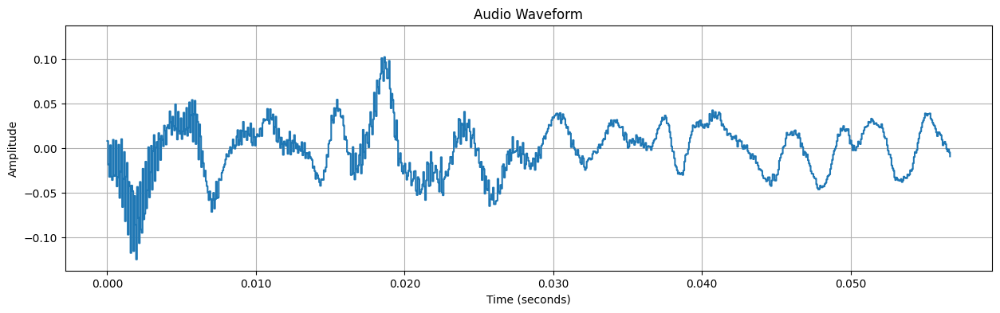

115826-116493


### Segment 35
- Start: **7.24 s**
- End: **7.28 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 667


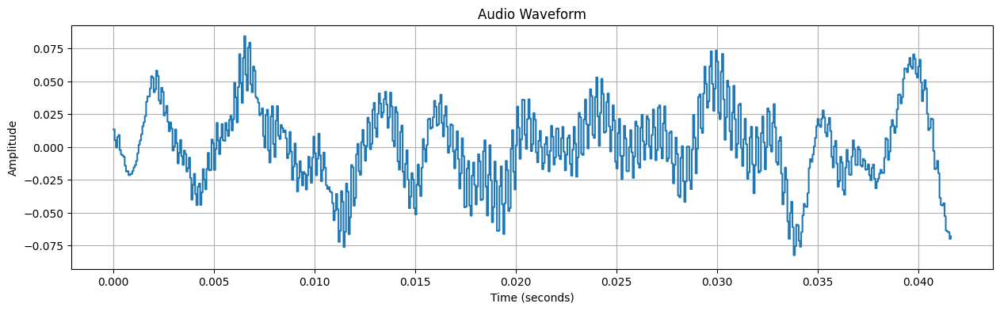

116493-116963


### Segment 35
- Start: **7.28 s**
- End: **7.31 s**
- Duration: **0.03 s**

Sample Rate: 16000
Duration: 0.03 seconds
Samples: 470


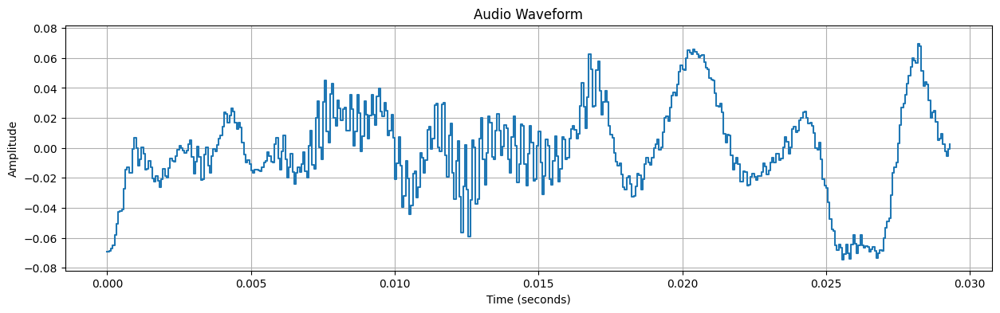

117505-118824


### Segment 35
- Start: **7.34 s**
- End: **7.43 s**
- Duration: **0.08 s**

Sample Rate: 16000
Duration: 0.08 seconds
Samples: 1319


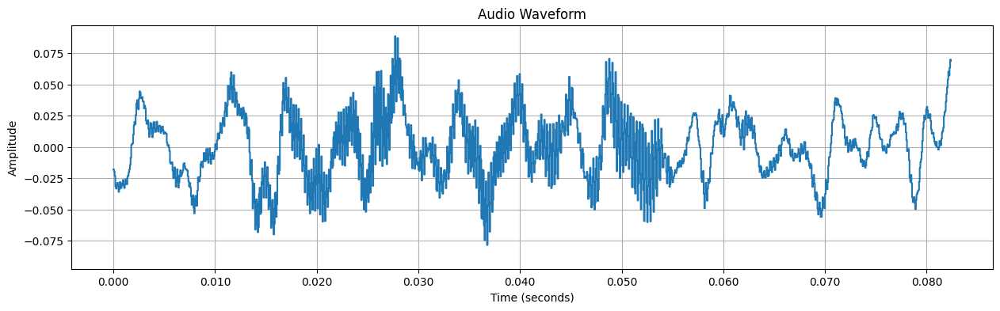

118824-119687


### Segment 35
- Start: **7.43 s**
- End: **7.48 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 863


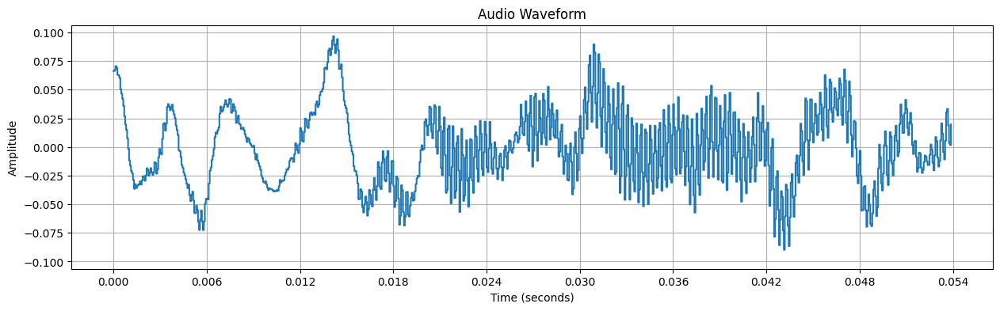

120557-121760


### Segment 35
- Start: **7.53 s**
- End: **7.61 s**
- Duration: **0.08 s**

Sample Rate: 16000
Duration: 0.08 seconds
Samples: 1203


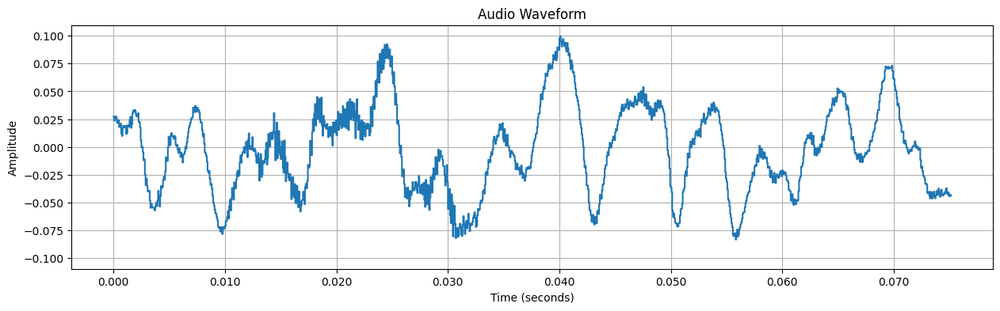

121760-123790


### Segment 35
- Start: **7.61 s**
- End: **7.74 s**
- Duration: **0.13 s**

Sample Rate: 16000
Duration: 0.13 seconds
Samples: 2030


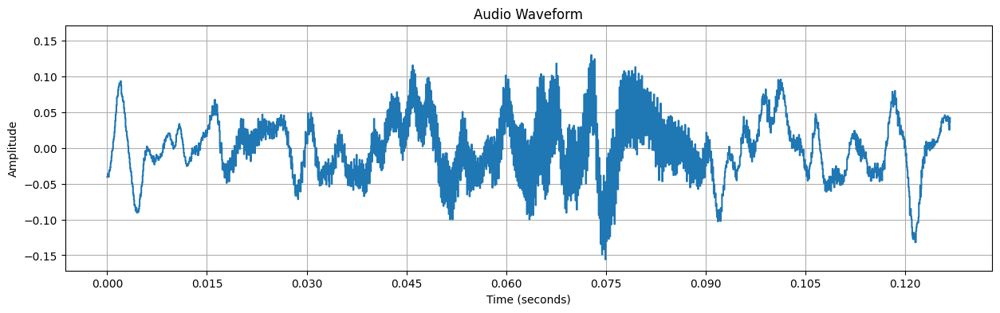

124650-125272


### Segment 35
- Start: **7.79 s**
- End: **7.83 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 622


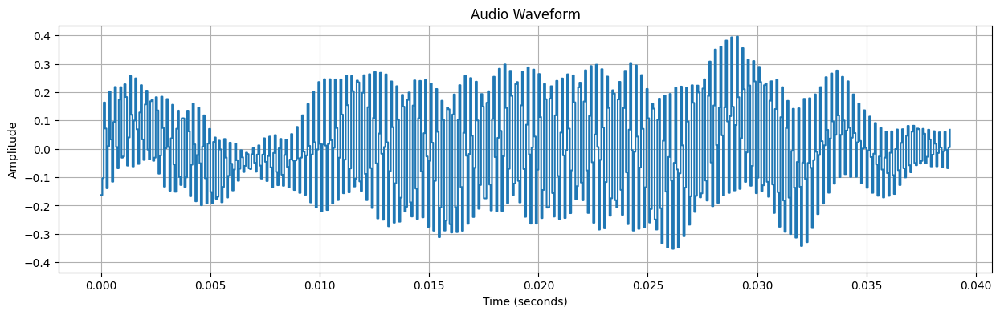

125272-125951


### Segment 35
- Start: **7.83 s**
- End: **7.87 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 679


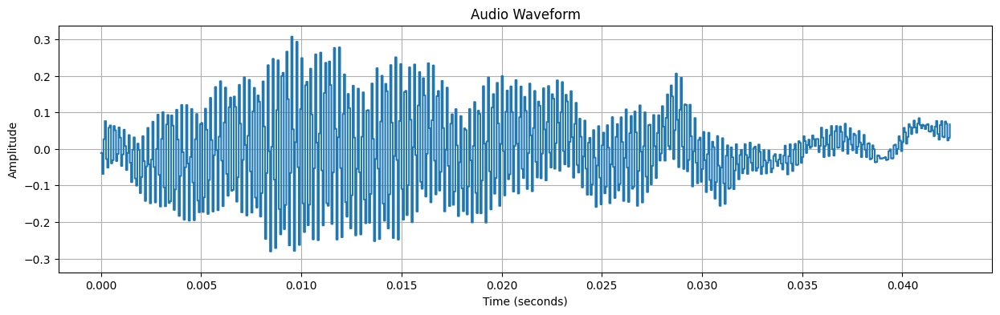

126544-127455


### Segment 35
- Start: **7.91 s**
- End: **7.97 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 911


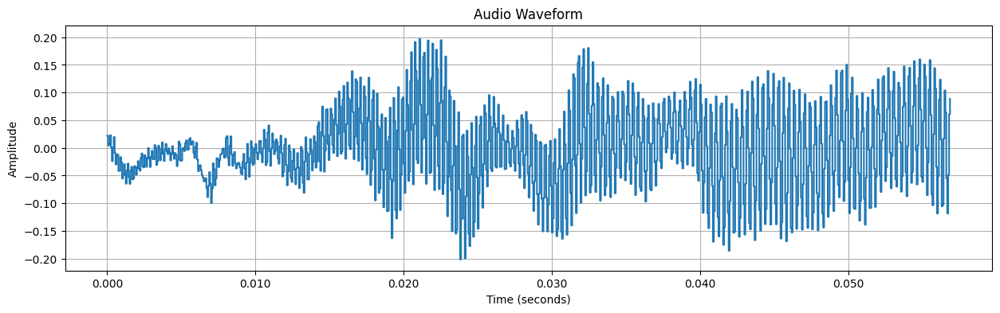

127455-128149


### Segment 35
- Start: **7.97 s**
- End: **8.01 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 694


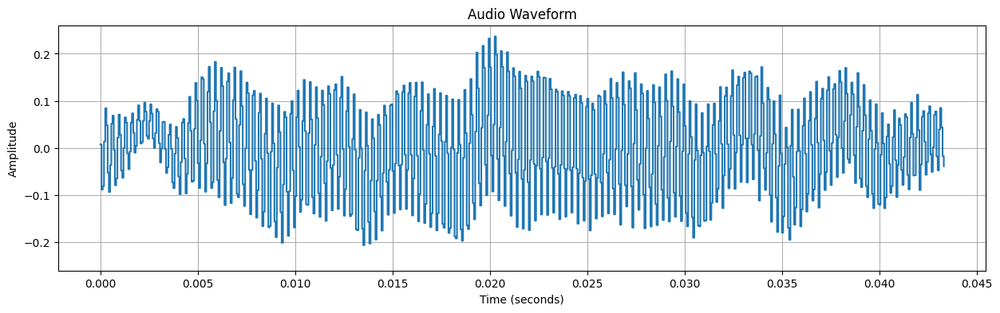

128550-129208


### Segment 35
- Start: **8.03 s**
- End: **8.08 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 658


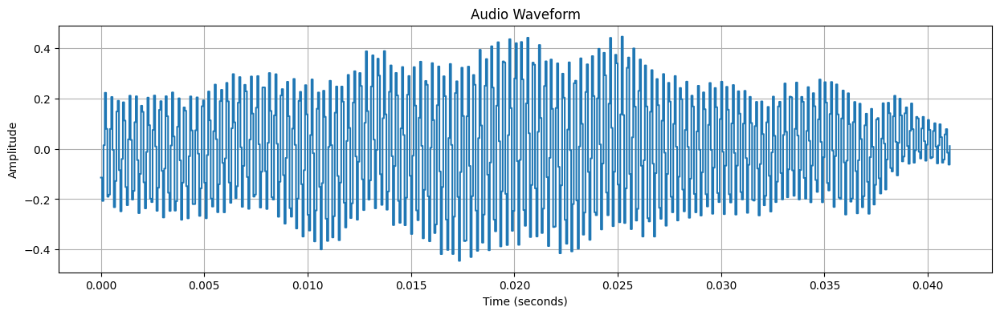

129208-130092


### Segment 35
- Start: **8.08 s**
- End: **8.13 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 884


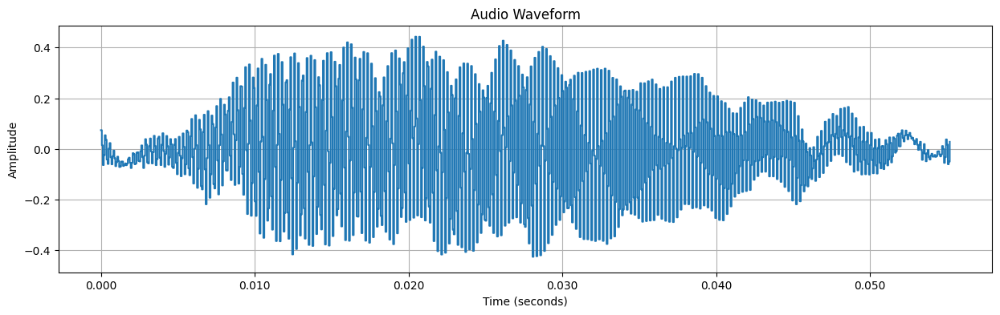

130092-130665


### Segment 35
- Start: **8.13 s**
- End: **8.17 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 573


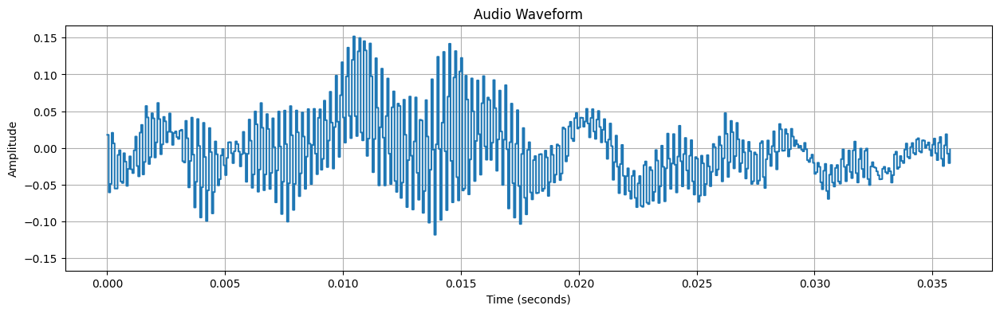

131348-132453


### Segment 35
- Start: **8.21 s**
- End: **8.28 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1105


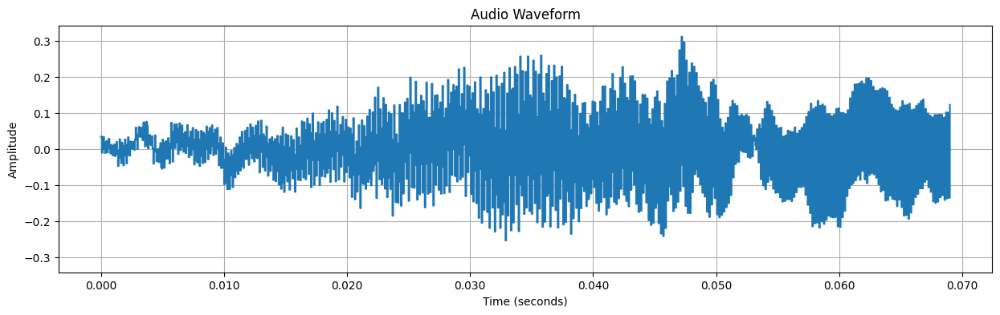

132854-133756


### Segment 35
- Start: **8.30 s**
- End: **8.36 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 902


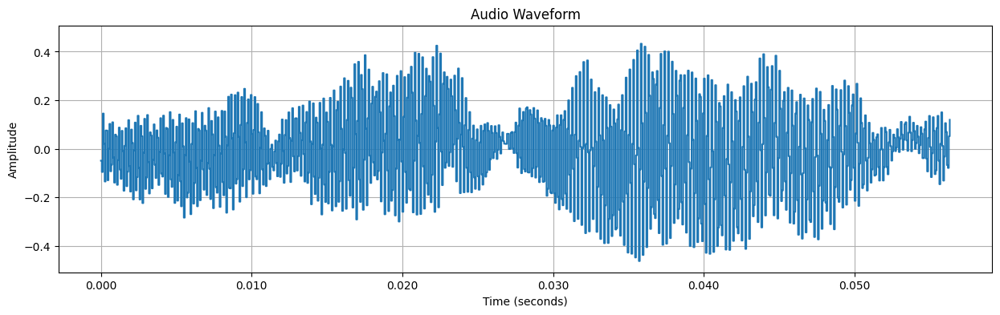

133756-134380


### Segment 35
- Start: **8.36 s**
- End: **8.40 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 624


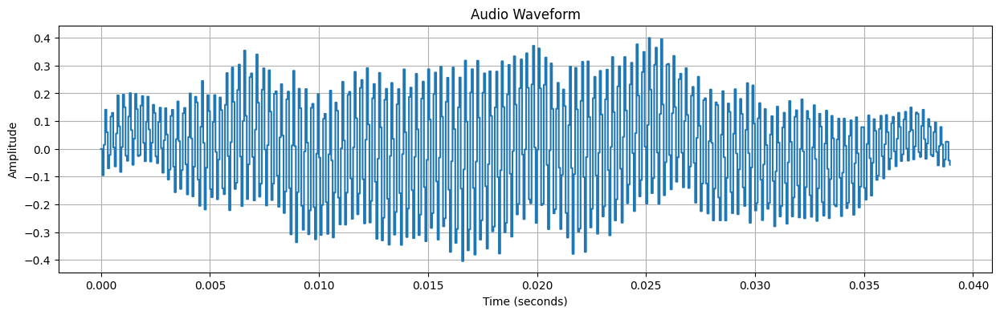

134380-134918


### Segment 35
- Start: **8.40 s**
- End: **8.43 s**
- Duration: **0.03 s**

Sample Rate: 16000
Duration: 0.03 seconds
Samples: 538


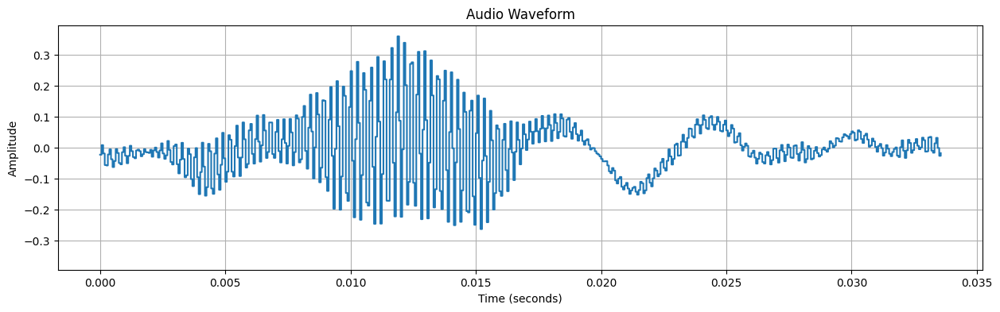

135578-136510


### Segment 35
- Start: **8.47 s**
- End: **8.53 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 932


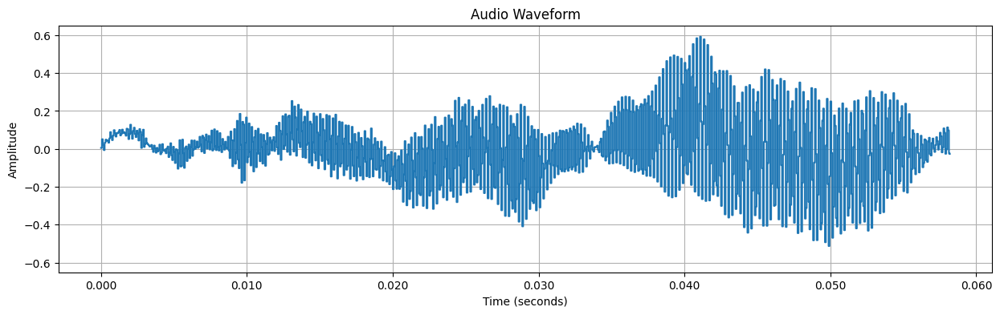

136510-136990


### Segment 35
- Start: **8.53 s**
- End: **8.56 s**
- Duration: **0.03 s**

Sample Rate: 16000
Duration: 0.03 seconds
Samples: 480


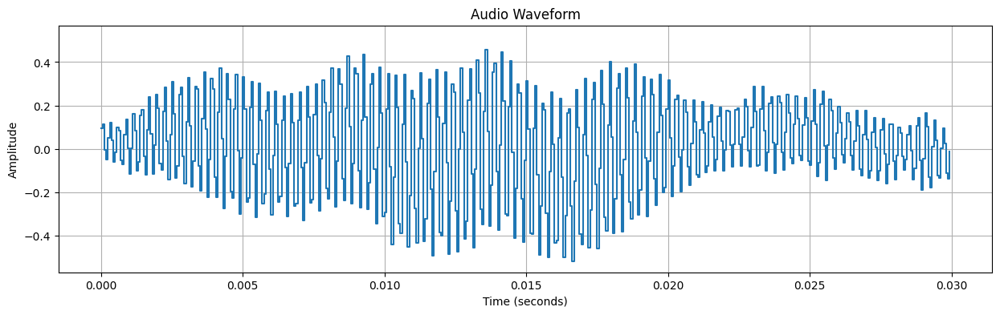

136990-137516


### Segment 35
- Start: **8.56 s**
- End: **8.59 s**
- Duration: **0.03 s**

Sample Rate: 16000
Duration: 0.03 seconds
Samples: 526


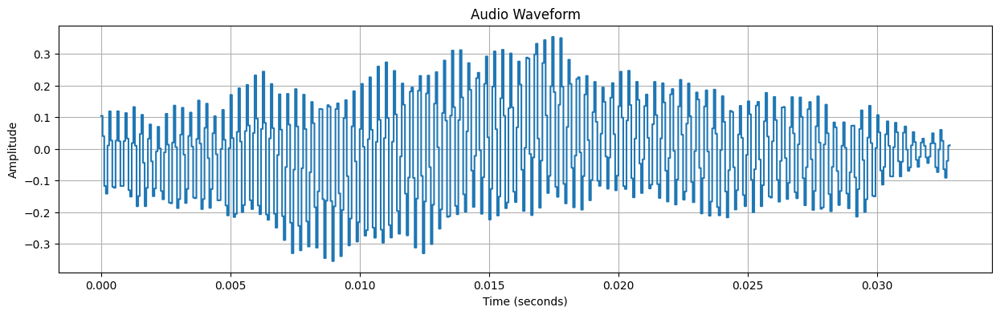

137516-138241


### Segment 35
- Start: **8.59 s**
- End: **8.64 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 725


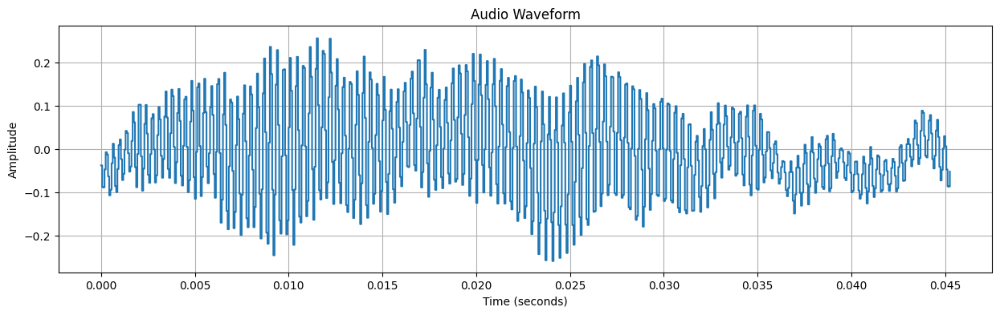

138241-138927


### Segment 35
- Start: **8.64 s**
- End: **8.68 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 686


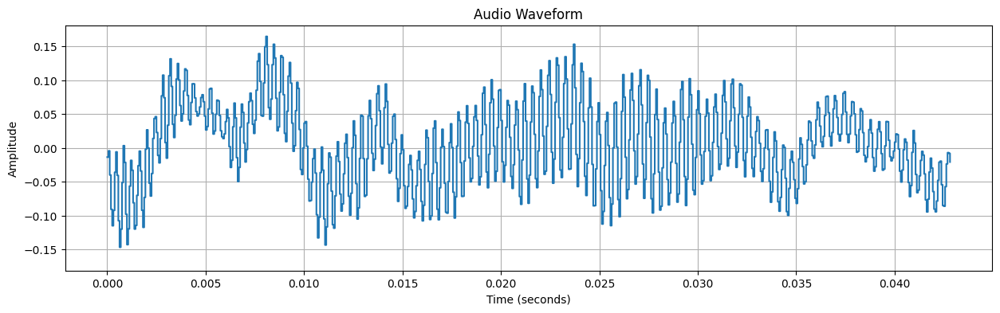

148042-149223


### Segment 35
- Start: **9.25 s**
- End: **9.33 s**
- Duration: **0.07 s**

Sample Rate: 16000
Duration: 0.07 seconds
Samples: 1181


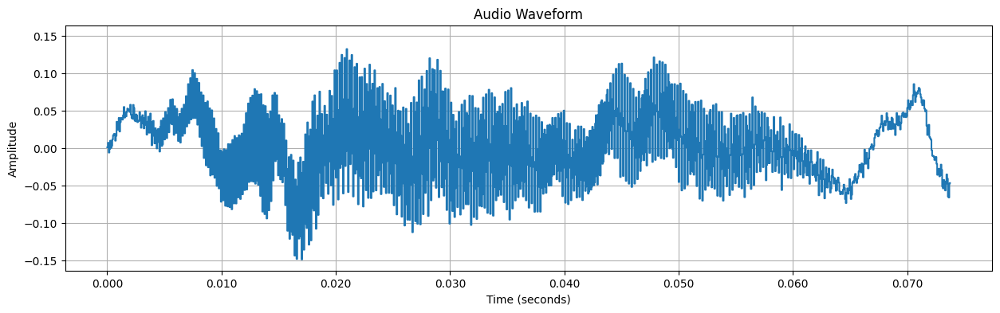

150530-151248


### Segment 35
- Start: **9.41 s**
- End: **9.45 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 718


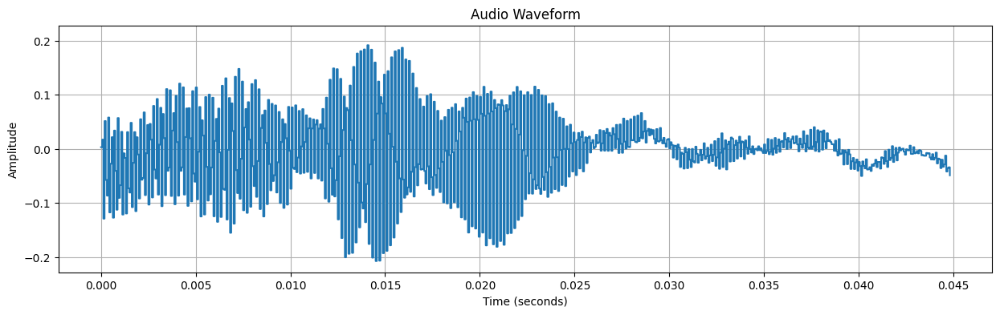

151248-152075


### Segment 35
- Start: **9.45 s**
- End: **9.50 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 827


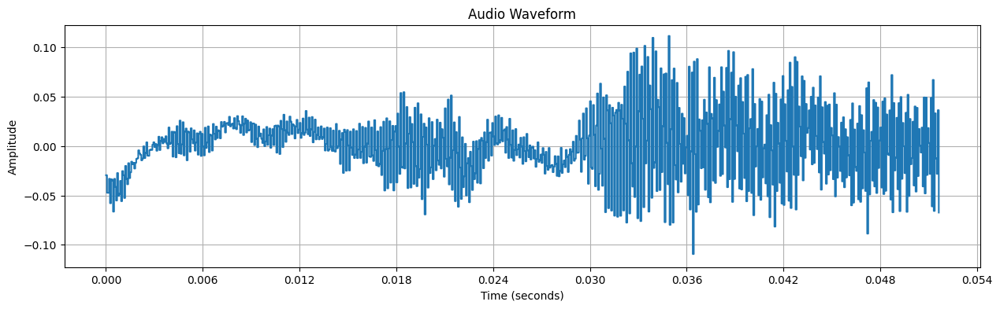

154157-154806


### Segment 35
- Start: **9.63 s**
- End: **9.68 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 649


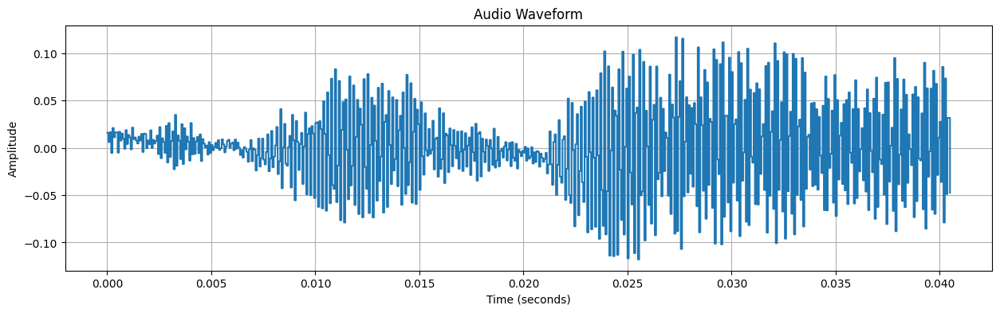

154806-157753


### Segment 35
- Start: **9.68 s**
- End: **9.86 s**
- Duration: **0.18 s**

Sample Rate: 16000
Duration: 0.18 seconds
Samples: 2947


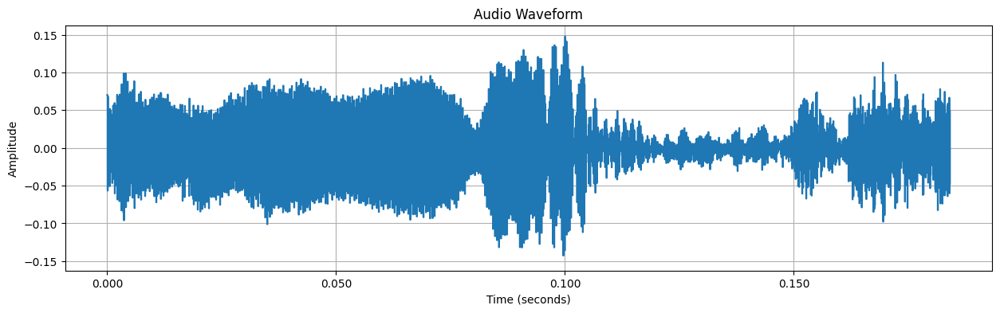

160375-161304


### Segment 35
- Start: **10.02 s**
- End: **10.08 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 929


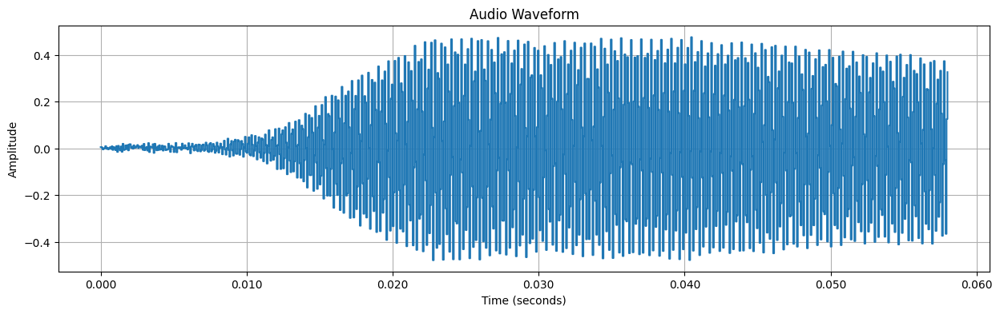

161304-161967


### Segment 35
- Start: **10.08 s**
- End: **10.12 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 663


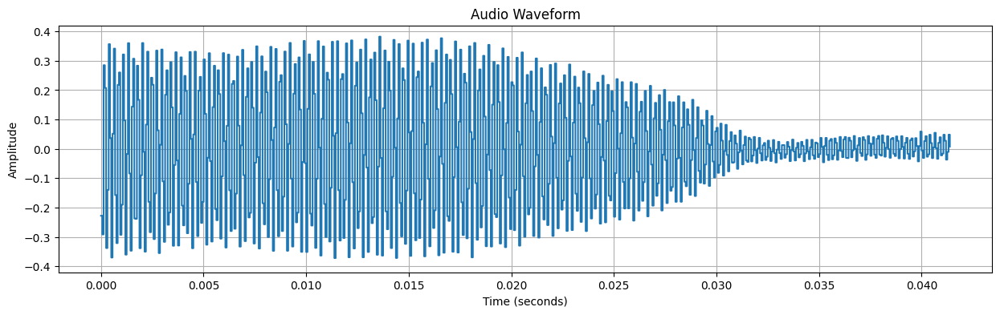

162368-163235


### Segment 35
- Start: **10.15 s**
- End: **10.20 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 867


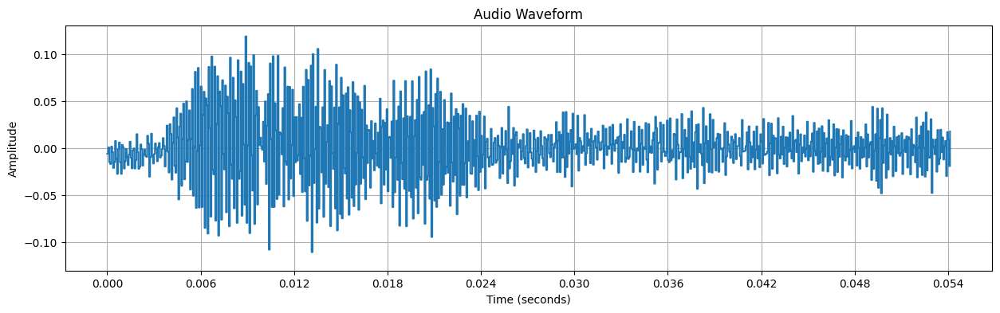

163636-164551


### Segment 35
- Start: **10.23 s**
- End: **10.28 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 915


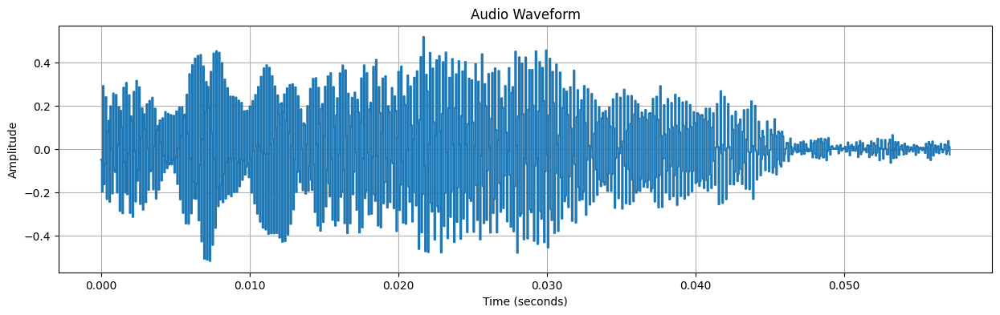

164551-165933


### Segment 35
- Start: **10.28 s**
- End: **10.37 s**
- Duration: **0.09 s**

Sample Rate: 16000
Duration: 0.09 seconds
Samples: 1382


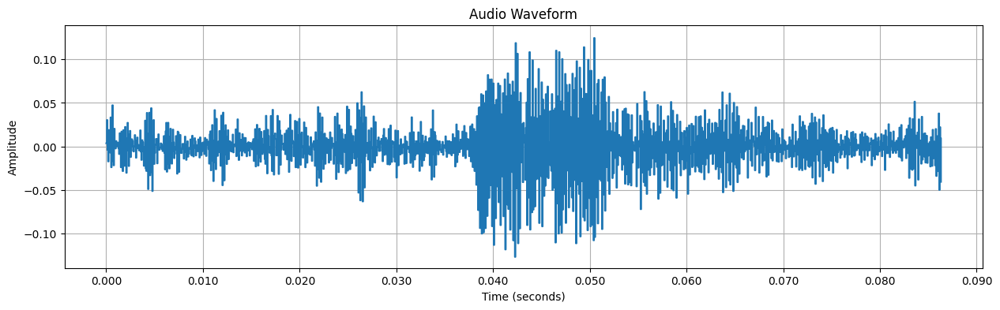

166334-167247


### Segment 35
- Start: **10.40 s**
- End: **10.45 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 913


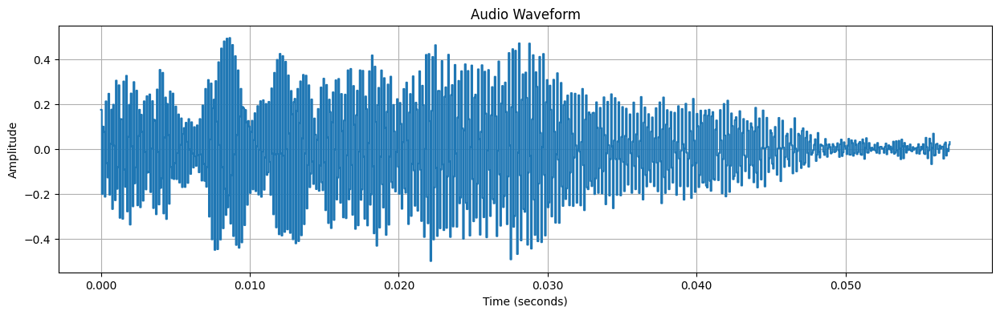

167247-168669


### Segment 35
- Start: **10.45 s**
- End: **10.54 s**
- Duration: **0.09 s**

Sample Rate: 16000
Duration: 0.09 seconds
Samples: 1422


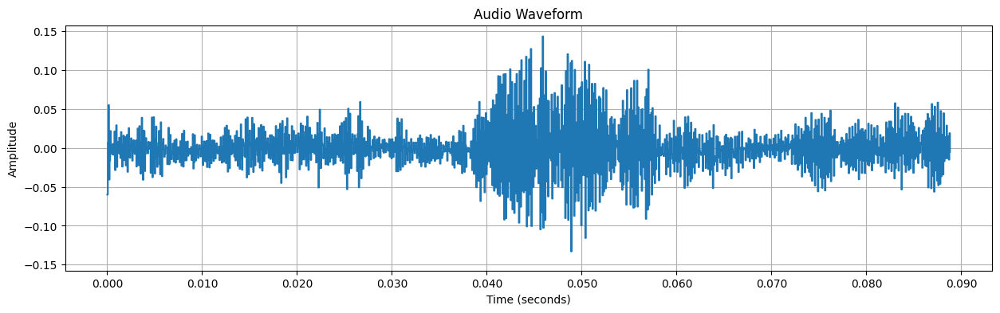

169070-170006


### Segment 35
- Start: **10.57 s**
- End: **10.63 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 936


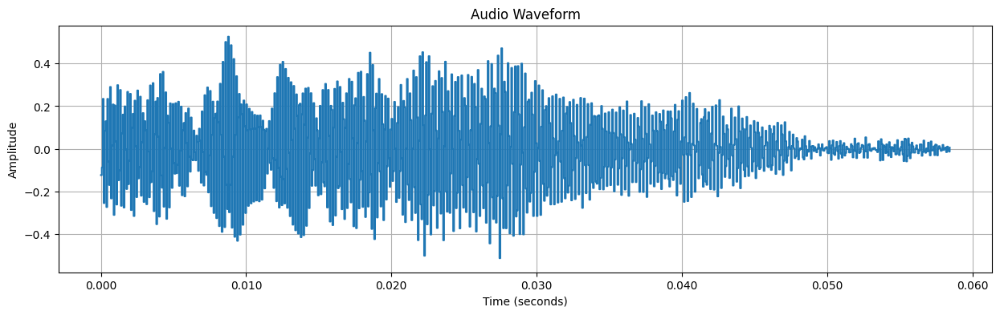

171782-172690


### Segment 35
- Start: **10.74 s**
- End: **10.79 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 908


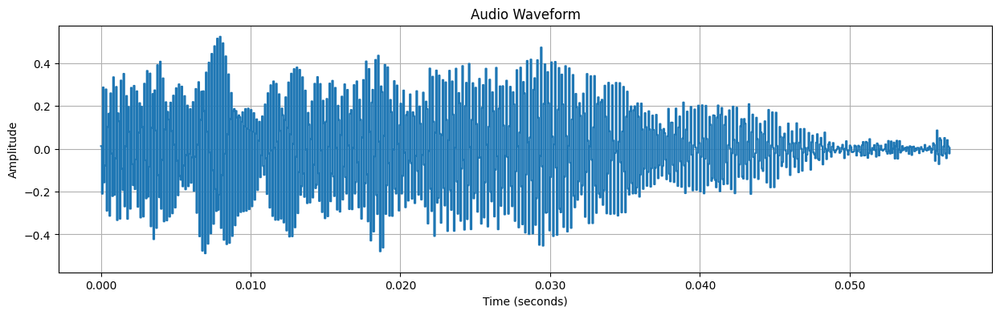

173091-174083


### Segment 35
- Start: **10.82 s**
- End: **10.88 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 992


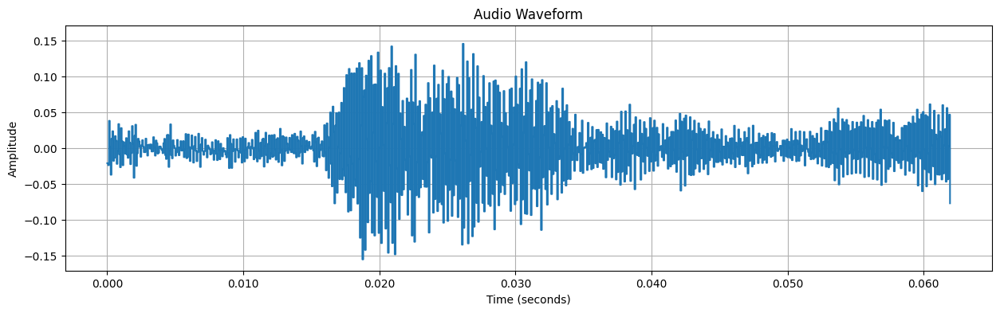

174484-175421


### Segment 35
- Start: **10.91 s**
- End: **10.96 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 937


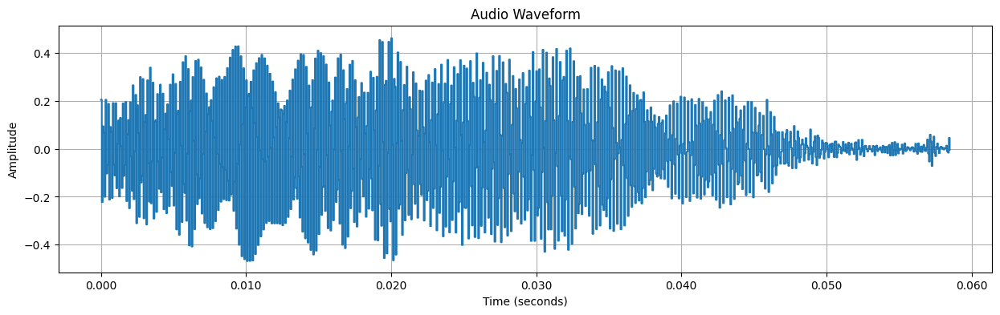

175822-176820


### Segment 35
- Start: **10.99 s**
- End: **11.05 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 998


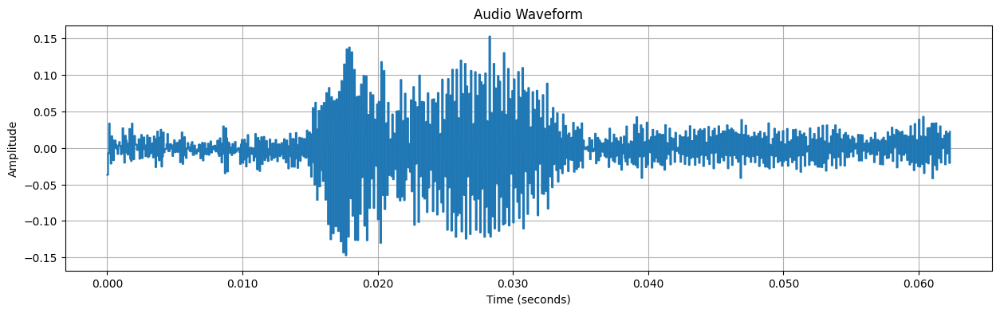

177221-178115


### Segment 35
- Start: **11.08 s**
- End: **11.13 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 894


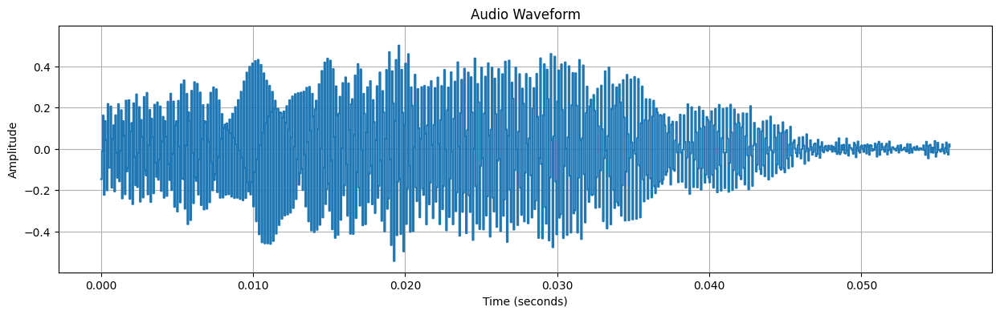

180900-181428


### Segment 35
- Start: **11.31 s**
- End: **11.34 s**
- Duration: **0.03 s**

Sample Rate: 16000
Duration: 0.03 seconds
Samples: 528


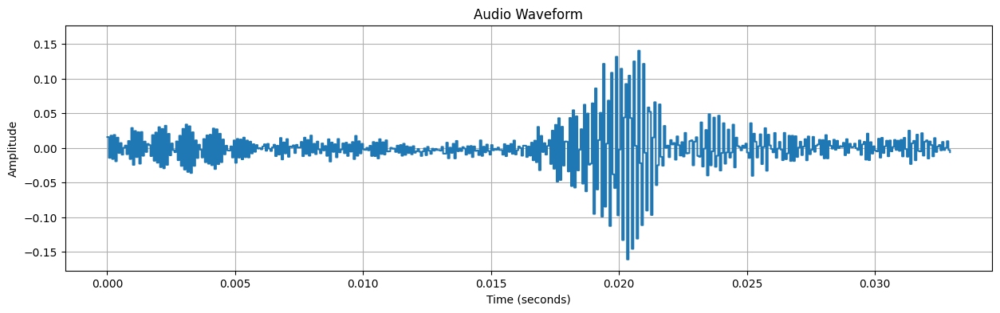

181428-181909


### Segment 35
- Start: **11.34 s**
- End: **11.37 s**
- Duration: **0.03 s**

Sample Rate: 16000
Duration: 0.03 seconds
Samples: 481


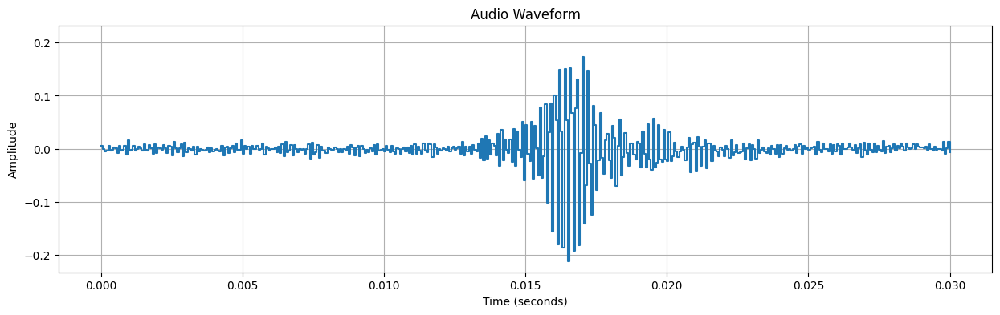

182310-182804


### Segment 35
- Start: **11.39 s**
- End: **11.43 s**
- Duration: **0.03 s**

Sample Rate: 16000
Duration: 0.03 seconds
Samples: 494


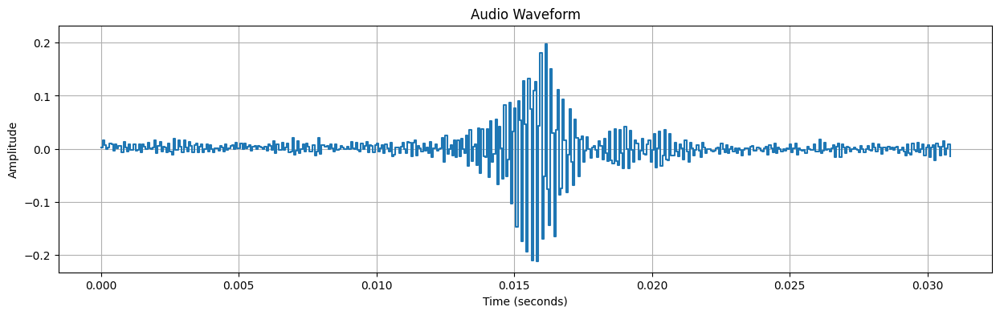

182804-183250


### Segment 35
- Start: **11.43 s**
- End: **11.45 s**
- Duration: **0.03 s**

Sample Rate: 16000
Duration: 0.03 seconds
Samples: 446


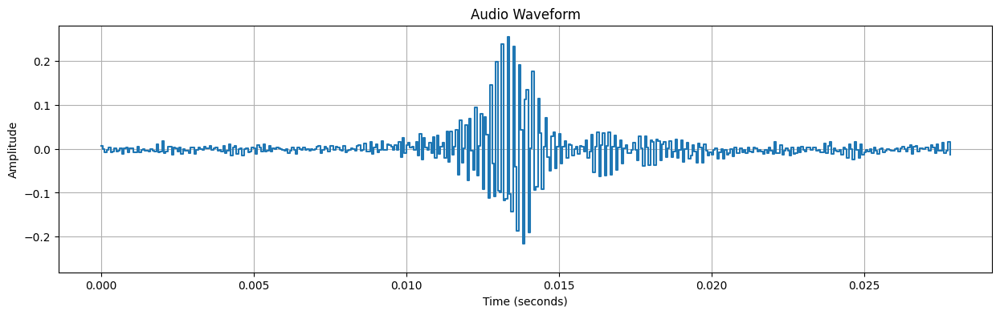

183250-183830


### Segment 35
- Start: **11.45 s**
- End: **11.49 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 580


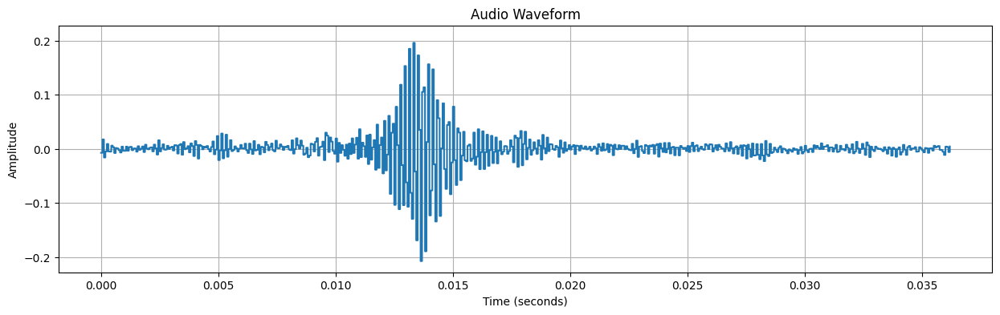

183830-184687


### Segment 35
- Start: **11.49 s**
- End: **11.54 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 857


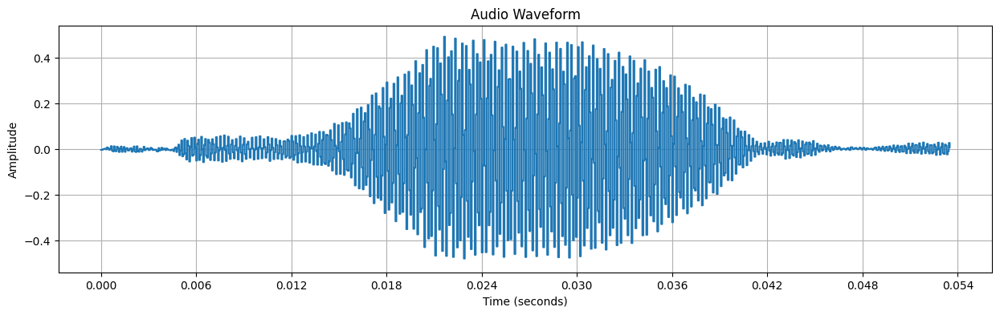

185924-187889


### Segment 35
- Start: **11.62 s**
- End: **11.74 s**
- Duration: **0.12 s**

Sample Rate: 16000
Duration: 0.12 seconds
Samples: 1965


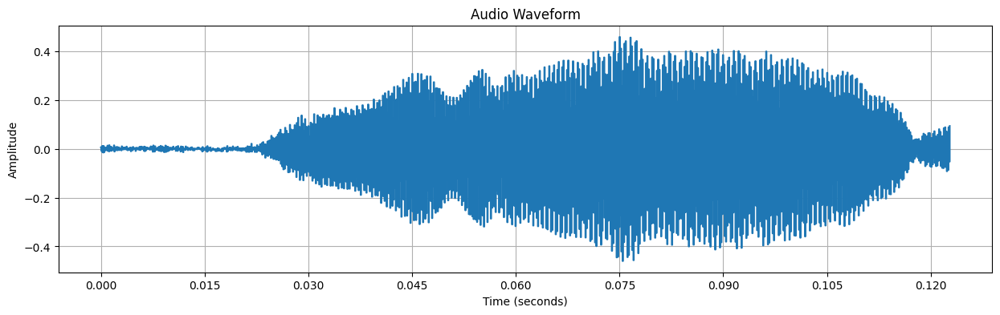

188290-189117


### Segment 35
- Start: **11.77 s**
- End: **11.82 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 827


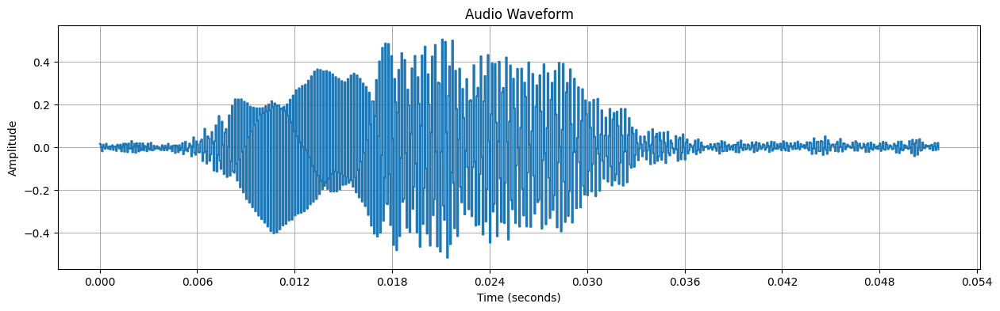

189117-190137


### Segment 35
- Start: **11.82 s**
- End: **11.88 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 1020


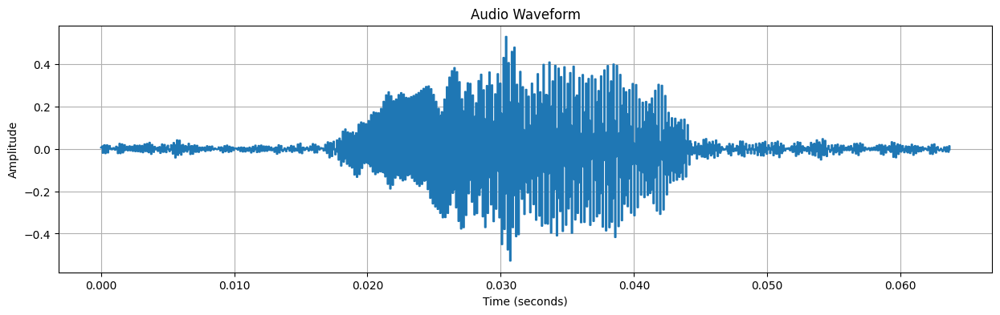

190137-191132


### Segment 35
- Start: **11.88 s**
- End: **11.95 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 995


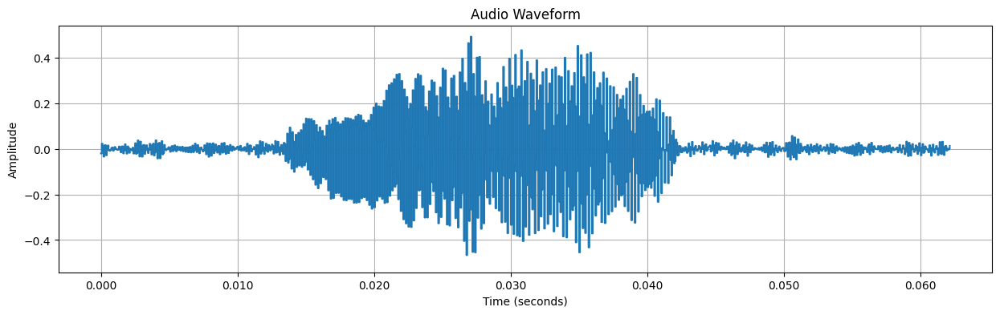

191132-192096


### Segment 35
- Start: **11.95 s**
- End: **12.01 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 964


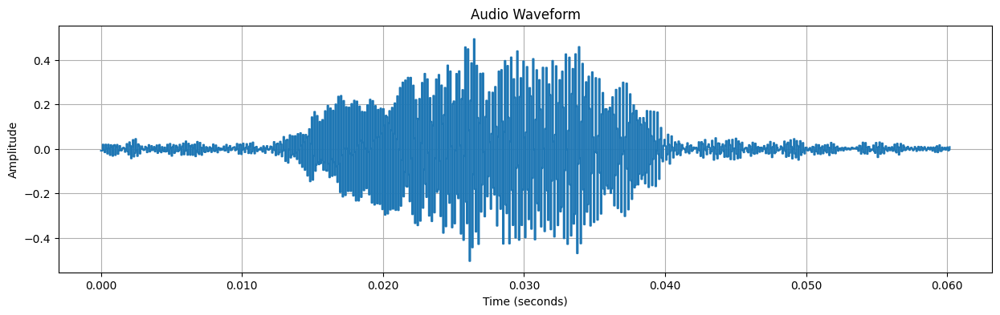

192096-192991


### Segment 35
- Start: **12.01 s**
- End: **12.06 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 895


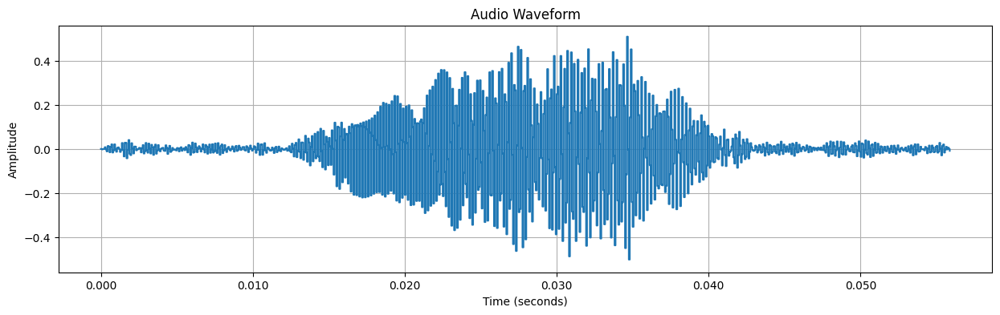

196735-198162


### Segment 35
- Start: **12.30 s**
- End: **12.39 s**
- Duration: **0.09 s**

Sample Rate: 16000
Duration: 0.09 seconds
Samples: 1427


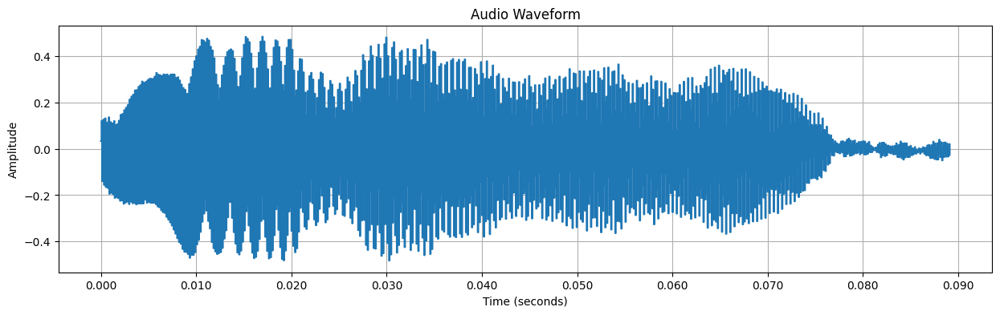

198701-199592


### Segment 35
- Start: **12.42 s**
- End: **12.47 s**
- Duration: **0.06 s**

Sample Rate: 16000
Duration: 0.06 seconds
Samples: 891


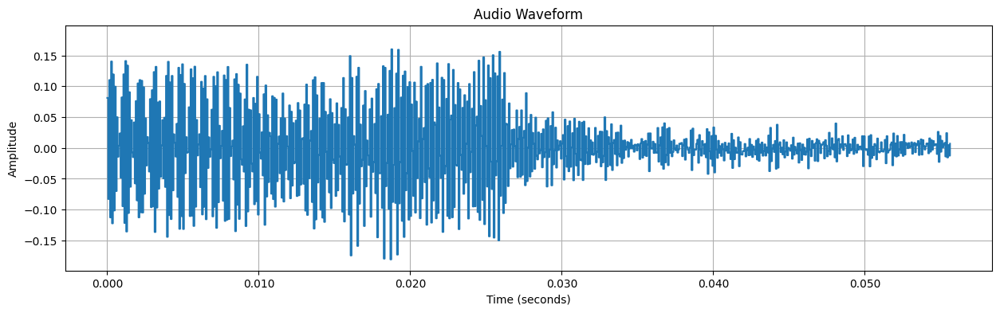

200014-200841


### Segment 35
- Start: **12.50 s**
- End: **12.55 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 827


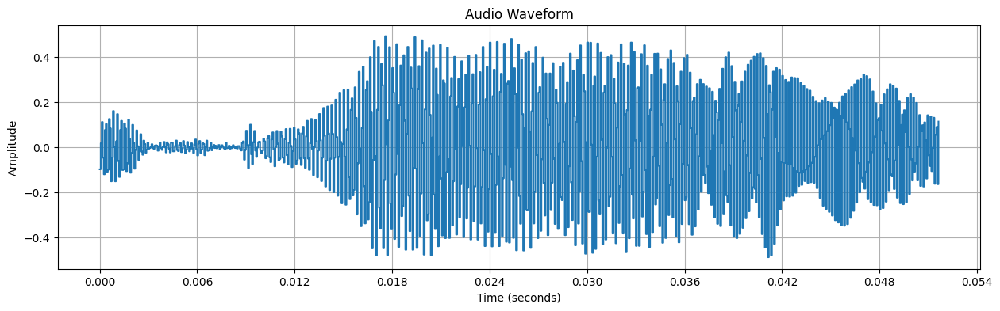

202216-202994


### Segment 35
- Start: **12.64 s**
- End: **12.69 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 778


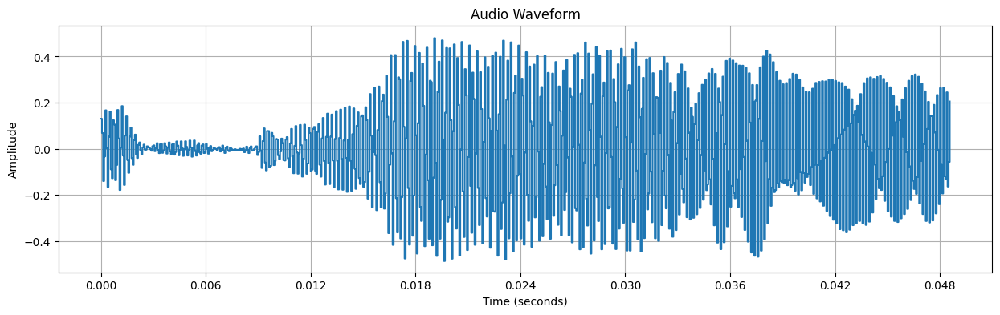

204363-205159


### Segment 35
- Start: **12.77 s**
- End: **12.82 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 796


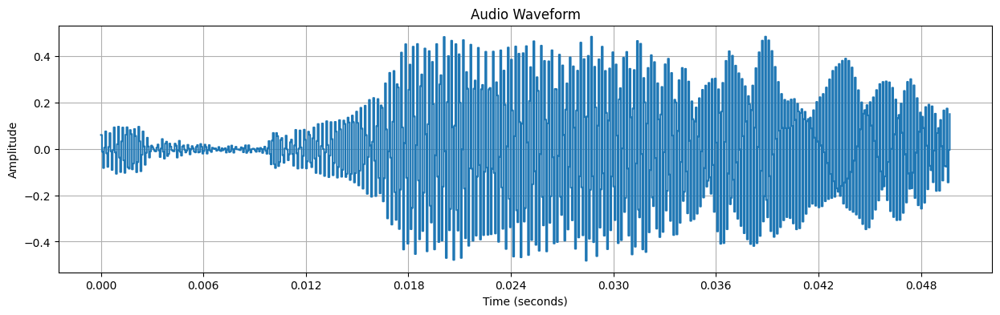

206510-207310


### Segment 35
- Start: **12.91 s**
- End: **12.96 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 800


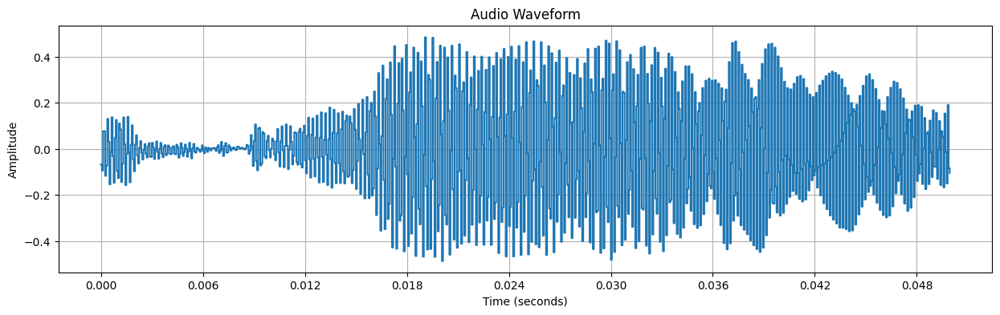

208628-209414


### Segment 35
- Start: **13.04 s**
- End: **13.09 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 786


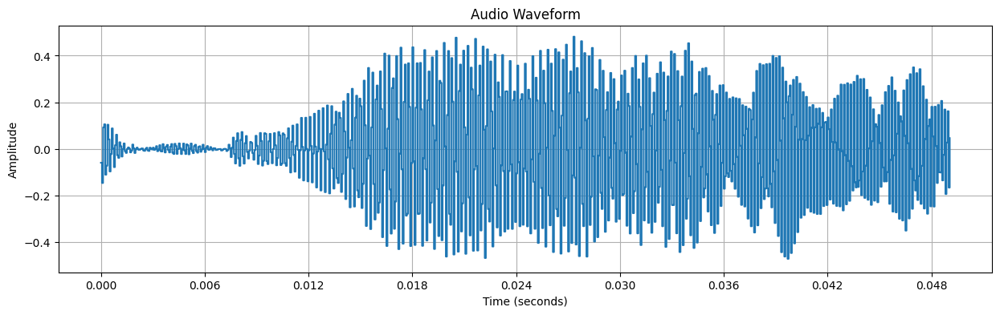

210792-211579


### Segment 35
- Start: **13.17 s**
- End: **13.22 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 787


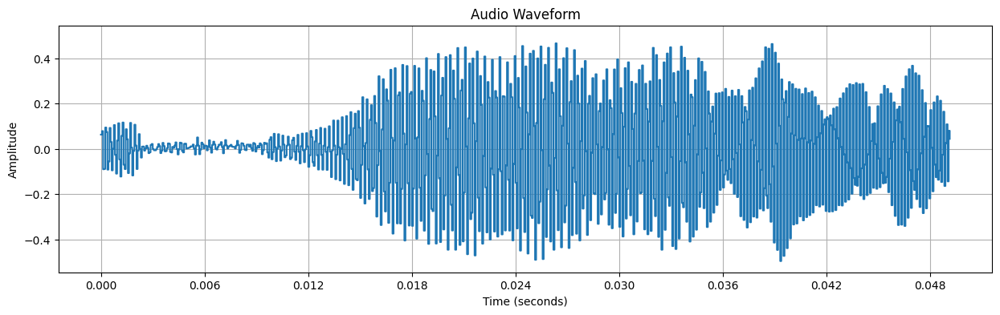

212967-213726


### Segment 35
- Start: **13.31 s**
- End: **13.36 s**
- Duration: **0.05 s**

Sample Rate: 16000
Duration: 0.05 seconds
Samples: 759


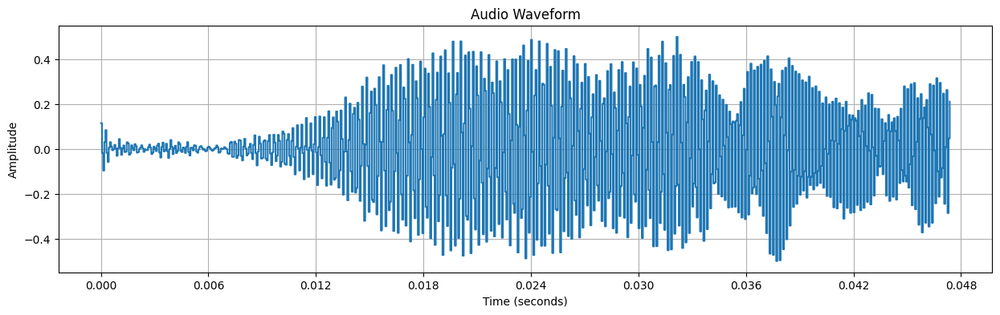

213726-214394


### Segment 35
- Start: **13.36 s**
- End: **13.40 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 668


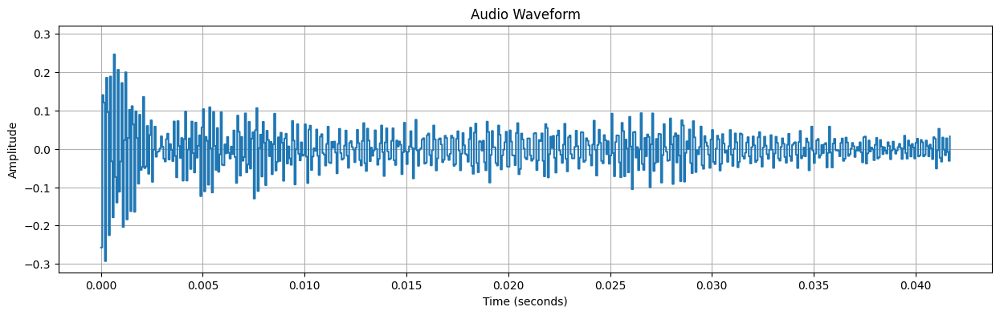

218867-219508


### Segment 35
- Start: **13.68 s**
- End: **13.72 s**
- Duration: **0.04 s**

Sample Rate: 16000
Duration: 0.04 seconds
Samples: 641


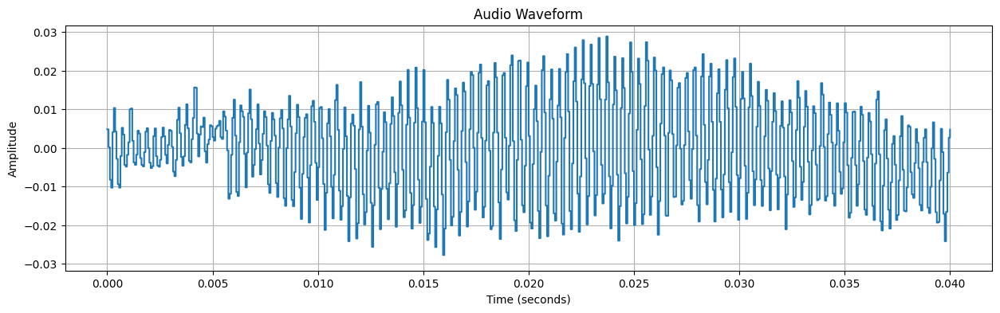

219508-252261


### Segment 35
- Start: **13.72 s**
- End: **15.77 s**
- Duration: **2.05 s**

Sample Rate: 16000
Duration: 2.05 seconds
Samples: 32753


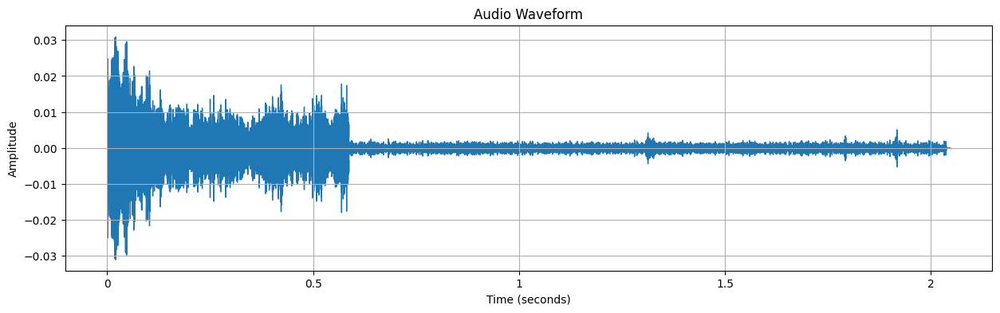

In [69]:
#show them to play on colab
import librosa
import numpy as np
from IPython.display import Audio, display, Markdown


print(f"Detected {len(breaks)} candidate segments\n")
for (st, en) in intervals:
  print(str(st)+"-"+str(en))
  segment = audio[st:en]
  duration = len(segment) / sr

  display(Markdown(
      f"### Segment {i+1}\n"
      f"- Start: **{st/sr:.2f} s**\n"
      f"- End: **{en/sr:.2f} s**\n"
      f"- Duration: **{duration:.2f} s**"
  ))

  display(Audio(segment, rate=sr))
  show_audio(segment, sr)


# for i, end_frame in enumerate(breaks):
#     end = end_frame * hop

#     # Skip segments shorter than 150 ms
#     if end - start < int(sr * 0.15):
#         continue

#     segment = y[start:end]

#     duration = len(segment) / sr

#     display(Markdown(
#         f"### Segment {i+1}\n"
#         f"- Start: **{start/sr:.2f} s**\n"
#         f"- End: **{end/sr:.2f} s**\n"
#         f"- Duration: **{duration:.2f} s**"
#     ))

#     display(Audio(segment, rate=sr))

#     start = end

#

In [70]:
import librosa

def get_MFCC_features(aud_chunk, smp_r):
  # MFCC features
  mfcc = librosa.feature.mfcc(
      y=aud_chunk,
      sr=smp_r,
      n_mfcc=20,
      hop_length=160,
      n_fft=400
  ).T

  return mfcc

In [72]:
mfccStore = []

print(f"Detected {len(intervals)} candidate segments\n")
for (st, en) in intervals:
  print(str(st)+"-"+str(en),end=" ")
  segment = audio[st:en]
  duration = len(segment) / sr
  mfcc = get_MFCC_features(segment, sr)
  #print(mfcc)
  mfccStore.append(mfcc)

Detected 140 candidate segments

478-1137 1538-2279 2915-3841 3841-4795 5223-6271 6271-7317 7718-8731 8731-9769 10170-11242 11644-12627 12627-13618 14019-14947 14947-15919 16451-17052 17052-17811 17811-18666 19166-19846 20762-21750 21750-22446 23633-24270 24724-25811 26324-26953 26953-27853 27853-29217 29778-31609 31609-32679 33475-34782 34782-35359 35359-36048 36048-36915 37518-38791 38791-39841 40378-41443 41443-42510 42963-44114 44114-45195 45865-46951 47417-48394 48394-49432 49833-50724 51125-51875 51875-53630 53630-54602 54602-55643 55643-56227 56227-57143 59855-60704 60704-62293 66259-67079 67079-68054 68054-68736 72401-73153 76216-76998 80165-80940 83777-84799 85374-87446 87847-88598 88598-90234 91855-92588 93157-94025 94025-95033 96459-96998 96998-97443 97443-98149 98817-99793 100194-100866 100866-101907 101907-102910 103534-104501 104947-105709 105709-107174 107957-108607 108607-109479 109479-110533 111283-113043 114286-115194 115826-116493 116493-116963 117505-118824 118824-1

In [36]:
!pip install dtw-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 808.9/808.9 kB 14.5 MB/s eta 0:00:00


In [73]:
from dtw import dtw
import numpy as np

# def similarity(mfcc1, mfcc2):
#     dist, *_ = dtw(
#         mfcc1,
#         mfcc2,
#         dist=lambda x, y: np.linalg.norm(x - y)
#     )
#     return dist

#     import librosa

def dtw_distance(mfcc1, mfcc2):
    D, wp = librosa.sequence.dtw(
        X=mfcc1.T,
        Y=mfcc2.T
        #,metric='euclidean'
    )
    return D[-1, -1]

edges = []
weighted_edges = []

for i in range(0, len(mfccStore)):

  mn_score = 0
  node_to = -1
  for j in range(0, len(mfccStore)):
    if i!=j:
      dtw_score = dtw_distance(mfccStore[i], mfccStore[j])
      #print(str(i)+" "+str(j)+" score="+str(dtw_score))
      #weighted_edges.append((i,j,dtw_score))
      if(node_to ==-1 or mn_score > dtw_score):
        mn_score = dtw_score
        node_to = j

  edges.append((i,node_to))
  weighted_edges.append((i,node_to,mn_score))


print(edges)



[(0, 19), (1, 28), (2, 3), (3, 11), (4, 6), (5, 7), (6, 7), (7, 9), (8, 11), (9, 10), (10, 9), (11, 33), (12, 10), (13, 21), (14, 13), (15, 18), (16, 21), (17, 14), (18, 40), (19, 27), (20, 13), (21, 22), (22, 21), (23, 22), (24, 0), (25, 19), (26, 16), (27, 19), (28, 18), (29, 39), (30, 2), (31, 33), (32, 4), (33, 11), (34, 35), (35, 11), (36, 4), (37, 9), (38, 39), (39, 38), (40, 18), (41, 51), (42, 46), (43, 49), (44, 50), (45, 51), (46, 48), (47, 43), (48, 46), (49, 43), (50, 44), (51, 52), (52, 56), (53, 58), (54, 58), (55, 59), (56, 52), (57, 59), (58, 53), (59, 60), (60, 59), (61, 62), (62, 77), (63, 62), (64, 84), (65, 85), (66, 87), (67, 62), (68, 61), (69, 71), (70, 92), (71, 69), (72, 94), (73, 95), (74, 75), (75, 77), (76, 77), (77, 62), (78, 76), (79, 77), (80, 75), (81, 75), (82, 91), (83, 88), (84, 64), (85, 65), (86, 94), (87, 62), (88, 91), (89, 68), (90, 82), (91, 82), (92, 77), (93, 71), (94, 95), (95, 94), (96, 97), (97, 96), (98, 80), (99, 100), (100, 101), (101, 1

In [74]:
import networkx as nx
import plotly.graph_objects as go

def visualize_graph(edges):
  G = nx.Graph()
  G.add_edges_from(edges)

  # 3D layout
  pos = nx.spring_layout(G, dim=3, seed=42)

  # Edge coordinates
  edge_x, edge_y, edge_z = [], [], []

  for u, v in G.edges():
      x0, y0, z0 = pos[u]
      x1, y1, z1 = pos[v]

      edge_x += [x0, x1, None]
      edge_y += [y0, y1, None]
      edge_z += [z0, z1, None]

  edge_trace = go.Scatter3d(
      x=edge_x,
      y=edge_y,
      z=edge_z,
      mode='lines',
      line=dict(width=2, color='gray'),
      hoverinfo='none'
  )

  # Node coordinates
  node_x = [pos[n][0] for n in G.nodes()]
  node_y = [pos[n][1] for n in G.nodes()]
  node_z = [pos[n][2] for n in G.nodes()]

  node_trace = go.Scatter3d(
      x=node_x,
      y=node_y,
      z=node_z,
      mode='markers+text',
      text=list(G.nodes()),
      textposition='top center',
      marker=dict(size=8)
  )

  fig = go.Figure([edge_trace, node_trace])

  fig.update_layout(
      scene=dict(
          xaxis_visible=False,
          yaxis_visible=False,
          zaxis_visible=False
      ),
      margin=dict(l=0, r=0, b=0, t=0)
  )

  fig.show()


# edges = [
#     (0,1), (0,2), (1,3), (2,3),
#     (3,4), (4,5), (2,5)
# ]

visualize_graph(edges)


In [52]:
!pip install networkx plotly

In [75]:
import networkx as nx
import numpy as np
import plotly.graph_objects as go

def visualize_weighted_graph(edges):
  G = nx.Graph()

  for u,v,d in edges:
      G.add_edge(u,v,weight=d)

  # Compute 3D positions.
  # Larger weight -> longer desired edge.
  pos = nx.spring_layout(
      G,
      dim=3,
      weight='weight',
      iterations=500,
      seed=42
  )

  # Edge coordinates
  edge_x, edge_y, edge_z = [], [], []

  for u,v,d in G.edges(data=True):
      x0,y0,z0 = pos[u]
      x1,y1,z1 = pos[v]

      edge_x += [x0,x1,None]
      edge_y += [y0,y1,None]
      edge_z += [z0,z1,None]

  edge_trace = go.Scatter3d(
      x=edge_x,
      y=edge_y,
      z=edge_z,
      mode='lines',
      line=dict(width=3,color='gray'),
      hoverinfo='none'
  )

  # Nodes
  node_x=[]
  node_y=[]
  node_z=[]
  labels=[]

  for n in G.nodes():
      x,y,z=pos[n]
      node_x.append(x)
      node_y.append(y)
      node_z.append(z)
      labels.append(str(n))

  node_trace = go.Scatter3d(
      x=node_x,
      y=node_y,
      z=node_z,
      mode='markers+text',
      text=labels,
      textposition='top center',
      marker=dict(
          size=8,
          color='dodgerblue'
      )
  )

  # Weight labels
  weight_traces=[]

  for u,v,d in G.edges(data=True):
      x=(pos[u][0]+pos[v][0])/2
      y=(pos[u][1]+pos[v][1])/2
      z=(pos[u][2]+pos[v][2])/2

      weight_traces.append(
          go.Scatter3d(
              x=[x],
              y=[y],
              z=[z],
              mode='text',
              text=[f"{d['weight']:.2f}"],
              showlegend=False
          )
      )

  fig = go.Figure([edge_trace,node_trace]+weight_traces)

  fig.update_layout(
      scene=dict(
          xaxis_visible=False,
          yaxis_visible=False,
          zaxis_visible=False
      ),
      margin=dict(l=0,r=0,b=0,t=0)
  )

  fig.show()

# (node1, node2, distance)
# edges = [
#     (0,1,0.2),
#     (0,2,1.0),
#     (1,2,0.5),
#     (1,3,2.0),
#     (2,4,1.5),
#     (3,4,0.7),
#     (4,5,3.0),
#     (4,1,4.7),
#     (4,0,6.7)
# ]
visualize_weighted_graph(weighted_edges)

In [79]:
from collections import defaultdict

def connected_components(edges):
    """
    edges: list of (u, v, weight)

    Returns:
        List of connected components, each as a list of nodes.
    """

    graph = defaultdict(list)

    # Build adjacency list
    for u, v, w in edges:
        graph[u].append(v)
        graph[v].append(u)

    visited = set()
    components = []

    for node in graph:
        if node not in visited:
            stack = [node]
            visited.add(node)
            component = []

            while stack:
                cur = stack.pop()
                component.append(cur)

                for nei in graph[cur]:
                    if nei not in visited:
                        visited.add(nei)
                        stack.append(nei)

            components.append(component)

    return components

components = connected_components(weighted_edges)
print(components)

[[0, 139, 24, 19, 25, 27], [1, 28, 18, 40, 15], [2, 30, 3, 11, 35, 34, 33, 31, 8], [4, 36, 32, 6, 7, 9, 37, 10, 12, 5], [13, 20, 14, 17, 21, 22, 23, 16, 26], [29, 39, 38], [41, 51, 52, 56, 45], [42, 46, 48], [43, 47, 49], [44, 50], [53, 58, 54], [55, 59, 60, 57], [61, 68, 89, 62, 87, 66, 67, 63, 77, 92, 70, 79, 76, 78, 75, 81, 80, 98, 74], [64, 84], [65, 85], [69, 71, 93], [72, 94, 95, 73, 86], [82, 90, 91, 88, 83], [96, 97], [99, 100, 101, 105, 102, 119, 118, 117, 120, 138, 122, 116, 129], [103, 104, 121], [106, 108, 113, 111], [107, 112, 114, 109], [110, 115], [123, 124, 126, 127, 125, 128], [130, 131, 135, 133, 132, 134, 137, 136]]


In [87]:
# show similar sounding clips

for component in components:
  print(component)
  for ind in component:
    (st, en) = intervals[ind]
    print(str(ind)+" => "+str(st)+"-"+str(en))
    segment = audio[st:en]
    show_audio_player(segment, sr)

[0, 139, 24, 19, 25, 27]
0 => 478-1137


139 => 219508-252261


24 => 29778-31609


19 => 23633-24270


25 => 31609-32679


27 => 34782-35359


[1, 28, 18, 40, 15]
1 => 1538-2279


28 => 35359-36048


18 => 21750-22446


40 => 51125-51875


15 => 17811-18666


[2, 30, 3, 11, 35, 34, 33, 31, 8]
2 => 2915-3841


30 => 37518-38791


3 => 3841-4795


11 => 14019-14947


35 => 44114-45195


34 => 42963-44114


33 => 41443-42510


31 => 38791-39841


8 => 10170-11242


[4, 36, 32, 6, 7, 9, 37, 10, 12, 5]
4 => 5223-6271


36 => 45865-46951


32 => 40378-41443


6 => 7718-8731


7 => 8731-9769


9 => 11644-12627


37 => 47417-48394


10 => 12627-13618


12 => 14947-15919


5 => 6271-7317


[13, 20, 14, 17, 21, 22, 23, 16, 26]
13 => 16451-17052


20 => 24724-25811


14 => 17052-17811


17 => 20762-21750


21 => 26324-26953


22 => 26953-27853


23 => 27853-29217


16 => 19166-19846


26 => 33475-34782


[29, 39, 38]
29 => 36048-36915


39 => 49833-50724


38 => 48394-49432


[41, 51, 52, 56, 45]
41 => 51875-53630


51 => 72401-73153


52 => 76216-76998


56 => 87847-88598


45 => 56227-57143


[42, 46, 48]
42 => 53630-54602


46 => 59855-60704


48 => 66259-67079


[43, 47, 49]
43 => 54602-55643


47 => 60704-62293


49 => 67079-68054


[44, 50]
44 => 55643-56227


50 => 68054-68736


[53, 58, 54]
53 => 80165-80940


58 => 91855-92588


54 => 83777-84799


[55, 59, 60, 57]
55 => 85374-87446


59 => 93157-94025


60 => 94025-95033


57 => 88598-90234


[61, 68, 89, 62, 87, 66, 67, 63, 77, 92, 70, 79, 76, 78, 75, 81, 80, 98, 74]
61 => 96459-96998


68 => 103534-104501


89 => 131348-132453


62 => 96998-97443


87 => 129208-130092


66 => 100866-101907


67 => 101907-102910


63 => 97443-98149


77 => 116493-116963


92 => 134380-134918


70 => 105709-107174


79 => 118824-119687


76 => 115826-116493


78 => 117505-118824


75 => 114286-115194


81 => 121760-123790


80 => 120557-121760


98 => 148042-149223


74 => 111283-113043


[64, 84]
64 => 98817-99793


84 => 126544-127455


[65, 85]
65 => 100194-100866


85 => 127455-128149


[69, 71, 93]
69 => 104947-105709


71 => 107957-108607


93 => 135578-136510


[72, 94, 95, 73, 86]
72 => 108607-109479


94 => 136510-136990


95 => 136990-137516


73 => 109479-110533


86 => 128550-129208


[82, 90, 91, 88, 83]
82 => 124650-125272


90 => 132854-133756


91 => 133756-134380


88 => 130092-130665


83 => 125272-125951


[96, 97]
96 => 137516-138241


97 => 138241-138927


[99, 100, 101, 105, 102, 119, 118, 117, 120, 138, 122, 116, 129]
99 => 150530-151248


100 => 151248-152075


101 => 154157-154806


105 => 162368-163235


102 => 154806-157753


119 => 182804-183250


118 => 182310-182804


117 => 181428-181909


120 => 183250-183830


138 => 218867-219508


122 => 185924-187889


116 => 180900-181428


129 => 198701-199592


[103, 104, 121]
103 => 160375-161304


104 => 161304-161967


121 => 183830-184687


[106, 108, 113, 111]
106 => 163636-164551


108 => 166334-167247


113 => 174484-175421


111 => 171782-172690


[107, 112, 114, 109]
107 => 164551-165933


112 => 173091-174083


114 => 175822-176820


109 => 167247-168669


[110, 115]
110 => 169070-170006


115 => 177221-178115


[123, 124, 126, 127, 125, 128]
123 => 188290-189117


124 => 189117-190137


126 => 191132-192096


127 => 192096-192991


125 => 190137-191132


128 => 196735-198162


[130, 131, 135, 133, 132, 134, 137, 136]
130 => 200014-200841


131 => 202216-202994


135 => 210792-211579


133 => 206510-207310


132 => 204363-205159


134 => 208628-209414


137 => 213726-214394


136 => 212967-213726
